- 测试
- 重新定义特征以及信号的特征数据性质
- 活动事件检测，在标准化之后将每个神经元信号中的数值大于等于2的部分识别为潜在活动片段的起始
- 跟踪活动过程中的峰值，并在信号回落到1时认为活动片段结束
- 检查活动片段的持续时间，如果大于等于0.5秒（根据帧率转换为相应的帧数），则判定为有效活动事件
- 记录每个有效活动的起始帧、结束帧、持续时间和峰值

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re 
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler
import time
import random
import math

%matplotlib inline

d:\software\anaconda3\envs\torch2\lib\site-packages\tqdm-4.67.1-py3.10.egg\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path_signal_neuron = r'E:\rq\M2\信号数据\第二批\post\LHQ30\TST'
path_save = r'E:\rq\M2\临时图像2\LHQ30 post'
path_behavior = r'E:\rq\M2\有设备小鼠 行为数据\spare\第二批\post\LHQ30'

# 读取实际数据
df_signal_neuron = pd.read_csv(path_signal_neuron+'\C.csv')
df_raw_neuron = pd.read_csv(path_signal_neuron+'\YrA.csv')
try:
    df_drop_id_neuron = pd.read_excel(path_signal_neuron+'\pic\drop.xlsx',header=None) 
except:
    print('drop id not found')
    df_drop_id_neuron = None

# 确保列名统一
df_signal_neuron = df_signal_neuron.rename(columns={"unit_id":"unit_id","frame":"t","C":"value"})
df_raw_neuron = df_raw_neuron.rename(columns={"unit_id":"unit_id","frame":"t","YrA":"value"})

# Step 2: 以 C 为主，获取有效 ID
if df_drop_id_neuron is not None:
    valid_ids_neuron = set(df_signal_neuron['unit_id'].unique()) - set(df_drop_id_neuron[0].values.tolist())
else:
    valid_ids_neuron = set(df_signal_neuron['unit_id'].unique())

# Step 3: 筛选 YrA 和 C 中的有效 ID
df_raw_neuron = df_raw_neuron[df_raw_neuron['unit_id'].isin(valid_ids_neuron)].copy()
df_signal_neuron = df_signal_neuron[df_signal_neuron['unit_id'].isin(valid_ids_neuron)].copy()

def downsample_data(df):
    # 确保按unit_id和t排序
    df_sorted = df.sort_values(['unit_id', 't']).copy()
        # 创建分组键，每3帧一组
    df_sorted['group'] = df_sorted.groupby('unit_id')['t'].transform(lambda x: (x - x.min()) // 3)
        # 按unit_id和group分组，计算value的平均值，t取每组的第一个值
    df_downsampled = df_sorted.groupby(['unit_id', 'group']).agg({'t': 'first', 'value': 'mean'}).reset_index(level='unit_id').reset_index(drop=True)
    return df_downsampled

# 应用下采样函数
df_raw_neuron = downsample_data(df_raw_neuron)
# 保存下采样前的数据用于对比
df_signal_neuron_before = df_signal_neuron.copy()
df_signal_neuron = downsample_data(df_signal_neuron)

# 5. 标准化 C：按 id 分组
df_neuron = pd.merge(df_raw_neuron, df_signal_neuron, on=['unit_id', 't'], suffixes=('_YrA', '_C'))

df_neuron['residual'] = df_neuron['value_YrA'] - df_neuron['value_C']
df_neuron['value_z'] = df_neuron['value_C'] / df_neuron.groupby('unit_id')['residual'].transform('std')

# 行列转换
resized_df_signal_neuron_raw = df_neuron.pivot(index='t', columns='unit_id', values='value_z').reset_index(drop=True)  # 行=时间，列=id

# 对neuron1和neuron2的每一列进行z-score标准化
resized_df_signal_neuron = resized_df_signal_neuron_raw.apply(zscore, axis=0)

In [3]:
# 每列代表一个神经元，每行代表一个时间帧

# 设置参数
fps = 10  # 假设帧率为10帧/秒（您可以根据实际情况调整）
min_duration = 0.5  # 有效活动事件的最小持续时间（秒）
min_duration_frames = int(min_duration * fps)  # 转换为帧数
start_threshold = 2  # 活动起始阈值
end_threshold = 1  # 活动结束阈值

# 创建一个字典来存储每个神经元的有效活动事件
neuron_events = {}

# 遍历每个神经元（列）
for neuron_id in resized_df_signal_neuron.columns:
    # 获取该神经元的信号
    signal = resized_df_signal_neuron[neuron_id].values
    
    # 存储该神经元的有效活动事件
    valid_events = []
    
    # 初始化活动状态和起始帧
    in_activity = False
    activity_start = None
    peak_value = -np.inf
    
    # 遍历每个时间帧
    for frame_idx in range(len(signal)):
        current_value = signal[frame_idx]
        
        # 检测活动起始
        if not in_activity and current_value >= start_threshold:
            in_activity = True
            activity_start = frame_idx
            peak_value = current_value
        # 活动进行中，更新峰值
        elif in_activity:
            if current_value > peak_value:
                peak_value = current_value
            # 检测活动结束（从峰值回落到结束阈值）
            elif current_value <= end_threshold:
                in_activity = False
                activity_end = frame_idx
                # 检查活动持续时间
                duration_frames = activity_end - activity_start
                if duration_frames >= min_duration_frames:
                    # 记录有效活动事件
                    valid_events.append({
                        'start_frame': activity_start,
                        'end_frame': activity_end,
                        'duration_frames': duration_frames,
                        'duration_seconds': duration_frames / fps,
                        'peak_value': peak_value
                    })
        
    # 存储该神经元的所有有效活动事件
    neuron_events[neuron_id] = valid_events

# 将结果转换为更便于分析的格式
all_events = []
for neuron_id, events in neuron_events.items():
    for event in events:
        event_data = {
            'neuron_id': neuron_id,
            **event
        }
        all_events.append(event_data)

# 创建结果DataFrame
events_df = pd.DataFrame(all_events)

# 输出结果统计信息
print(f"检测到的有效活动事件总数: {len(events_df)}")
print(f"平均每个神经元的有效活动事件数: {len(events_df) / len(resized_df_signal_neuron.columns):.2f}")

# 如果需要，可以将结果保存到文件
# events_df.to_csv('neuron_activity_events.csv', index=False)

检测到的有效活动事件总数: 811
平均每个神经元的有效活动事件数: 8.19


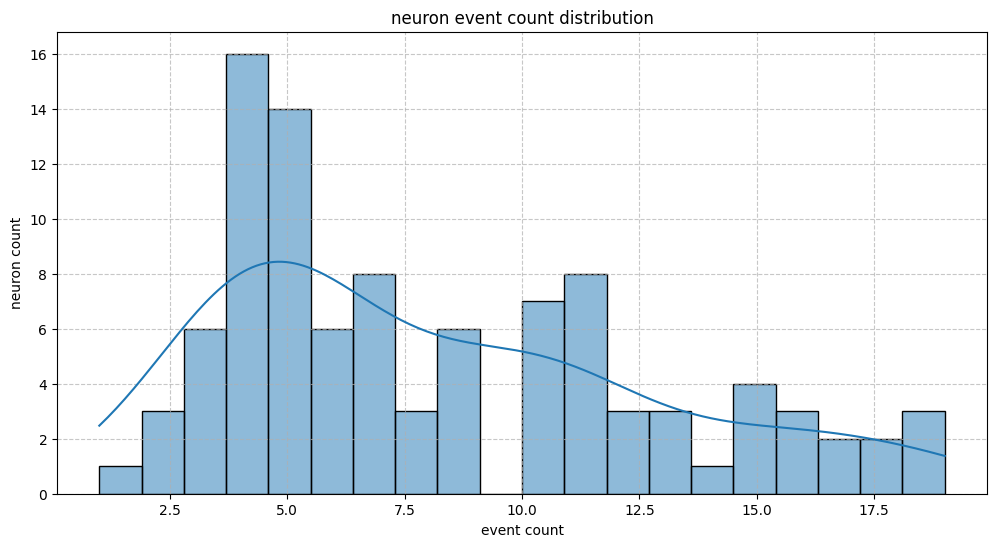

In [4]:
# 1. 统计不同 neuron_id 的事件数量分布
neuron_event_counts = events_df.groupby('neuron_id').size().reset_index(name='event_count')

# 可视化神经元事件数量分布
plt.figure(figsize=(12, 6))
sns.histplot(neuron_event_counts['event_count'], bins=20, kde=True)
plt.title('neuron event count distribution')
plt.xlabel('event count')
plt.ylabel('neuron count')
plt.grid(True, linestyle='--', alpha=0.7)
# plt.tight_layout()
plt.savefig(path_save + r'\neuron event distribution.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\neuron event distribution.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

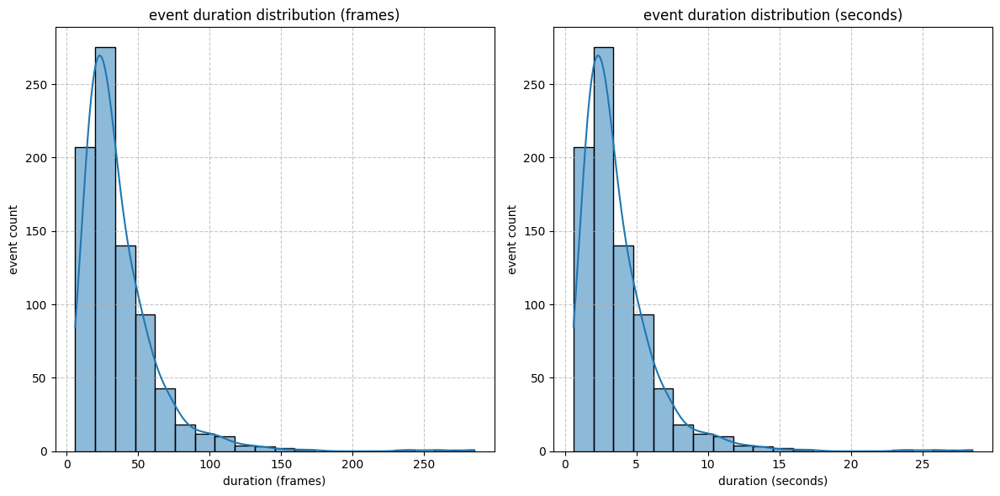

In [5]:
# 2. 统计事件持续时间的分布
# 可以按帧数或秒数统计
plt.figure(figsize=(12, 6))

# 持续时间（帧数）分布
plt.subplot(1, 2, 1)
sns.histplot(events_df['duration_frames'], bins=20, kde=True)
plt.title('event duration distribution (frames)')
plt.xlabel('duration (frames)')
plt.ylabel('event count')
plt.grid(True, linestyle='--', alpha=0.7)

# 持续时间（秒）分布
plt.subplot(1, 2, 2)
sns.histplot(events_df['duration_seconds'], bins=20, kde=True)
plt.title('event duration distribution (seconds)')
plt.xlabel('duration (seconds)')
plt.ylabel('event count')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

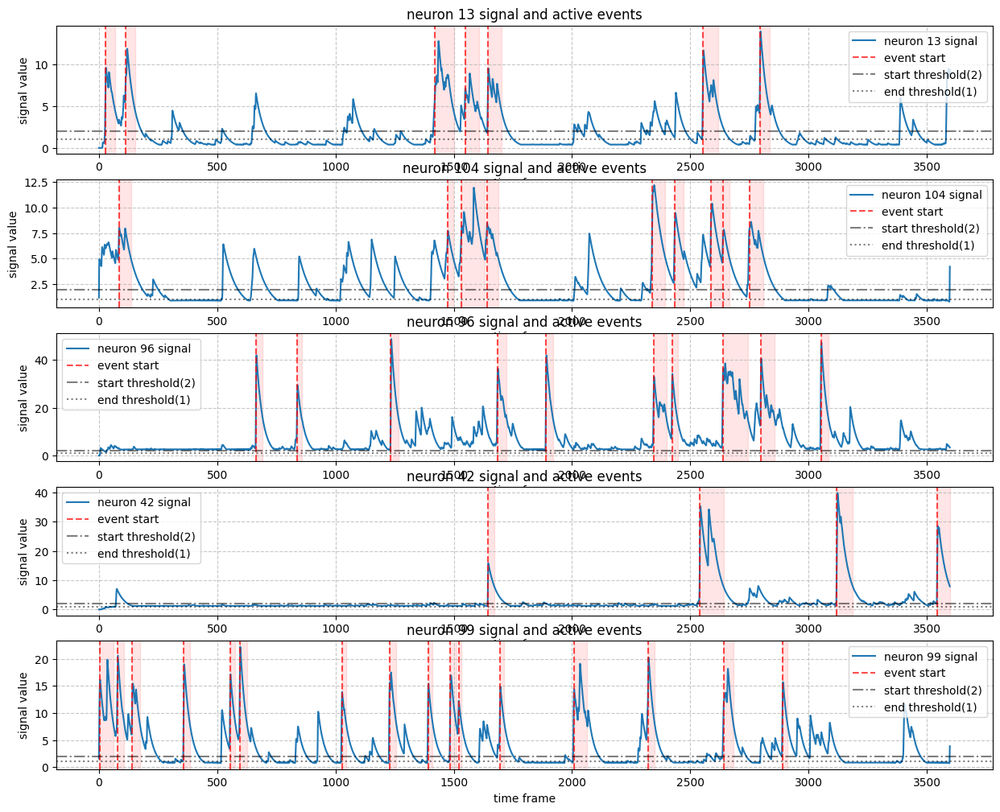

In [6]:
# 3. 随机选择五根神经元并绘制信号及事件起始
# 确保resized_df_signal_neuron_raw的列名与events_df中的neuron_id匹配
valid_neuron_ids = list(set(events_df['neuron_id'].unique()) & set(resized_df_signal_neuron_raw.columns))

# 随机选择5个神经元ID
if len(valid_neuron_ids) >= 5:
    selected_neuron_ids = random.sample(valid_neuron_ids, 5)
else:
    selected_neuron_ids = valid_neuron_ids  # 如果可用神经元少于5个，就使用所有可用的

# 绘制选中神经元的信号和事件起始
plt.figure(figsize=(15, 12))

for i, neuron_id in enumerate(selected_neuron_ids, 1):
    # 获取该神经元的信号数据
    neuron_signal = resized_df_signal_neuron_raw[neuron_id].values
    # 获取该神经元的所有事件
    neuron_events = events_df[events_df['neuron_id'] == neuron_id]
    
    # 创建子图
    plt.subplot(len(selected_neuron_ids), 1, i)
    # 绘制信号曲线
    plt.plot(neuron_signal, label=f'neuron {neuron_id} signal')
    # 标记事件起始位置
    for _, event in neuron_events.iterrows():
        # 绘制起始点垂直线
        plt.axvline(x=event['start_frame'], color='r', linestyle='--', alpha=0.7, label='event start' if _ == neuron_events.index[0] else "")
        # 可以选择是否标记结束点
        # plt.axvline(x=event['end_frame'], color='g', linestyle='--', alpha=0.7, label='事件结束' if _ == neuron_events.index[0] else "")
        # 标记事件持续区间
        plt.axvspan(event['start_frame'], event['end_frame'], color='r', alpha=0.1)
    
    # 添加阈值线
    plt.axhline(y=2, color='k', linestyle='-.', alpha=0.5, label='start threshold(2)')
    plt.axhline(y=1, color='k', linestyle=':', alpha=0.5, label='end threshold(1)')
    
    # 设置图表属性
    plt.title(f'neuron {neuron_id} signal and active events')
    plt.xlabel('time frame')
    plt.ylabel('signal value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
plt.savefig(path_save + r'\neuron signal and active.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\neuron signal and active.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

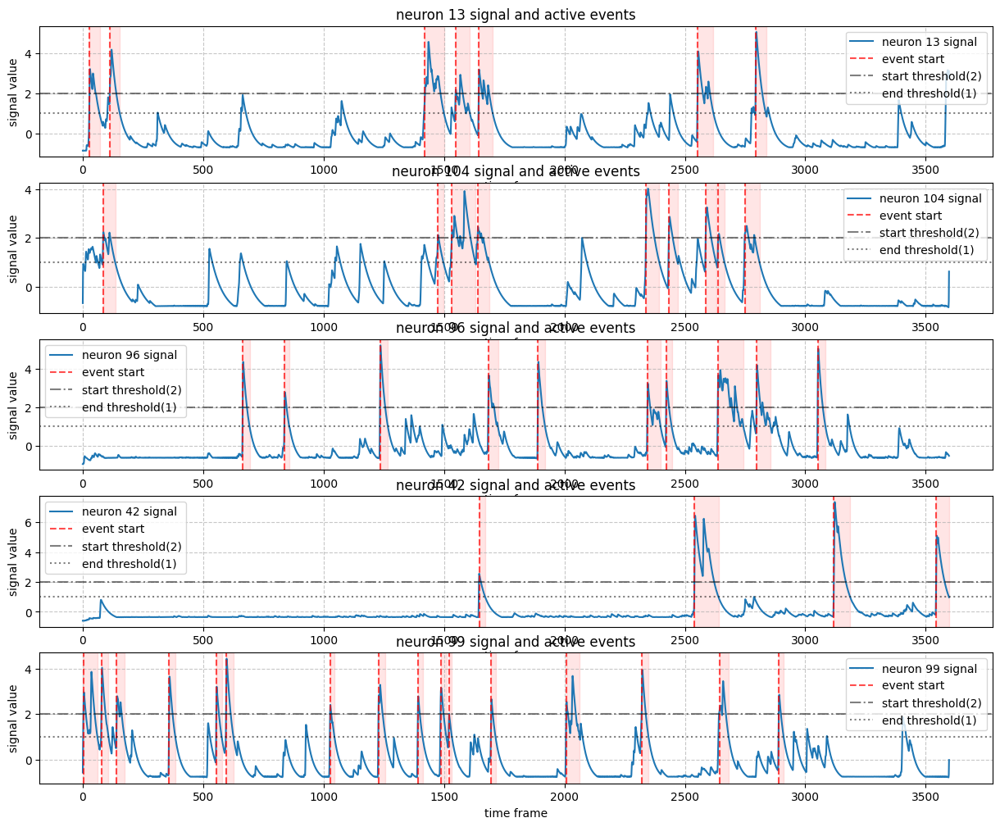

In [7]:
# 3. 随机选择五根神经元并绘制信号及事件起始
# # 确保resized_df_signal_neuron_raw的列名与events_df中的neuron_id匹配
# valid_neuron_ids = list(set(events_df['neuron_id'].unique()) & set(resized_df_signal_neuron_raw.columns))

# # 随机选择5个神经元ID
# if len(valid_neuron_ids) >= 5:
#     selected_neuron_ids = random.sample(valid_neuron_ids, 5)
# else:
#     selected_neuron_ids = valid_neuron_ids  # 如果可用神经元少于5个，就使用所有可用的

# 绘制选中神经元的信号和事件起始
plt.figure(figsize=(15, 12))

for i, neuron_id in enumerate(selected_neuron_ids, 1):
    # 获取该神经元的信号数据
    neuron_signal = resized_df_signal_neuron[neuron_id].values
    # 获取该神经元的所有事件
    neuron_events = events_df[events_df['neuron_id'] == neuron_id]
    
    # 创建子图
    plt.subplot(len(selected_neuron_ids), 1, i)
    # 绘制信号曲线
    plt.plot(neuron_signal, label=f'neuron {neuron_id} signal')
    # 标记事件起始位置
    for _, event in neuron_events.iterrows():
        # 绘制起始点垂直线
        plt.axvline(x=event['start_frame'], color='r', linestyle='--', alpha=0.7, label='event start' if _ == neuron_events.index[0] else "")
        # 可以选择是否标记结束点
        # plt.axvline(x=event['end_frame'], color='g', linestyle='--', alpha=0.7, label='事件结束' if _ == neuron_events.index[0] else "")
        # 标记事件持续区间
        plt.axvspan(event['start_frame'], event['end_frame'], color='r', alpha=0.1)
    
    # 添加阈值线
    plt.axhline(y=2, color='k', linestyle='-.', alpha=0.5, label='start threshold(2)')
    plt.axhline(y=1, color='k', linestyle=':', alpha=0.5, label='end threshold(1)')
    
    # 设置图表属性
    plt.title(f'neuron {neuron_id} signal and active events')
    plt.xlabel('time frame')
    plt.ylabel('signal value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
plt.savefig(path_save + r'\normed neuron signal and active.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\normed neuron signal and active.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

In [8]:
# 4. 输出一些统计信息
print("神经元事件统计信息：")
print(f"总神经元数量: {len(neuron_event_counts)}")
print(f"总事件数量: {len(events_df)}")
print(f"平均每个神经元的事件数量: {neuron_event_counts['event_count'].mean():.2f} ± {neuron_event_counts['event_count'].std():.2f}")
print(f"事件持续时间统计（秒）:")
print(f"  平均值: {events_df['duration_seconds'].mean():.2f} ± {events_df['duration_seconds'].std():.2f}")
print(f"  中位数: {events_df['duration_seconds'].median():.2f}")
print(f"  最小值: {events_df['duration_seconds'].min():.2f}")
print(f"  最大值: {events_df['duration_seconds'].max():.2f}")

# 如果需要保存结果
# events_df.to_csv('neuron_activity_events.csv', index=False)
# neuron_event_counts.to_csv('neuron_event_counts.csv', index=False)

神经元事件统计信息：
总神经元数量: 99
总事件数量: 811
平均每个神经元的事件数量: 8.19 ± 4.62
事件持续时间统计（秒）:
  平均值: 3.66 ± 2.71
  中位数: 2.90
  最小值: 0.60
  最大值: 28.50


In [9]:
fps = 10
window_size_frames = 3 * fps  # 3秒窗口对应的帧数

def calculate_coverage_for_neuron(neuron_id, events_df, total_frames, window_size_frames, fps):
    """
    计算单个神经元在每个窗口内的活动覆盖时间
    
    参数:
    neuron_id: 神经元ID
    events_df: 有效活动事件DataFrame
    total_frames: 总帧数
    window_size_frames: 窗口大小（帧数）
    fps: 帧率
    
    返回:
    包含窗口索引、神经元ID、活动覆盖时间和覆盖类型的DataFrame
    """
    # 筛选当前神经元的事件
    neuron_events = events_df[events_df['neuron_id'] == neuron_id].copy()
    
    # 计算窗口数量
    num_windows = int(np.ceil(total_frames / window_size_frames))
    
    results = []
    
    for window_idx in range(num_windows):
        # 计算窗口的起始和结束帧
        window_start = window_idx * window_size_frames
        window_end = min((window_idx + 1) * window_size_frames, total_frames)
        window_duration_seconds = (window_end - window_start) / fps
        
        # 初始化活动覆盖时间为0
        active_time = 0
        
        # 检查每个事件是否与当前窗口相交
        for _, event in neuron_events.iterrows():
            event_start = event['start_frame']
            event_end = event['end_frame']
            
            # 计算事件与窗口的交集
            overlap_start = max(window_start, event_start)
            overlap_end = min(window_end, event_end)
            
            # 如果有交集，计算交集的时间长度
            if overlap_start < overlap_end:
                overlap_duration = (overlap_end - overlap_start) / fps
                active_time += overlap_duration
        
        # 计算活动覆盖时间比例
        if window_duration_seconds > 0:
            coverage_ratio = active_time / window_duration_seconds
        else:
            coverage_ratio = 0

        # 分类覆盖类型
        if coverage_ratio < 0.1:
            coverage_type = '无覆盖'
        elif coverage_ratio < 0.9:
            coverage_type = '部分覆盖'
        else:
            coverage_type = '完全覆盖'
        
        results.append({
            'window_idx': window_idx,
            'neuron_id': neuron_id,
            'window_start_frame': window_start,
            'window_end_frame': window_end,
            'window_duration_seconds': window_duration_seconds,
            'active_time_seconds': active_time,
            'coverage_ratio': coverage_ratio,
            'coverage_type': coverage_type
        })
    
    return pd.DataFrame(results)

# 为所有神经元计算活动覆盖时间
def calculate_coverage_all_neurons(resized_df_signal_neuron, events_df, fps=10):
    """
    为所有神经元计算活动覆盖时间
    """
    total_frames = resized_df_signal_neuron.shape[0]
    neuron_ids = resized_df_signal_neuron.columns.tolist()
    
    all_results = []
    
    for neuron_id in neuron_ids:
        neuron_results = calculate_coverage_for_neuron(
            neuron_id=neuron_id,
            events_df=events_df,
            total_frames=total_frames,
            window_size_frames=window_size_frames,
            fps=fps
        )
        all_results.append(neuron_results)
    
    # 合并所有神经元的结果
    coverage_df = pd.concat(all_results, ignore_index=True)
    return coverage_df

# 执行计算
coverage_df = calculate_coverage_all_neurons(resized_df_signal_neuron, events_df, fps=fps)

# 显示结果统计
print("各覆盖类型统计：")
coverage_type_counts = coverage_df['coverage_type'].value_counts()
for coverage_type, count in coverage_type_counts.items():
    print(f"  {coverage_type}: {count} 个窗口 ({count/len(coverage_df)*100:.2f}%)")

print("\n每个神经元的平均覆盖比例：")
avg_coverage_by_neuron = coverage_df.groupby('neuron_id')['coverage_ratio'].mean().sort_values(ascending=False)
print(f"  最大值: {avg_coverage_by_neuron.max():.3f}")
print(f"  最小值: {avg_coverage_by_neuron.min():.3f}")
print(f"  平均值: {avg_coverage_by_neuron.mean():.3f} ± {avg_coverage_by_neuron.std():.3f}")

# 可选：保存结果到CSV文件
# coverage_df.to_csv('neuron_activity_coverage.csv', index=False)

各覆盖类型统计：
  无覆盖: 10312 个窗口 (86.80%)
  部分覆盖: 1125 个窗口 (9.47%)
  完全覆盖: 443 个窗口 (3.73%)

每个神经元的平均覆盖比例：
  最大值: 0.153
  最小值: 0.010
  平均值: 0.083 ± 0.035


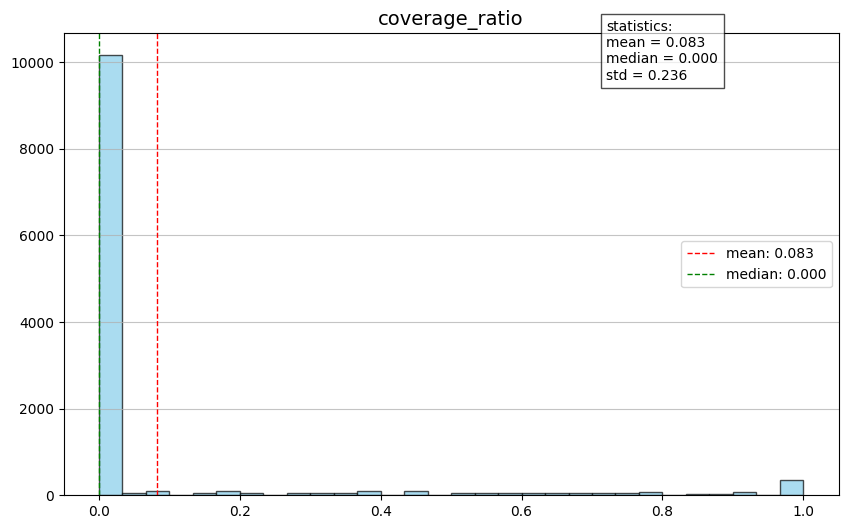

In [10]:
# 生成直方图
plt.figure(figsize=(10, 6))
plt.hist(coverage_df['coverage_ratio'], bins=30, alpha=0.7, color='skyblue', edgecolor='black')

# 添加标题和坐标轴标签
plt.title('coverage_ratio', fontsize=14)
# plt.xlabel('c', fontsize=12)
# plt.ylabel('频数', fontsize=12)

# 添加网格线
plt.grid(axis='y', alpha=0.75)

# 计算并显示统计信息
mean_ratio = coverage_df['coverage_ratio'].mean()
median_ratio = coverage_df['coverage_ratio'].median()
std_ratio = coverage_df['coverage_ratio'].std()

# 在图表上添加统计信息文本
stats_text = f'statistics:\nmean = {mean_ratio:.3f}\nmedian = {median_ratio:.3f}\nstd = {std_ratio:.3f}'
plt.text(0.7, 0.9, stats_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.7), fontsize=10)

# 添加垂直参考线表示均值
plt.axvline(mean_ratio, color='red', linestyle='dashed', linewidth=1, label=f'mean: {mean_ratio:.3f}')
plt.axvline(median_ratio, color='green', linestyle='dashed', linewidth=1, label=f'median: {median_ratio:.3f}')

# 添加图例
plt.legend()

# 调整布局
# plt.tight_layout()
plt.savefig(path_save + r'\coverage_ratio.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\coverage_ratio.png', format='png', dpi=300, bbox_inches='tight')

# 显示图表
plt.show()

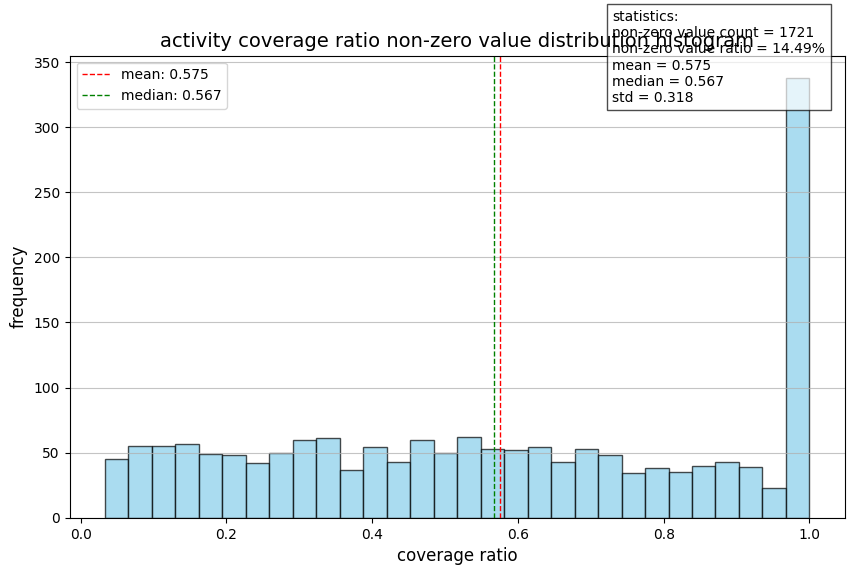

非零覆盖比例的详细统计：
- 最小值: 0.033333
- 10分位数: 0.133
- 50分位数: 0.567
- 75分位数: 0.900
- 80分位数: 0.967
- 最大值: 1.000


In [11]:
import matplotlib.pyplot as plt
import numpy as np

# # 设置中文字体，确保中文显示正常
# plt.rcParams["font.family"] = ["SimHei", "WenQuanYi Micro Hei", "Heiti TC"]
# plt.rcParams['axes.unicode_minus'] = False  # 解决负号显示问题

# 筛选非零值
non_zero_coverage = coverage_df[coverage_df['coverage_ratio'] > 0]['coverage_ratio']

# 计算非零值的统计信息
non_zero_count = len(non_zero_coverage)
non_zero_percentage = (non_zero_count / len(coverage_df)) * 100
mean_non_zero = non_zero_coverage.mean()
median_non_zero = non_zero_coverage.median()
std_non_zero = non_zero_coverage.std()

# 生成直方图
plt.figure(figsize=(10, 6))
plt.hist(non_zero_coverage, bins=30, alpha=0.7, color='skyblue', edgecolor='black')

# 添加标题和坐标轴标签
plt.title('activity coverage ratio non-zero value distribution histogram', fontsize=14)
plt.xlabel('coverage ratio', fontsize=12)
plt.ylabel('frequency', fontsize=12)

# 添加网格线
plt.grid(axis='y', alpha=0.75)

# 在图表上添加统计信息文本
stats_text = f'statistics:\nnon-zero value count = {non_zero_count}\nnon-zero value ratio = {non_zero_percentage:.2f}%\nmean = {mean_non_zero:.3f}\nmedian = {median_non_zero:.3f}\nstd = {std_non_zero:.3f}'
plt.text(0.7, 0.9, stats_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.7), fontsize=10)

# 添加垂直参考线表示均值和中位数
plt.axvline(mean_non_zero, color='red', linestyle='dashed', linewidth=1, label=f'mean: {mean_non_zero:.3f}')
plt.axvline(median_non_zero, color='green', linestyle='dashed', linewidth=1, label=f'median: {median_non_zero:.3f}')

# 添加图例
plt.legend()

# 调整布局
# plt.tight_layout()
plt.savefig(path_save + r'\coverage_ratio non_zero value.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\coverage_ratio non_zero value.png', format='png', dpi=300, bbox_inches='tight')

# 显示图表
plt.show()

# 可选：显示更多详细统计信息
print(f"非零覆盖比例的详细统计：")
print(f"- 最小值: {non_zero_coverage.min():.6f}")
print(f"- 10分位数: {non_zero_coverage.quantile(0.1):.3f}")
print(f"- 50分位数: {non_zero_coverage.quantile(0.5):.3f}")
print(f"- 75分位数: {non_zero_coverage.quantile(0.75):.3f}")
print(f"- 80分位数: {non_zero_coverage.quantile(0.8):.3f}")
print(f"- 最大值: {non_zero_coverage.max():.3f}")

In [12]:
non_zero_coverage_list = list(coverage_df[coverage_df['coverage_ratio'] > 0].index)
coverage_df_ = coverage_df.copy()

# 获取所有索引
all_indices = coverage_df_.index.tolist()
# 计算需要设置为'None'的索引（即不在non_zero_coverage_list中的索引）
indices_to_set_none = [idx for idx in all_indices if idx not in non_zero_coverage_list]
# 将这些索引对应的行的coverage_type列设置为'None'
coverage_df_.loc[indices_to_set_none, 'coverage_type'] = 'None'
coverage_df_ = coverage_df_.reset_index()

C:\Users\Admin\AppData\Local\Temp\ipykernel_21116\1429510379.py:75: UserWarning: Glyph 37096 (\N{CJK UNIFIED IDEOGRAPH-90E8}) missing from font(s) DejaVu Sans.
  plt.savefig(path_save + r'\single neuron coverage.pdf', format='pdf', dpi=300, bbox_inches='tight')
C:\Users\Admin\AppData\Local\Temp\ipykernel_21116\1429510379.py:75: UserWarning: Glyph 20998 (\N{CJK UNIFIED IDEOGRAPH-5206}) missing from font(s) DejaVu Sans.
  plt.savefig(path_save + r'\single neuron coverage.pdf', format='pdf', dpi=300, bbox_inches='tight')
C:\Users\Admin\AppData\Local\Temp\ipykernel_21116\1429510379.py:75: UserWarning: Glyph 35206 (\N{CJK UNIFIED IDEOGRAPH-8986}) missing from font(s) DejaVu Sans.
  plt.savefig(path_save + r'\single neuron coverage.pdf', format='pdf', dpi=300, bbox_inches='tight')
C:\Users\Admin\AppData\Local\Temp\ipykernel_21116\1429510379.py:75: UserWarning: Glyph 30422 (\N{CJK UNIFIED IDEOGRAPH-76D6}) missing from font(s) DejaVu Sans.
  plt.savefig(path_save + r'\single neuron coverage.pd

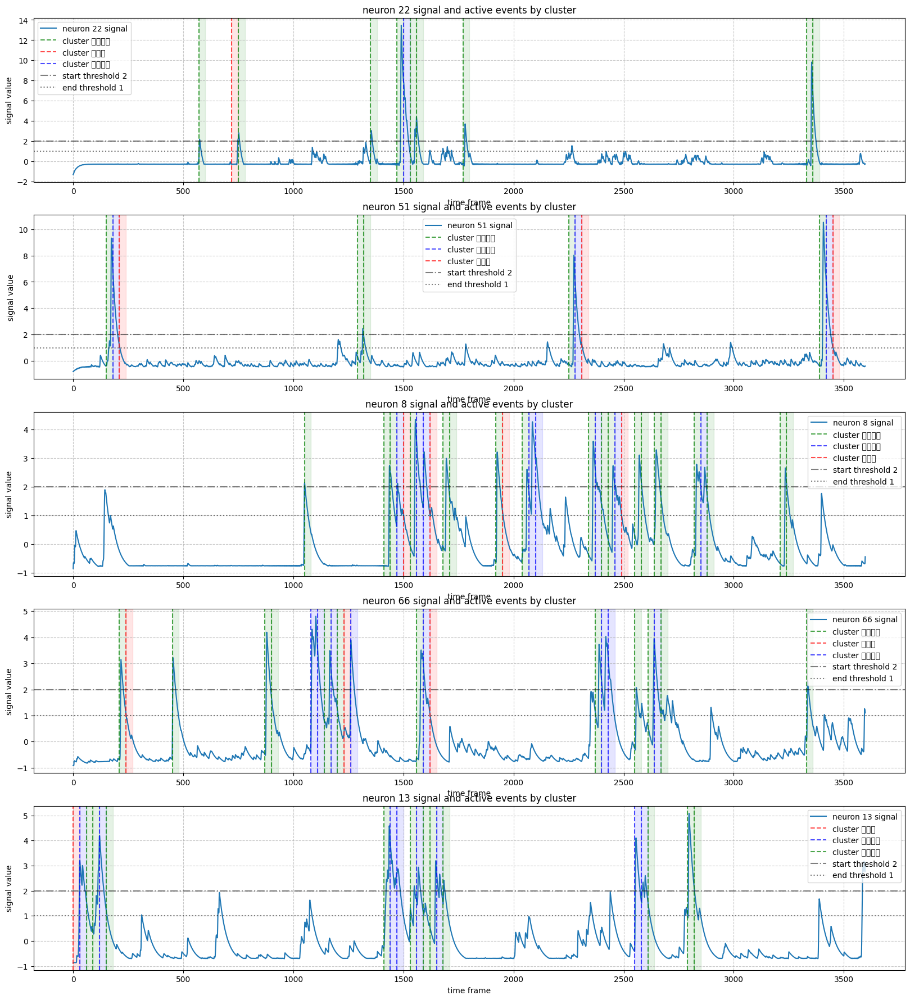

In [13]:
# 随机选择五根神经元并绘制信号及事件起始 
# 确保resized_df_signal_neuron_raw的列名与events_df中的neuron_id匹配 
valid_neuron_ids = list(set(coverage_df_['neuron_id'].unique())) 

# 随机选择5个神经元ID 
if len(valid_neuron_ids) >= 5:
    selected_neuron_ids = random.sample(valid_neuron_ids, 5)
else:
    selected_neuron_ids = valid_neuron_ids   # 如果可用神经元少于5个，就使用所有可用的

# 创建颜色映射字典，为不同的cluster_label分配不同颜色
# 可以根据需要调整颜色列表或添加更多颜色
cluster_colors = {
    '无覆盖': 'r',  # 类别0使用红色
    '部分覆盖': 'g',  # 类别1使用绿色
    '完全覆盖': 'b',  # 类别2使用蓝色
    'None': 'k'
}

# 创建事件ID到cluster_label的映射字典
cluster_map = dict(zip(coverage_df_['index'], coverage_df_['coverage_type']))

# 绘制选中神经元的信号和事件起始 
plt.figure(figsize=(20, 22)) 

for i, neuron_id in enumerate(selected_neuron_ids, 1):
    # 获取该神经元的信号数据
    neuron_signal = resized_df_signal_neuron[neuron_id].values
    # 获取该神经元的所有事件
    neuron_events = coverage_df_[coverage_df_['neuron_id'] == neuron_id].copy()
    
    # 为每个事件添加cluster_label
    neuron_events['coverage_type'] = neuron_events['index'].map(cluster_map)
    
    # 创建子图
    plt.subplot(len(selected_neuron_ids), 1, i)
    # 绘制信号曲线
    plt.plot(neuron_signal, label=f'neuron {neuron_id} signal')
    
    # 跟踪已添加的图例标签，避免重复
    added_labels = set()
    
    # 标记事件起始位置和区间，根据cluster_label使用不同颜色
    for _, event in neuron_events.iterrows():
        cluster_label = event['coverage_type']

        # 跳过none类型的cluster_label，不标记颜色
        if cluster_label == 'None':
            continue

        # 获取该聚类标签对应的颜色
        color = cluster_colors.get(cluster_label, 'k')  # 默认为黑色
        
        # 绘制起始点垂直线
        label = f'cluster {cluster_label}' if f'cluster {cluster_label}' not in added_labels else ""
        plt.axvline(x=event['window_start_frame'], color=color, linestyle='--', alpha=0.7, label=label)
        if label:
            added_labels.add(label)
        
        # 标记事件持续区间
        plt.axvspan(event['window_start_frame'], event['window_end_frame'], color=color, alpha=0.1)
    
    # 添加阈值线
    plt.axhline(y=2, color='k', linestyle='-.', alpha=0.5, label='start threshold 2')
    plt.axhline(y=1, color='k', linestyle=':', alpha=0.5, label='end threshold 1')
    
    # 设置图表属性
    plt.title(f'neuron {neuron_id} signal and active events by cluster')
    plt.xlabel('time frame')
    plt.ylabel('signal value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
plt.savefig(path_save + r'\single neuron coverage.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\single neuron coverage.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

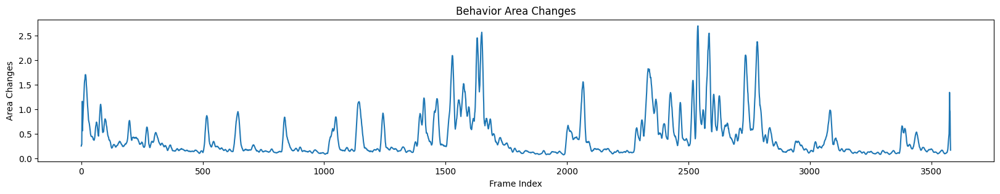

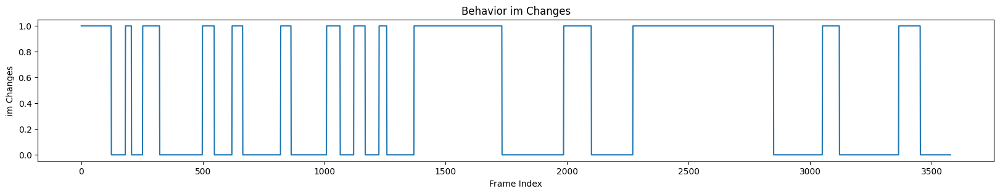

In [14]:
df_behavior = pd.read_csv(path_behavior+'\Area_Change.csv')
df_im = pd.read_csv(path_behavior+'\im.csv')
df_behavior = df_behavior.T.reset_index(drop=True)
df_im = df_im.T.reset_index(drop=True)

S_to_I = []
for i in range(len(df_im)-1):
    if (df_im[0][i+1]-df_im[0][i]) == 1:
        S_to_I.append(i)
    else:
        continue

S_to_I_update = []
df_im_update_temp = df_im.copy()

for i in S_to_I:
    if i < 20 or i > (len(df_im_update_temp)-20):
        continue
    else:
        temp_backward =  df_im_update_temp[(i-20):i]  
        temp_b_values = temp_backward.sum().values

        temp_forward =  df_im_update_temp[i:i+20]   
        temp_f_values = temp_forward.sum().values

        if temp_b_values[0]==0:
            if temp_f_values[0]==19:
                S_to_I_update.append(i)
            else:
                for num in range(i+1,i+20):
                    if df_im_update_temp.loc[num,0]==1:
                        df_im_update_temp.loc[num,0]=0
                    else:
                        break      
        else:
            continue

I_to_S = []
for i in range(len(df_im)-1):
    if (df_im[0][i+1]-df_im[0][i]) == -1:
        I_to_S.append(i)
    else:
        continue

I_to_S_update = []
df_im_update_temp = df_im.copy()

for i in I_to_S:
    if i < 20 or i > (len(df_im_update_temp)-20):
        continue
    else:
        temp_backward =  df_im_update_temp[(i-20):i]  
        temp_b_values = temp_backward.sum().values

        temp_forward =  df_im_update_temp[i:i+20]   
        temp_f_values = temp_forward.sum().values

        if temp_b_values[0]==20: 
            if temp_f_values[0]==1:
                I_to_S_update.append(i)
            else:
                for num in range(i+1,i+20):           
                    if df_im_update_temp.loc[num,0]==0:
                        df_im_update_temp.loc[num,0]=1
                    else:
                        break
        else:
            continue

# 将S to I和I to S的时间节点按顺序结合起来
temp_im_update = {}
temp_state = []
temp_position = []
pointer_S = 0
pointer_I = 0
for i in range(len(S_to_I_update)+len(I_to_S_update)):
    if S_to_I_update[pointer_S] < I_to_S_update[pointer_I]:
        temp_state.append('S')
        temp_position.append(S_to_I_update[pointer_S])
        pointer_S = pointer_S + 1
        if pointer_S >= len(S_to_I_update):
            for j in range(pointer_I,len(I_to_S_update)):
                temp_state.append('I')
                temp_position.append(I_to_S_update[j])
            break

    elif S_to_I_update[pointer_S] > I_to_S_update[pointer_I]:
        temp_state.append('I')
        temp_position.append(I_to_S_update[pointer_I])
        pointer_I = pointer_I + 1
        if pointer_I >= len(I_to_S_update):
            for j in range(pointer_S,len(S_to_I_update)):
                temp_state.append('S')
                temp_position.append(S_to_I_update[j])
            break
    else:
        print("S and I states error")
        break

temp_im_update['state'] = temp_state
temp_im_update['position'] = temp_position
behaviour_im_update = pd.DataFrame(temp_im_update)

# 将重复的行为状态进行合并，如果出现连续的同种状态说明行为状态切换失败，仅保留最后一次切换
behaviour_im_update_with_head = {}
behaviour_im_update_with_head=behaviour_im_update.copy()

for i in range(len(behaviour_im_update_with_head)-1):
    if behaviour_im_update_with_head.loc[i,'state']==behaviour_im_update_with_head.loc[i+1,'state']:
        behaviour_im_update_with_head.loc[i,'position']=0
for i in range(len(behaviour_im_update_with_head)):
    if behaviour_im_update_with_head.loc[i,'position']==0:
        behaviour_im_update_with_head=behaviour_im_update_with_head.drop(i)
behaviour_im_update_with_head = behaviour_im_update_with_head.reset_index(drop=True)

# 按照更新的后的行为时间节点获得新的行为状态序列
behaviour_im_with_head = np.zeros((len(df_im),1))
behaviour_im_with_head = pd.DataFrame(behaviour_im_with_head)
before_tag = 0
for i in range(len(behaviour_im_update_with_head)):
    state_tag = behaviour_im_update_with_head['state'][i]
    position_tag = behaviour_im_update_with_head['position'][i]

    if state_tag == 'S':
        behaviour_im_with_head.loc[before_tag:position_tag,0] = 1
    else:
        behaviour_im_with_head.loc[before_tag:position_tag,0] = 0

    before_tag = position_tag

    if i == len(behaviour_im_update_with_head)-1:
        if state_tag == 'S':
            behaviour_im_with_head.loc[before_tag:,0] = 0
        else:
            behaviour_im_with_head.loc[before_tag:,0] = 1

plt.figure(figsize=(20, 3))
plt.plot(np.arange(len(df_behavior)), df_behavior)
plt.title('Behavior Area Changes')
plt.xlabel('Frame Index')
plt.ylabel('Area Changes')
plt.savefig(path_save + r'\Behavior Area Changes.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\Behavior Area Changes.png', format='png', dpi=300, bbox_inches='tight')

plt.figure(figsize=(20, 3))
plt.plot(behaviour_im_with_head)
plt.title('Behavior im Changes')
plt.xlabel('Frame Index')
plt.ylabel('im Changes')
plt.savefig(path_save + r'\Behavior im Changes.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\Behavior im Changes.png', format='png', dpi=300, bbox_inches='tight')

In [15]:
# 计算每个事件的统计信息（均值、最大值、最小值）
def calculate_event_statistics(events_df, resized_df_signal_neuron):
    """
    计算每个有效事件对应的神经元信号统计信息
    
    参数:
    events_df: 有效活动事件DataFrame
    resized_df_signal_neuron: 神经元信号数据
    
    返回:
    包含事件统计信息的DataFrame
    """
    # 创建用于存储结果的列表
    event_stats = []
    
    # 遍历每个事件
    for idx, event in events_df.iterrows():
        neuron_id = event['neuron_id']
        start_frame = event['start_frame']
        end_frame = event['end_frame']
        
        # 获取该事件对应的神经元信号数据
        # 注意：这里假设neuron_id在resized_df_signal_neuron的列名中
        event_signal = resized_df_signal_neuron.loc[start_frame:end_frame-1, neuron_id]
        
        # 计算统计信息
        event_mean = event_signal.mean()
        event_max = event_signal.max()
        event_min = event_signal.min()
        event_std = event_signal.std()
        event_duration = end_frame - start_frame
        
        # 存储结果
        event_stats.append({
            'event_id': idx,
            'neuron_id': neuron_id,
            'start_frame': start_frame,
            'end_frame': end_frame,
            'duration_frames': event_duration,
            'mean_value': event_mean,
            'max_value': event_max,
            'min_value': event_min,
            'std_value': event_std
        })
    
    # 转换为DataFrame
    stats_df = pd.DataFrame(event_stats)
    return stats_df

# 计算每个神经元的事件统计信息的汇总统计

def calculate_neuron_summary_statistics(event_stats_df):
    """
    计算每个神经元内所有事件的统计信息的汇总统计
    
    参数:
    event_stats_df: 包含每个事件统计信息的DataFrame
    
    返回:
    包含每个神经元汇总统计信息的DataFrame
    """
    # 按神经元分组计算汇总统计
    neuron_summary = event_stats_df.groupby('neuron_id').agg({
        'mean_value': ['mean', 'std', 'count'],  # 每个神经元所有事件均值的均值、标准差和事件数量
        'max_value': ['mean', 'std'],            # 每个神经元所有事件最大值的均值和标准差
        'min_value': ['mean', 'std'],            # 每个神经元所有事件最小值的均值和标准差
        'duration_frames': ['mean', 'std']       # 每个神经元所有事件持续时间的均值和标准差
    }).round(4)
    
    # 重命名列名使其更直观
    neuron_summary.columns = ['events_mean_avg', 'events_mean_std', 'events_count', 
                             'events_max_avg', 'events_max_std', 
                             'events_min_avg', 'events_min_std',
                             'events_duration_avg', 'events_duration_std']
    
    # 重置索引，使neuron_id成为列而不是索引
    neuron_summary = neuron_summary.reset_index()
    
    return neuron_summary

# 执行计算
# 1. 计算每个事件的统计信息
event_stats_df = calculate_event_statistics(events_df, resized_df_signal_neuron)

# 2. 计算每个神经元的汇总统计信息
neuron_summary_df = calculate_neuron_summary_statistics(event_stats_df)

# 显示前几个事件的统计信息
print("事件统计信息示例：")
print(event_stats_df.head())

# 显示前几个神经元的汇总统计信息
print("\n神经元汇总统计信息示例：")
print(neuron_summary_df.head())

# 显示整体统计信息
print("\n整体神经元活动事件统计：")
print(f"共有 {len(events_df)} 个有效活动事件")
print(f"涉及 {len(neuron_summary_df)} 个神经元")
print(f"平均每个神经元有 {event_stats_df['neuron_id'].value_counts().mean():.2f} ± {event_stats_df['neuron_id'].value_counts().std():.2f} 个事件")
print(f"事件平均持续帧数：{event_stats_df['duration_frames'].mean():.2f} ± {event_stats_df['duration_frames'].std():.2f}")
print(f"事件平均信号值：{event_stats_df['mean_value'].mean():.4f} ± {event_stats_df['mean_value'].std():.4f}")


事件统计信息示例：
   event_id  neuron_id  start_frame  end_frame  duration_frames  mean_value  \
0         0        0.0         12.0       28.0             16.0    1.580664   
1         1        0.0         33.0       74.0             41.0    1.725087   
2         2        0.0        111.0      126.0             15.0    1.510742   
3         3        0.0        212.0      247.0             35.0    2.020652   
4         4        0.0       1059.0     1075.0             16.0    1.471558   

   max_value  min_value  std_value  
0   2.132043   1.030845   0.367348  
1   2.781334   1.051719   0.478229  
2   2.089310   1.002804   0.346834  
3   2.957579   1.027008   0.545076  
4   2.036011   1.048204   0.311520  

神经元汇总统计信息示例：
   neuron_id  events_mean_avg  events_mean_std  events_count  events_max_avg  \
0        0.0           1.7689           0.2747            18          2.5708   
1        1.0           1.8545           0.2390             5          2.8523   
2        2.0           2.2918          

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

计算完成，共包含 811 个事件的统计信息
归一化完成，共包含 811 个归一化后的事件数据
k=2: 轮廓系数=0.6471, 簇内平方和=45.2468
k=3: 轮廓系数=0.5943, 簇内平方和=21.4541
k=4: 轮廓系数=0.5792, 簇内平方和=12.2389
k=5: 轮廓系数=0.5265, 簇内平方和=9.9862
k=6: 轮廓系数=0.5329, 簇内平方和=7.4336


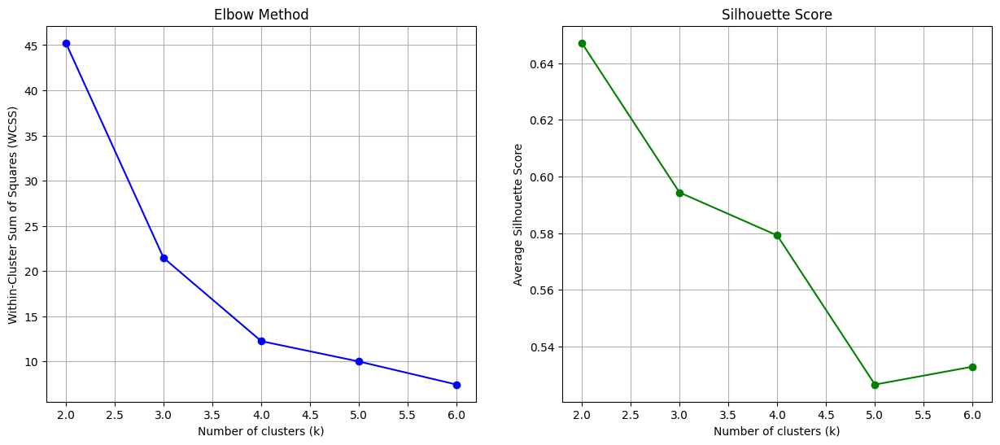

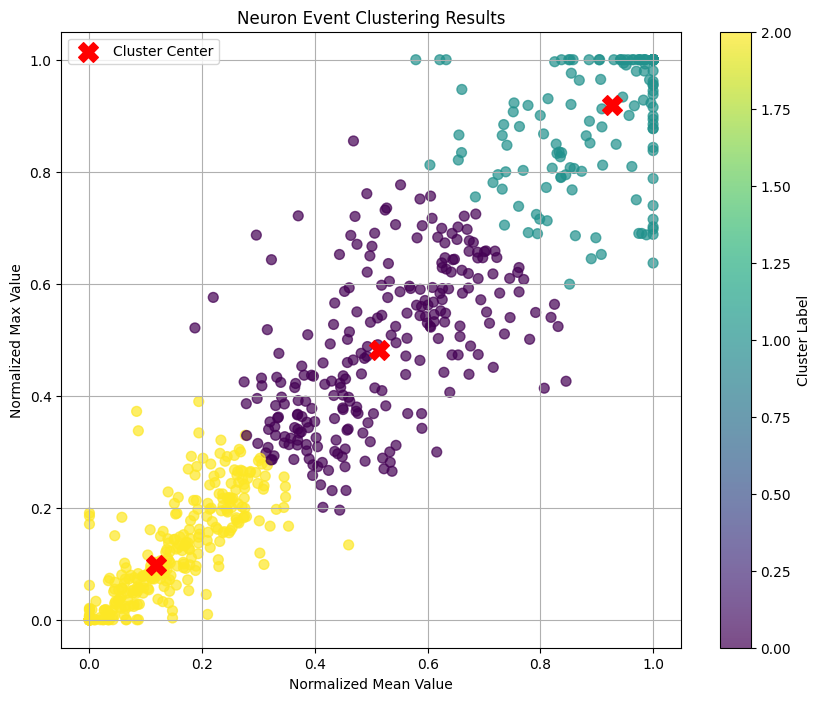

各簇事件数量统计:
  簇 0: 250 个事件 (30.83%)
  簇 1: 196 个事件 (24.17%)
  簇 2: 365 个事件 (45.01%)


In [17]:
# 第一步：计算每个神经元事件的均值和最大值

def calculate_event_statistics(events_df, resized_df_signal_neuron):
    """
    计算每个有效事件对应的神经元信号均值和最大值
    """
    event_stats = []
    
    # 遍历每个事件
    for idx, event in events_df.iterrows():
        neuron_id = event['neuron_id']
        start_frame = event['start_frame']
        end_frame = event['end_frame']
        
        # 获取该事件对应的神经元信号数据
        event_signal = resized_df_signal_neuron.loc[start_frame:end_frame-1, neuron_id]
        
        # 计算统计信息
        event_mean = event_signal.mean()
        event_max = event_signal.max()
        
        # 存储结果
        event_stats.append({
            'event_id': idx,
            'neuron_id': neuron_id,
            'start_frame': start_frame,
            'end_frame': end_frame,
            'mean_value': event_mean,
            'max_value': event_max
        })
    
    return pd.DataFrame(event_stats)

# 第二步：对每个神经元的事件统计值进行Min-Max归一化

def normalize_neuron_statistics(event_stats_df):
    """
    对每个神经元的事件统计值进行Min-Max归一化
    """
    # 创建结果DataFrame
    normalized_results = []
    
    # 按神经元分组处理
    for neuron_id, group in event_stats_df.groupby('neuron_id'):
        # 提取均值和最大值
        means = group['mean_value'].values
        maxs = group['max_value'].values
        
        # 计算每个神经元内的最小最大值用于归一化
        # 处理可能的除零情况
        mean_min, mean_max = means.min(), means.max()
        max_min, max_max = maxs.min(), maxs.max()
        
        mean_range = mean_max - mean_min if mean_max != mean_min else 1e-10
        max_range = max_max - max_min if max_max != max_min else 1e-10
        
        # Min-Max归一化
        normalized_means = (means - mean_min) / mean_range
        normalized_maxs = (maxs - max_min) / max_range
        
        # 存储归一化结果
        for i, row in enumerate(group.itertuples()):
            normalized_results.append({
                'event_id': row.event_id,
                'neuron_id': neuron_id,
                'mean_value': row.mean_value,
                'max_value': row.max_value,
                'normalized_mean': normalized_means[i],
                'normalized_max': normalized_maxs[i]
            })
    
    return pd.DataFrame(normalized_results)

# 第三步：使用K-means进行聚类并确定最优k值

def perform_kmeans_clustering(normalized_df, k_range=range(2, 7)):
    """
    使用K-means进行聚类，并用肘部法则和轮廓系数确定最优k值
    """
    # 准备特征数据
    features = normalized_df[['normalized_mean', 'normalized_max']].values
    
    # 计算不同k值的簇内平方和和轮廓系数
    wcss = []  # 簇内平方和
    silhouette_scores = []  # 轮廓系数
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        cluster_labels = kmeans.fit_predict(features)
        
        # 计算簇内平方和
        wcss.append(kmeans.inertia_)
        
        # 计算轮廓系数
        silhouette_avg = silhouette_score(features, cluster_labels)
        silhouette_scores.append(silhouette_avg)
        
        print(f'k={k}: 轮廓系数={silhouette_avg:.4f}, 簇内平方和={kmeans.inertia_:.4f}')
    
    # 绘制肘部法则和轮廓系数曲线
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # 肘部法则曲线
    ax1.plot(k_range, wcss, 'o-', color='blue')
    ax1.set_title('Elbow Method')
    ax1.set_xlabel('Number of clusters (k)')
    ax1.set_ylabel('Within-Cluster Sum of Squares (WCSS)')
    ax1.grid(True)
    
    # 轮廓系数曲线
    ax2.plot(k_range, silhouette_scores, 'o-', color='green')
    ax2.set_title('Silhouette Score')
    ax2.set_xlabel('Number of clusters (k)')
    ax2.set_ylabel('Average Silhouette Score')
    ax2.grid(True)
    
    # plt.tight_layout()
    plt.savefig(path_save + r'\intensity Elbow Method.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\intensity Elbow Method.png', format='png', dpi=300, bbox_inches='tight')

    plt.show()
    
    # # 找到轮廓系数最大的k值
    # best_k = k_range[np.argmax(silhouette_scores)]
    # print(f'根据轮廓系数，最优k值为: {best_k}')
    best_k = 3
    
    # 使用最优k值进行最终聚类
    best_kmeans = KMeans(n_clusters=best_k, random_state=42)
    final_labels = best_kmeans.fit_predict(features)
    
    # 将聚类结果添加到原始数据中
    result_df = normalized_df.copy()
    result_df['cluster_label'] = final_labels
    
    return result_df, best_kmeans, wcss, silhouette_scores

# 可视化聚类结果

def visualize_clustering_results(result_df, kmeans_model):
    """
    可视化聚类结果
    """
    # 获取簇中心
    centroids = kmeans_model.cluster_centers_
    
    # 绘制聚类散点图
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        result_df['normalized_mean'], 
        result_df['normalized_max'], 
        c=result_df['cluster_label'], 
        cmap='viridis', 
        s=50, 
        alpha=0.7
    )
    
    # 绘制簇中心
    plt.scatter(
        centroids[:, 0], 
        centroids[:, 1], 
        # centroids[:, 2],
        c='red', 
        marker='X', 
        s=200, 
        label='Cluster Center'
    )
    
    plt.title('Neuron Event Clustering Results')
    plt.xlabel('Normalized Mean Value')
    plt.ylabel('Normalized Max Value')
    plt.colorbar(scatter, label='Cluster Label')
    plt.legend()
    plt.grid(True)
    # plt.tight_layout()
    plt.savefig(path_save + r'\intensity Clustering Results.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\intensity Clustering Results.png', format='png', dpi=300, bbox_inches='tight')

    plt.show()
    
    # 统计每个簇中的事件数量
    cluster_counts = result_df['cluster_label'].value_counts().sort_index()
    print('各簇事件数量统计:')
    for cluster, count in cluster_counts.items():
        print(f'  簇 {cluster}: {count} 个事件 ({count/len(result_df)*100:.2f}%)')

# 执行完整流程
# 1. 计算事件统计信息
event_stats_df = calculate_event_statistics(events_df, resized_df_signal_neuron)
print(f"计算完成，共包含 {len(event_stats_df)} 个事件的统计信息")

# 2. 对每个神经元的统计值进行归一化
normalized_df = normalize_neuron_statistics(event_stats_df)
print(f"归一化完成，共包含 {len(normalized_df)} 个归一化后的事件数据")

# 3. 执行k-means聚类并确定最优k值
result_df, best_kmeans, wcss, silhouette_scores = perform_kmeans_clustering(normalized_df)

# 4. 可视化聚类结果
visualize_clustering_results(result_df, best_kmeans)

# 可选：保存结果到CSV文件
# result_df.to_csv('neuron_event_clustering_results.csv', index=False)

In [18]:
result_df

,event_id,neuron_id,mean_value,max_value,normalized_mean,normalized_max,cluster_label
0,0,0.0,1.580664,2.132043,0.144623,0.079051,2
1,1,0.0,1.725087,2.781334,0.336060,0.475588,0
2,2,0.0,1.510742,2.089310,0.051939,0.052953,2
3,3,0.0,2.020652,2.957579,0.727841,0.583225,0
4,4,0.0,1.471558,2.036011,0.000000,0.020402,2
...,...,...,...,...,...,...,...
806,806,107.0,1.957501,2.838338,0.268200,0.299748,2
807,807,107.0,2.007810,2.879106,0.298697,0.314757,0
808,808,107.0,1.723032,2.429055,0.126063,0.149073,2
809,809,107.0,1.918127,2.815632,0.244331,0.291389,2


In [19]:
# 调整cluster_label的结果，将最大的normalized_max值对应的cluster_label设为2
# 检查数据集基本信息
print(f"原始数据集形状: {result_df.shape}")
print(f"cluster_label唯一值: {result_df['cluster_label'].unique()}")

# 步骤1: 计算每一类的normalized_max的平均值
cluster_means = result_df.groupby('cluster_label')['normalized_max'].mean().reset_index()
cluster_means.columns = ['original_label', 'mean_normalized_max']

print("\n各类别normalized_max平均值:")
print(cluster_means)

# 步骤2: 对平均值进行排序，确定新的标签赋值
# 按mean_normalized_max升序排序
sorted_clusters = cluster_means.sort_values('mean_normalized_max')

# 创建新旧标签映射: 平均值最小的→0, 中间的→1, 最大的→2
label_mapping = {}
for new_label, row in enumerate(sorted_clusters.itertuples()):
    label_mapping[row.original_label] = new_label

print("\n标签映射关系:")
for original, new in label_mapping.items():
    print(f"原始标签 {original} → 新标签 {new}")

# 步骤3: 应用新的标签赋值
result_df['cluster_label'] = result_df['cluster_label'].map(label_mapping)

# 验证结果
new_cluster_means = result_df.groupby('cluster_label')['normalized_max'].mean().reset_index()
new_cluster_means.columns = ['new_label', 'mean_normalized_max']

print("\n重新赋值后的各类别normalized_max平均值:")
print(new_cluster_means.sort_values('new_label'))

print("\n处理完成！cluster_label已按照normalized_max平均值大小重新赋值。")
print("新的cluster_label分布:")
print(result_df['cluster_label'].value_counts().sort_index())

原始数据集形状: (811, 7)
cluster_label唯一值: [2 0 1]

各类别normalized_max平均值:
   original_label  mean_normalized_max
0               0             0.482604
1               1             0.919345
2               2             0.098955

标签映射关系:
原始标签 2 → 新标签 0
原始标签 0 → 新标签 1
原始标签 1 → 新标签 2

重新赋值后的各类别normalized_max平均值:
   new_label  mean_normalized_max
0          0             0.098955
1          1             0.482604
2          2             0.919345

处理完成！cluster_label已按照normalized_max平均值大小重新赋值。
新的cluster_label分布:
cluster_label
0    365
1    250
2    196
Name: count, dtype: int64


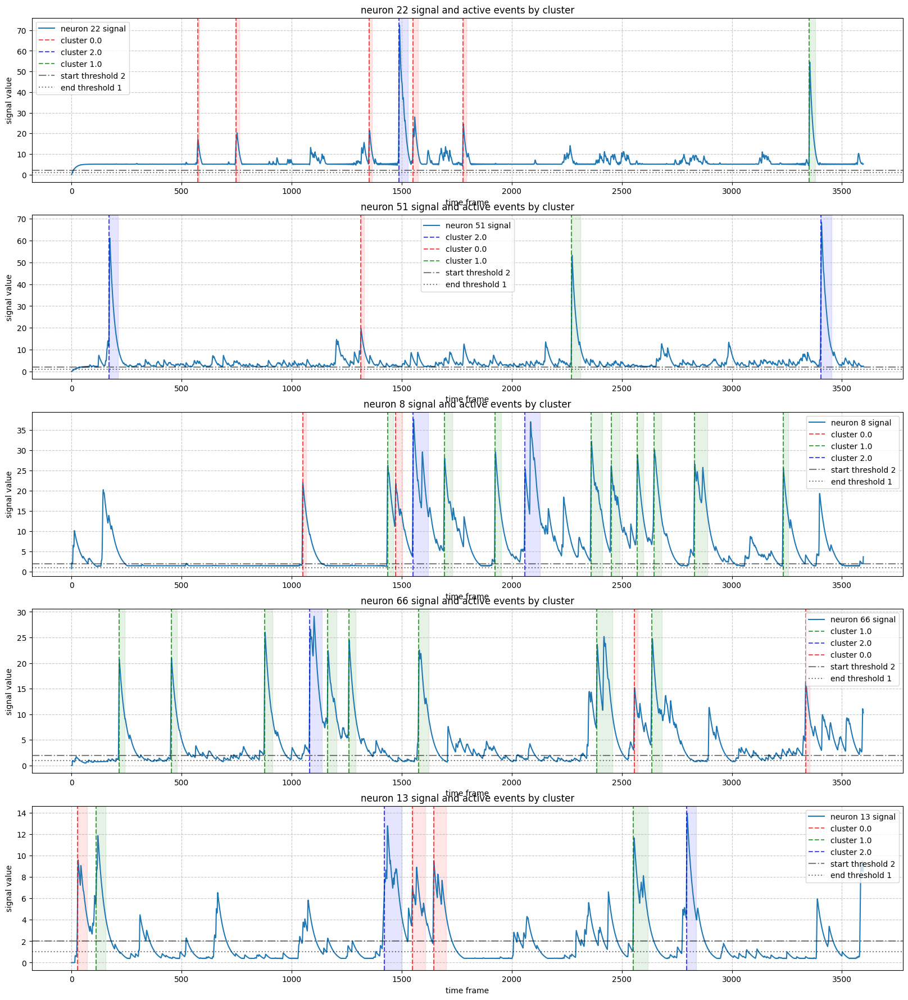

In [20]:
# 创建颜色映射字典，为不同的cluster_label分配不同颜色
# 可以根据需要调整颜色列表或添加更多颜色
cluster_colors = {
    0: 'r',  # 类别0使用红色
    1: 'g',  # 类别1使用绿色
    2: 'b',  # 类别2使用蓝色
    3: 'm',  # 类别3使用洋红色
    4: 'c',  # 类别4使用青色
    5: 'y'   # 类别5使用黄色
}

# 确保result_df和events_df正确关联
# 由于事件顺序相同，我们可以创建一个映射关系
# 先确保events_df有event_id列（如果没有的话）
if 'event_id' not in events_df.columns:
    # 为events_df添加event_id列，假设顺序与result_df相同
    events_df = events_df.copy()
    events_df['event_id'] = result_df['event_id']

# 创建事件ID到cluster_label的映射字典
cluster_map = dict(zip(result_df['event_id'], result_df['cluster_label']))

# 绘制选中神经元的信号和事件起始 
plt.figure(figsize=(20, 22)) 

for i, neuron_id in enumerate(selected_neuron_ids, 1):
    # 获取该神经元的信号数据
    neuron_signal = resized_df_signal_neuron_raw[neuron_id].values
    # 获取该神经元的所有事件
    neuron_events = events_df[events_df['neuron_id'] == neuron_id].copy()
    
    # 为每个事件添加cluster_label
    neuron_events['cluster_label'] = neuron_events['event_id'].map(cluster_map)
    
    # 创建子图
    plt.subplot(len(selected_neuron_ids), 1, i)
    # 绘制信号曲线
    plt.plot(neuron_signal, label=f'neuron {neuron_id} signal')
    
    # 跟踪已添加的图例标签，避免重复
    added_labels = set()
    
    # 标记事件起始位置和区间，根据cluster_label使用不同颜色
    for _, event in neuron_events.iterrows():
        cluster_label = event['cluster_label']
        # 获取该聚类标签对应的颜色
        color = cluster_colors.get(cluster_label, 'k')  # 默认为黑色
        
        # 绘制起始点垂直线
        label = f'cluster {cluster_label}' if f'cluster {cluster_label}' not in added_labels else ""
        plt.axvline(x=event['start_frame'], color=color, linestyle='--', alpha=0.7, label=label)
        if label:
            added_labels.add(label)
        
        # 标记事件持续区间
        plt.axvspan(event['start_frame'], event['end_frame'], color=color, alpha=0.1)
    
    # 添加阈值线
    plt.axhline(y=2, color='k', linestyle='-.', alpha=0.5, label='start threshold 2')
    plt.axhline(y=1, color='k', linestyle=':', alpha=0.5, label='end threshold 1')
    
    # 设置图表属性
    plt.title(f'neuron {neuron_id} signal and active events by cluster')
    plt.xlabel('time frame')
    plt.ylabel('signal value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
plt.savefig(path_save + r'\intensity single and active events by cluster.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\intensity single and active events by cluster.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

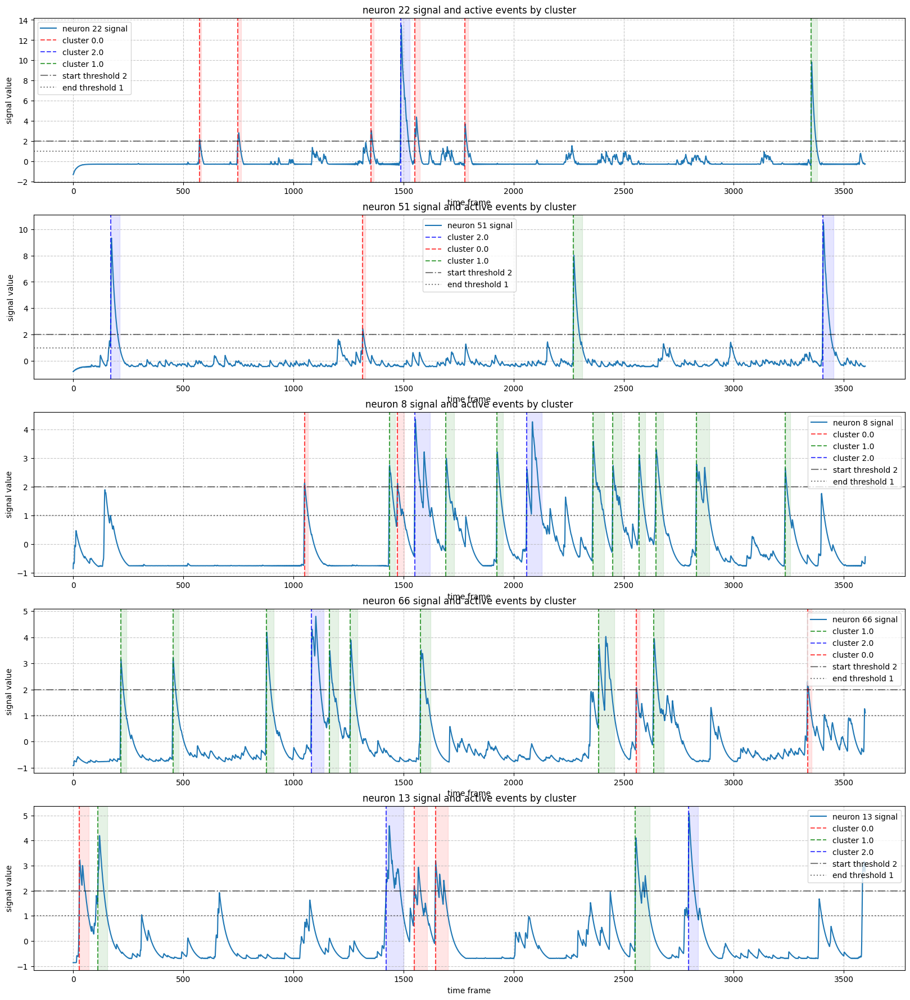

In [21]:
# 绘制选中神经元的信号和事件起始 
plt.figure(figsize=(20, 22)) 

for i, neuron_id in enumerate(selected_neuron_ids, 1):
    # 获取该神经元的信号数据
    neuron_signal = resized_df_signal_neuron[neuron_id].values
    # 获取该神经元的所有事件
    neuron_events = events_df[events_df['neuron_id'] == neuron_id].copy()
    
    # 为每个事件添加cluster_label
    neuron_events['cluster_label'] = neuron_events['event_id'].map(cluster_map)
    
    # 创建子图
    plt.subplot(len(selected_neuron_ids), 1, i)
    # 绘制信号曲线
    plt.plot(neuron_signal, label=f'neuron {neuron_id} signal')
    
    # 跟踪已添加的图例标签，避免重复
    added_labels = set()
    
    # 标记事件起始位置和区间，根据cluster_label使用不同颜色
    for _, event in neuron_events.iterrows():
        cluster_label = event['cluster_label']
        # 获取该聚类标签对应的颜色
        color = cluster_colors.get(cluster_label, 'k')  # 默认为黑色
        
        # 绘制起始点垂直线
        label = f'cluster {cluster_label}' if f'cluster {cluster_label}' not in added_labels else ""
        plt.axvline(x=event['start_frame'], color=color, linestyle='--', alpha=0.7, label=label)
        if label:
            added_labels.add(label)
        
        # 标记事件持续区间
        plt.axvspan(event['start_frame'], event['end_frame'], color=color, alpha=0.1)
    
    # 添加阈值线
    plt.axhline(y=2, color='k', linestyle='-.', alpha=0.5, label='start threshold 2')
    plt.axhline(y=1, color='k', linestyle=':', alpha=0.5, label='end threshold 1')
    
    # 设置图表属性
    plt.title(f'neuron {neuron_id} signal and active events by cluster')
    plt.xlabel('time frame')
    plt.ylabel('signal value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
plt.savefig(path_save + r'\normed intensity single and active events by cluster.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\normed intensity single and active events by cluster.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

已创建 11880 个神经元信号分段
已关联 811 个事件的聚类信息

聚类标签比例统计：
  无标签 (空): 91.34%
  标签 0: 2.47%
  标签 1: 2.88%
  标签 2: 3.32%


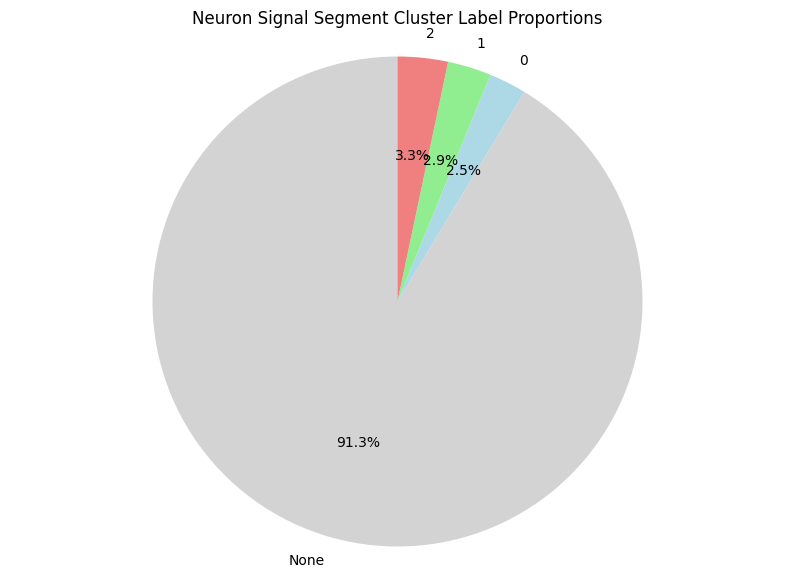

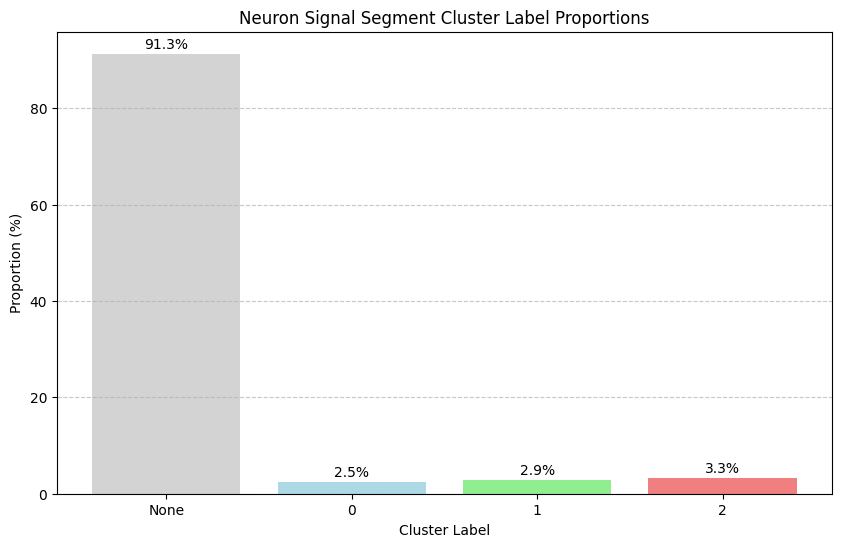

In [22]:
# 1. 将resized_df_signal_neuron按3秒（30帧）分段

def segment_neuron_signals(resized_df_signal_neuron, segment_duration_frames=30):
    """
    将神经元信号按指定帧数分段
    """
    total_frames = len(resized_df_signal_neuron)
    # 计算完整分段数量（最后不足30帧的部分也按照30帧计算）
    num_segments = (total_frames + segment_duration_frames - 1) // segment_duration_frames
    
    segments = []
    neuron_ids = resized_df_signal_neuron.columns.tolist()
    
    # 为每个神经元创建分段信息
    for neuron_id in neuron_ids:
        for seg_idx in range(num_segments):
            seg_start = seg_idx * segment_duration_frames
            seg_end = seg_start + segment_duration_frames - 1
            # 确保最后一段的结束帧不超过总帧数
            seg_end = min(seg_end, total_frames - 1)
            
            segments.append({
                'neuron_id': neuron_id,
                'segment_idx': seg_idx,
                'seg_start_frame': seg_start,
                'seg_end_frame': seg_end,
                'seg_mid_frame': (seg_start + seg_end) // 2,
                'cluster_label': None  # 初始化为None，表示未分配
            })
    
    return pd.DataFrame(segments)

# 2. 关联事件信息和聚类结果

def merge_event_cluster_info(events_df, result_df):
    """
    合并事件信息和聚类结果
    """
    # 确保两个DataFrame中的event_id可以正确关联
    # 首先从events_df中选择需要的列
    events_subset = events_df[['neuron_id', 'start_frame', 'end_frame']].copy()
    events_subset['event_id'] = events_subset.index  # 使用索引作为event_id
    
    # 从result_df中选择聚类标签
    result_subset = result_df[['event_id', 'cluster_label']].copy()
    
    # 合并两个DataFrame
    merged_events = pd.merge(events_subset, result_subset, on='event_id', how='left')
    
    # 计算每个事件的持续帧数
    merged_events['duration_frames'] = merged_events['end_frame'] - merged_events['start_frame']
    
    return merged_events

# 3. 将事件分配到分段

def assign_events_to_segments(segments_df, merged_events_df, segment_duration_frames=30, threshold_ratio=0.5):
    """
    将事件分配到分段，如果事件在分段中占据的比例超过阈值则分配
    """
    # 复制原始分段数据以避免修改源数据
    assigned_segments = segments_df.copy()
    threshold_frames = segment_duration_frames * threshold_ratio
    
    # 创建一个字典用于快速查找每个神经元的分段
    neuron_segments = {}
    for _, seg in assigned_segments.iterrows():
        neuron_id = seg['neuron_id']
        if neuron_id not in neuron_segments:
            neuron_segments[neuron_id] = []
        neuron_segments[neuron_id].append(seg)
    
    # 遍历每个事件，检查它是否应该分配到某个分段
    for _, event in merged_events_df.iterrows():
        neuron_id = event['neuron_id']
        event_start = event['start_frame']
        event_end = event['end_frame']
        cluster_label = event['cluster_label']
        
        # 跳过没有聚类标签的事件
        if pd.isna(cluster_label):
            continue
        
        # 检查该神经元是否有分段
        if neuron_id not in neuron_segments:
            continue
        
        # 检查该事件与每个分段的重叠情况
        for seg in neuron_segments[neuron_id]:
            seg_start = seg['seg_start_frame']
            seg_end = seg['seg_end_frame']
            
            # 计算重叠区域
            overlap_start = max(event_start, seg_start)
            overlap_end = min(event_end, seg_end)
            
            # 如果有重叠，计算重叠帧数
            if overlap_start < overlap_end:
                overlap_frames = overlap_end - overlap_start + 1
                
                # 如果重叠超过阈值，分配聚类标签
                if overlap_frames >= threshold_frames:
                    # 更新原始DataFrame中的值
                    mask = ((assigned_segments['neuron_id'] == neuron_id) & 
                            (assigned_segments['segment_idx'] == seg['segment_idx']))
                    assigned_segments.loc[mask, 'cluster_label'] = cluster_label
    
    return assigned_segments

# 4. 统计不同聚类标签的比例

def calculate_cluster_proportions(assigned_segments_df):
    """
    计算不同聚类标签的比例
    """
    # 确保cluster_label是字符串类型以便统计
    assigned_segments_df['cluster_label_str'] = assigned_segments_df['cluster_label'].apply(
        lambda x: 'None' if pd.isna(x) else str(int(x))
    )
    
    # 统计每个标签的数量
    label_counts = assigned_segments_df['cluster_label_str'].value_counts()
    total_segments = len(assigned_segments_df)
    
    # 计算比例
    proportions = {}  
    for label, count in label_counts.items():
        proportions[label] = count / total_segments * 100
    
    # 确保所有可能的标签都被统计（包括没有出现的标签）
    possible_labels = ['None', '0', '1', '2']
    for label in possible_labels:
        if label not in proportions:
            proportions[label] = 0
    
    # 按标签排序
    sorted_proportions = {k: proportions[k] for k in possible_labels}
    
    return sorted_proportions

# 5. 可视化统计结果

def visualize_cluster_proportions(proportions):
    """
    可视化不同聚类标签的比例
    """
    labels = list(proportions.keys())
    values = list(proportions.values())
    
    # 创建饼图
    plt.figure(figsize=(10, 7))
    plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, 
            colors=['lightgray', 'lightblue', 'lightgreen', 'lightcoral'])
    plt.title('Neuron Signal Segment Cluster Label Proportions')
    plt.axis('equal')  # 保证饼图是圆形的
    plt.show()
    
    # 创建条形图
    plt.figure(figsize=(10, 6))
    bars = plt.bar(labels, values, color=['lightgray', 'lightblue', 'lightgreen', 'lightcoral'])
    plt.title('Neuron Signal Segment Cluster Label Proportions')
    plt.xlabel('Cluster Label')
    plt.ylabel('Proportion (%)')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # 在条形图上添加数值标签
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{height:.1f}%', ha='center', va='bottom')
    
    # plt.tight_layout()
    plt.show()

# 执行完整流程
# 1. 创建分段
segments_df = segment_neuron_signals(resized_df_signal_neuron, segment_duration_frames=30)
print(f"已创建 {len(segments_df)} 个神经元信号分段")

# 2. 关联事件和聚类信息
merged_events_df = merge_event_cluster_info(events_df, result_df)
print(f"已关联 {len(merged_events_df)} 个事件的聚类信息")

# 3. 将事件分配到分段
assigned_segments_df = assign_events_to_segments(
    segments_df, 
    merged_events_df, 
    segment_duration_frames=30, 
    threshold_ratio=0.5
)

# 4. 计算聚类标签比例
cluster_proportions = calculate_cluster_proportions(assigned_segments_df)

# 5. 输出统计结果
print("\n聚类标签比例统计：")
for label, proportion in cluster_proportions.items():
    if label == 'None':
        print(f"  无标签 (空): {proportion:.2f}%")
    else:
        print(f"  标签 {label}: {proportion:.2f}%")

# 6. 可视化结果
visualize_cluster_proportions(cluster_proportions)

assigned_segments_df_events2 = assigned_segments_df.copy()

# 可选：保存结果到CSV文件
# assigned_segments_df_events2.to_csv('neuron_segments_with_cluster_labels.csv', index=False)

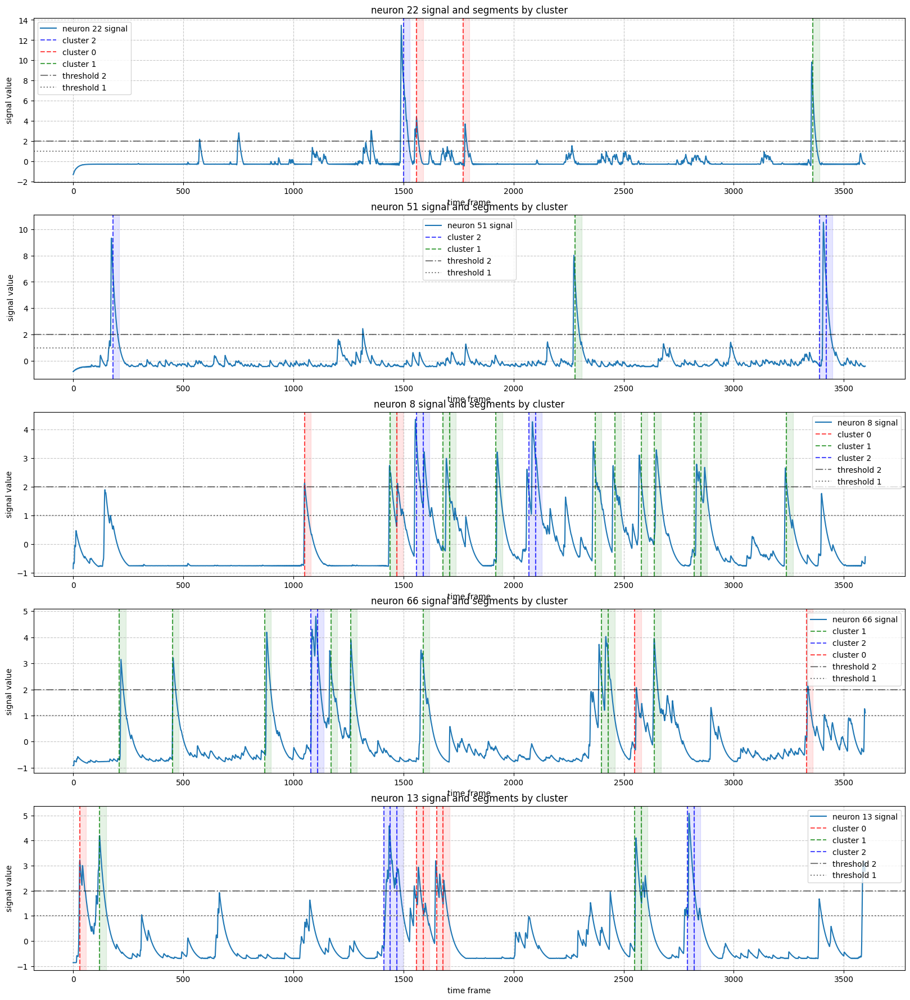

In [23]:
# 创建颜色映射字典，为不同的cluster_label分配不同颜色
# 只包含0,1,2这三个有效类别，none类型不标记颜色
cluster_colors = {
    0: 'r',   # 类别0使用红色
    1: 'g',   # 类别1使用绿色
    2: 'b'    # 类别2使用蓝色
}

# 绘制选中神经元的信号和事件起始
plt.figure(figsize=(20, 22))

for i, neuron_id in enumerate(selected_neuron_ids, 1):
    # 获取该神经元的信号数据
    neuron_signal = resized_df_signal_neuron[neuron_id].values
    # 获取该神经元的所有帧段
    neuron_segments = assigned_segments_df_events2[assigned_segments_df_events2['neuron_id'] == neuron_id].copy()
    
    # 创建子图
    plt.subplot(len(selected_neuron_ids), 1, i)
    # 绘制信号曲线
    plt.plot(neuron_signal, label=f'neuron {neuron_id} signal')
    
    # 跟踪已添加的图例标签，避免重复
    added_labels = set()
    
    # 标记帧段起始位置和区间，根据cluster_label使用不同颜色
    for _, segment in neuron_segments.iterrows():
        cluster_label = segment['cluster_label']
        
        # 跳过none类型的cluster_label，不标记颜色
        if cluster_label is None or cluster_label == 'none':
            continue
        
        # 获取该聚类标签对应的颜色
        color = cluster_colors.get(cluster_label, 'k')  # 默认为黑色
        
        # 绘制起始点垂直线
        label = f'cluster {cluster_label}' if f'cluster {cluster_label}' not in added_labels else ""
        plt.axvline(x=segment['seg_start_frame'], color=color, linestyle='--', alpha=0.7, label=label)
        if label:
            added_labels.add(label)
        
        # 标记帧段持续区间
        plt.axvspan(segment['seg_start_frame'], segment['seg_end_frame'], color=color, alpha=0.1)
    
    # 添加阈值线（如果需要）
    plt.axhline(y=2, color='k', linestyle='-.', alpha=0.5, label='threshold 2')
    plt.axhline(y=1, color='k', linestyle=':', alpha=0.5, label='threshold 1')
    
    # 设置图表属性
    plt.title(f'neuron {neuron_id} signal and segments by cluster')
    plt.xlabel('time frame')
    plt.ylabel('signal value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)


# 调整布局并显示图表
# plt.tight_layout()
plt.savefig(path_save + r'\normed intensity single and active events by cluster in single window.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\normed intensity single and active events by cluster in single window.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import silhouette_score
from scipy.integrate import simpson
from scipy.cluster.hierarchy import dendrogram, linkage

In [25]:
def calculate_standardized_area(events_df, resized_df_signal_neuron):
    """
    计算每个神经元有效事件对应的标准化面积（标准化面积 = 事件内面积/事件持续时间）
    
    参数:
    events_df: 包含神经元事件信息的数据框，需要有neuron_id, start_frame, end_frame, duration_seconds列
    resized_df_signal_neuron: 包含神经元活动信号的数据框，行索引为帧号，列名为neuron_id
    
    返回:
    events_with_area: 添加了area和standardized_area列的数据框
    """
    # 确保events_df包含必要的列
    required_columns = ['neuron_id', 'start_frame', 'end_frame', 'duration_seconds']
    for col in required_columns:
        if col not in events_df.columns:
            raise ValueError(f"events_df缺少必要的列: {col}")
    
    # 创建结果数据框
    events_with_area = events_df.copy()
    events_with_area['area'] = 0.0
    events_with_area['standardized_area'] = 0.0
    
    # 遍历每个事件，计算面积和标准化面积
    for idx, event in events_with_area.iterrows():
        neuron_id = event['neuron_id']
        start_frame = int(event['start_frame'])
        end_frame = int(event['end_frame'])
        duration_seconds = event['duration_seconds']
        
        # 确保神经元ID存在于信号数据中
        if neuron_id not in resized_df_signal_neuron.columns:
            continue
        
        # 获取事件对应的信号数据
        try:
            # 确保帧号在有效范围内
            if start_frame >= len(resized_df_signal_neuron) or end_frame >= len(resized_df_signal_neuron):
                continue
            
            signal_data = resized_df_signal_neuron.loc[start_frame:end_frame, neuron_id]
            
            # 计算面积（使用辛普森法则）
            if len(signal_data) > 1:
                area = simpson(signal_data, dx=1)  # 假设帧间隔为1
                events_with_area.at[idx, 'area'] = area
                
                # 计算标准化面积（面积/持续时间）
                if duration_seconds > 0:
                    events_with_area.at[idx, 'standardized_area'] = area / duration_seconds
        except Exception as e:
            print(f"计算神经元 {neuron_id} 事件面积时出错: {e}")
            continue
    
    return events_with_area


def cluster_neurons_by_hierarchy(resized_df_signal_neuron):
    """
    对神经元按照neuron_id进行层次聚类，使用ward方法，将神经元分为两类
    使用resized_df_signal_neuron内各神经元的值作为聚类特征
    
    参数:
    resized_df_signal_neuron: 包含神经元活动信号的数据框
    
    返回:
    neuron_clusters: 包含神经元ID和对应聚类标签的数据框
    """
    # 获取所有神经元ID
    neuron_ids = resized_df_signal_neuron.columns.tolist()
    
    # 提取每个神经元的完整时间序列作为特征
    # 注意：这里直接使用每个神经元的完整信号作为特征
    # 对于大型数据集，可能需要先进行降维
    neuron_features = []
    valid_neuron_ids = []
    
    for neuron_id in neuron_ids:
        try:
            # 获取该神经元的完整信号
            neuron_signal = resized_df_signal_neuron[neuron_id].values.reshape(1, -1)
            
            # 检查是否有足够的数据点
            if len(neuron_signal[0]) > 0:
                neuron_features.append(neuron_signal[0])
                valid_neuron_ids.append(neuron_id)
        except Exception as e:
            print(f"处理神经元 {neuron_id} 时出错: {e}")
            continue
    
    if not valid_neuron_ids:
        raise ValueError("没有找到有效的神经元数据用于聚类")
    
    # 执行层次聚类
    hierarchical_cluster = AgglomerativeClustering(
        n_clusters=2, 
        metric='euclidean', 
        linkage='ward'
    )
    cluster_labels = hierarchical_cluster.fit_predict(neuron_features)
    
    # 创建神经元聚类结果数据框
    neuron_clusters = pd.DataFrame({
        'neuron_id': valid_neuron_ids,
        'cluster_label': cluster_labels
    })
    
    # 可视化层次聚类结果
    plt.figure(figsize=(10, 6))
    linked = linkage(neuron_features, 'ward')
    dendrogram(linked, 
               orientation='top',
               labels=valid_neuron_ids,
               distance_sort='descending',
               show_leaf_counts=True)
    plt.title('neuron hierarchical clustering')
    plt.xlabel('neuron id')
    plt.ylabel('distance')
    # plt.tight_layout()
    # plt.savefig('neuron_hierarchical_clustering.png')
    plt.savefig(path_save + r'\duration neuron hierarchical clustering.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\duration neuron hierarchical clustering.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return neuron_clusters


def filter_single_event_neurons(events_with_clusters):
    """
    剔除只有单次事件的神经元
    
    参数:
    events_with_clusters: 包含神经元事件信息、标准化面积和聚类标签的数据框
    
    返回:
    filtered_events: 剔除单次事件神经元后的数据框
    multi_event_neurons: 具有多次事件的神经元ID列表
    """
    # 统计每个神经元的事件数量
    neuron_event_counts = events_with_clusters['neuron_id'].value_counts()
    
    # 筛选出事件数量大于1的神经元
    multi_event_neurons = neuron_event_counts[neuron_event_counts > 1].index.tolist()
    
    # 过滤数据框，只保留多次事件的神经元
    filtered_events = events_with_clusters[events_with_clusters['neuron_id'].isin(multi_event_neurons)]
    
    print(f"原始神经元数量: {len(neuron_event_counts)}")
    print(f"剔除单次事件神经元后数量: {len(multi_event_neurons)}")
    print(f"保留事件数量: {len(filtered_events)}")
    
    return filtered_events, multi_event_neurons


def calculate_cluster_statistics(events_with_clusters):
    """
    计算两类各自的事件持续时间和标准化面积的群体均值和标准差
    
    参数:
    events_with_clusters: 包含神经元事件信息、标准化面积和聚类标签的数据框
    
    返回:
    cluster_stats: 包含各类别统计信息的字典
    """
    cluster_stats = {}
    
    # 遍历每个聚类标签
    for cluster_label in events_with_clusters['cluster_label'].unique():
        if pd.isna(cluster_label):
            continue
        
        # 获取当前聚类的所有事件
        cluster_events = events_with_clusters[events_with_clusters['cluster_label'] == cluster_label]
        
        # 计算统计信息
        duration_mean = cluster_events['duration_seconds'].mean()
        duration_std = cluster_events['duration_seconds'].std()
        std_area_mean = cluster_events['standardized_area'].mean()
        std_area_std = cluster_events['standardized_area'].std()
        
        # 存储统计信息
        cluster_stats[int(cluster_label)] = {
            'duration_mean': duration_mean,
            'duration_std': duration_std,
            'std_area_mean': std_area_mean,
            'std_area_std': std_area_std,
            'event_count': len(cluster_events),
            'neuron_count': cluster_events['neuron_id'].nunique()
        }
    
    return cluster_stats


def z_score_normalize_by_cluster(events_with_clusters, cluster_stats):
    """
    根据不同类别，用各自的群体均值和标准差对持续时间和标准化面积进行Z-score标准化
    标准化后值 = (原始值 - 类别群体均值) / 类别群体标准差
    
    参数:
    events_with_clusters: 包含神经元事件信息、标准化面积和聚类标签的数据框
    cluster_stats: 包含各类别统计信息的字典
    
    返回:
    events_normalized: 添加了标准化后的持续时间和标准化面积列的数据框
    """
    events_normalized = events_with_clusters.copy()
    events_normalized['duration_zscore'] = np.nan
    events_normalized['std_area_zscore'] = np.nan
    
    # 遍历每个事件，进行Z-score标准化
    for idx, event in events_normalized.iterrows():
        cluster_label = event['cluster_label']
        
        if pd.isna(cluster_label):
            continue
        
        cluster_label = int(cluster_label)
        
        if cluster_label not in cluster_stats:
            continue
        
        # 获取当前聚类的统计信息
        stats = cluster_stats[cluster_label]
        
        # 对持续时间进行Z-score标准化
        if stats['duration_std'] > 0:
            events_normalized.at[idx, 'duration_zscore'] = (
                event['duration_seconds'] - stats['duration_mean']
            ) / stats['duration_std']
        
        # 对标准化面积进行Z-score标准化
        if stats['std_area_std'] > 0:
            events_normalized.at[idx, 'std_area_zscore'] = (
                event['standardized_area'] - stats['std_area_mean']
            ) / stats['std_area_std']
    
    return events_normalized


def perform_kmeans_clustering(events_normalized, k_range=range(2, 7)):
    """
    使用标准化后的特征进行k-means聚类，用肘部法则和轮廓系数确定最优k值
    
    参数:
    events_normalized: 包含标准化后的持续时间和标准化面积列的数据框
    k_range: k值的范围，默认为2到6
    
    返回:
    events_with_kmeans: 添加了k-means聚类标签列的数据框
    best_k: 根据评估指标确定的最优k值
    """
    # 准备用于聚类的特征
    features = events_normalized[['duration_zscore', 'std_area_zscore']].dropna()
    
    if len(features) < 2:
        raise ValueError("没有足够的有效数据用于k-means聚类")
    
    # 存储不同k值的评估指标
    sse = []  # 簇内平方和
    silhouette_scores = []
    
    # 执行k-means聚类并计算评估指标
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(features)
        
        # 计算簇内平方和
        sse.append(kmeans.inertia_)
        
        # 计算轮廓系数
        if k > 1:  # 轮廓系数需要至少2个簇
            silhouette_avg = silhouette_score(features, cluster_labels)
            silhouette_scores.append(silhouette_avg)
        else:
            silhouette_scores.append(0)
    
    # 可视化评估指标
    plt.figure(figsize=(12, 5))
    
    # 绘制簇内平方和（肘部法则）
    plt.subplot(1, 2, 1)
    plt.plot(k_range, sse, 'o-')
    plt.title('K-means clustering WCSS')
    plt.xlabel('k value')
    plt.ylabel('WCSS')
    plt.grid(True)
    
    # 绘制轮廓系数
    plt.subplot(1, 2, 2)
    plt.plot(k_range, silhouette_scores, 'o-')
    plt.title('K-means clustering silhouette score')
    plt.xlabel('k value')
    plt.ylabel('silhouette score')
    plt.grid(True)
    
    # plt.tight_layout()
    # plt.savefig('kmeans_evaluation_metrics.png')
    plt.savefig(path_save + r'\duration WCSS and silhouette score.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\duration WCSS and silhouette score.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 确定最优k值（选择轮廓系数最大的k值）
    # best_k = k_range[np.argmax(silhouette_scores)]
    best_k = 3
    
    # 使用最优k值执行k-means聚类
    best_kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
    best_cluster_labels = best_kmeans.fit_predict(features)
    
    # 创建结果数据框
    events_with_kmeans = events_normalized.copy()
    
    # 将聚类标签添加到结果数据框中
    temp_df = pd.DataFrame({
        'kmeans_cluster': best_cluster_labels
    }, index=features.index)
    
    events_with_kmeans = pd.merge(
        events_with_kmeans, 
        temp_df[['kmeans_cluster']], 
        left_index=True, 
        right_index=True, 
        how='left'
    )
    
    # 可视化最优k值的聚类结果
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(
        features['duration_zscore'], 
        features['std_area_zscore'], 
        c=best_cluster_labels, 
        cmap='viridis',
        s=50,
        alpha=0.7
    )
    plt.scatter(
        best_kmeans.cluster_centers_[:, 0], 
        best_kmeans.cluster_centers_[:, 1], 
        c='red', 
        marker='x', 
        s=200, 
        label='cluster center'
    )
    plt.title(f'K-means clustering result k={best_k}')
    plt.xlabel('standardized duration Z-score')
    plt.ylabel('standardized area Z-score')
    plt.colorbar(scatter, label='cluster label')
    plt.legend()
    plt.grid(True)
    # plt.tight_layout()
    # plt.savefig(f'kmeans_clustering_result_k{best_k}.png')
    plt.savefig(path_save + r'\duration scatter.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\duration scatter.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return events_with_kmeans, best_k


def analyze_neuron_events(events_df, resized_df_signal_neuron):
    """
    主分析函数：整合完整的分析流程
    
    参数:
    events_df: 包含神经元事件信息的数据框
    resized_df_signal_neuron: 包含神经元活动信号的数据框
    
    返回:
    包含所有分析结果的字典
    """
    print("开始神经元事件分析流程...")
    
    # 步骤1：计算标准化面积
    print("步骤1：计算每个神经元事件的标准化面积...")
    events_with_area = calculate_standardized_area(events_df, resized_df_signal_neuron)
    
    # 步骤2：对神经元进行层次聚类
    print("步骤2：对神经元进行层次聚类...")
    neuron_clusters = cluster_neurons_by_hierarchy(resized_df_signal_neuron)
    
    # # 将神经元ID转换为相同类型以便合并
    # events_with_area['neuron_id'] = events_with_area['neuron_id'].astype(str)
    # neuron_clusters['neuron_id'] = neuron_clusters['neuron_id'].astype(str)
    
    # 将聚类结果合并到事件数据框中
    events_with_clusters = pd.merge(
        events_with_area, 
        neuron_clusters, 
        on='neuron_id', 
        how='left'
    )
    
    # 步骤3：剔除只有单次事件的神经元
    print("步骤3：剔除只有单次事件的神经元...")
    filtered_events, multi_event_neurons = filter_single_event_neurons(events_with_clusters)
    
    # 步骤4：计算各类别的统计信息
    print("步骤4：计算各类别的群体均值和标准差...")
    cluster_stats = calculate_cluster_statistics(filtered_events)
    print("类别统计信息:")
    for cluster, stats in cluster_stats.items():
        print(f"类别 {cluster}:")
        print(f"  神经元数量: {stats['neuron_count']}")
        print(f"  事件数量: {stats['event_count']}")
        print(f"  持续时间均值: {stats['duration_mean']:.4f} 秒")
        print(f"  持续时间标准差: {stats['duration_std']:.4f} 秒")
        print(f"  标准化面积均值: {stats['std_area_mean']:.4f}")
        print(f"  标准化面积标准差: {stats['std_area_std']:.4f}")
    
    # 步骤5：根据类别进行Z-score标准化
    print("步骤5：根据类别进行Z-score标准化...")
    events_normalized = z_score_normalize_by_cluster(events_with_clusters, cluster_stats)

    
    # 步骤6：使用标准化后的特征进行k-means聚类
    print("步骤6：使用标准化后的特征进行k-means聚类...")
    events_with_kmeans, best_k = perform_kmeans_clustering(events_normalized)
    print(f"最优k值: {best_k}")
    
    # 保存结果
    # print("保存分析结果...")
    # events_with_kmeans.to_csv('neuron_event_analysis_results.csv', index=False)
    # neuron_clusters.to_csv('neuron_hierarchical_clusters.csv', index=False)
    # filtered_events.to_csv('filtered_events.csv', index=False)
    
    # 保存类别统计信息
    stats_df = pd.DataFrame.from_dict(cluster_stats, orient='index')
    stats_df.index.name = 'cluster_label'
    # stats_df.to_csv('cluster_statistics.csv')
    
    print("分析流程完成！")
    
    return {
        'events_with_kmeans': events_with_kmeans,
        'neuron_clusters': neuron_clusters,
        'filtered_events': filtered_events,
        'cluster_stats': cluster_stats,
        'best_k': best_k
        ,
        'events_normalized': events_normalized
    }


开始神经元事件分析流程...
步骤1：计算每个神经元事件的标准化面积...
步骤2：对神经元进行层次聚类...


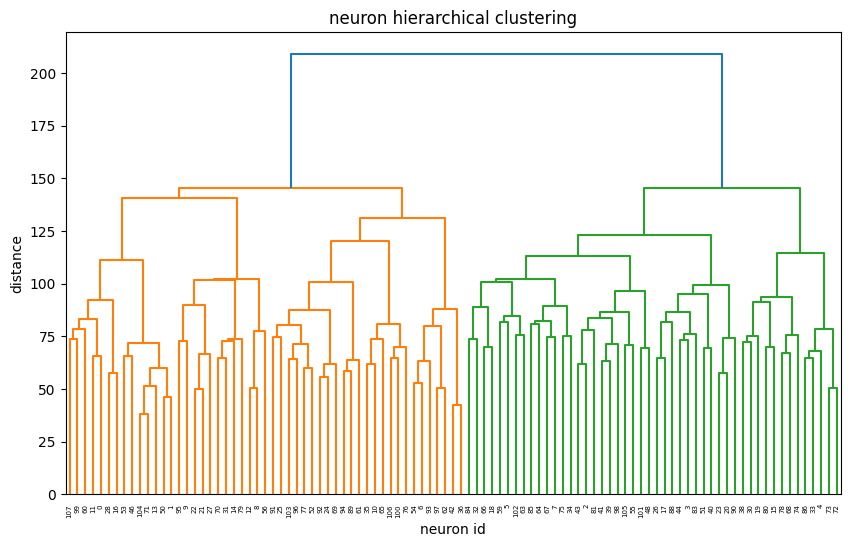

步骤3：剔除只有单次事件的神经元...
原始神经元数量: 99
剔除单次事件神经元后数量: 98
保留事件数量: 810
步骤4：计算各类别的群体均值和标准差...
类别统计信息:
类别 0:
  神经元数量: 51
  事件数量: 432
  持续时间均值: 3.7972 秒
  持续时间标准差: 2.8885 秒
  标准化面积均值: 22.9957
  标准化面积标准差: 7.8384
类别 1:
  神经元数量: 47
  事件数量: 378
  持续时间均值: 3.4992 秒
  持续时间标准差: 2.4900 秒
  标准化面积均值: 23.8887
  标准化面积标准差: 9.1769
步骤5：根据类别进行Z-score标准化...
步骤6：使用标准化后的特征进行k-means聚类...


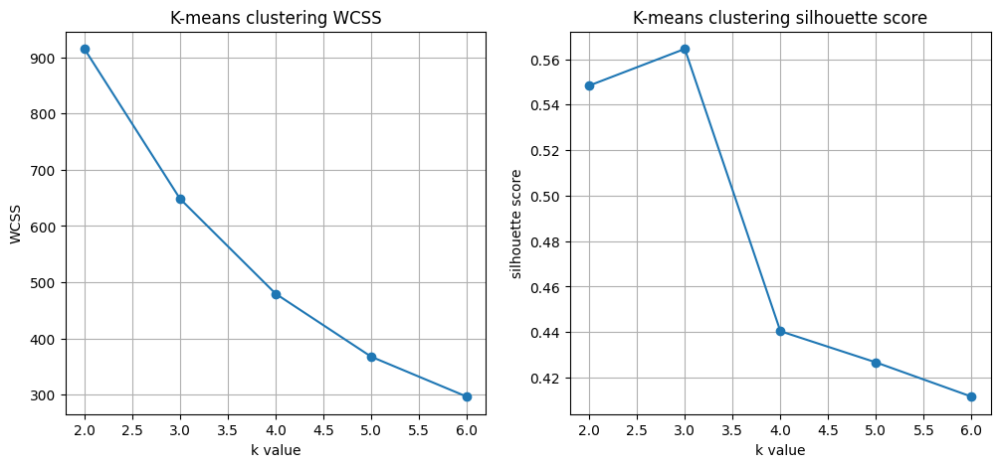

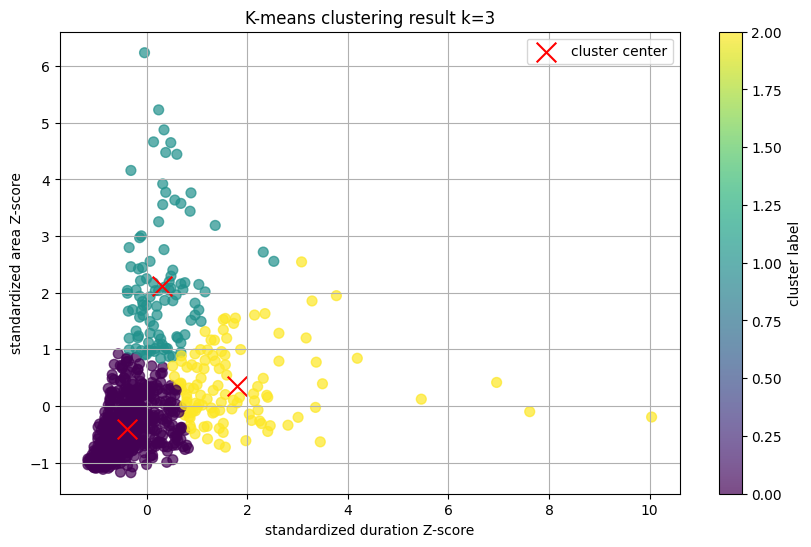

最优k值: 3
分析流程完成！


In [26]:
result = analyze_neuron_events(events_df, resized_df_signal_neuron)

In [27]:
# 获取数据集
df = result['events_with_kmeans']

# 检查数据集基本信息
print(f"原始数据集形状: {df.shape}")
print(f"kmeans_cluster唯一值: {df['kmeans_cluster'].unique()}")

# 步骤1: 计算每一类的std_area_zscore和duration_zscore的平均值
cluster_means = df.groupby('kmeans_cluster').agg({
    'std_area_zscore': 'mean',
    'duration_zscore': 'mean'
}).reset_index()

print("\n各类别平均值统计:")
print(cluster_means)

# 步骤2: 确定新的标签赋值
label_mapping = {}

# 计算两个指标的总和，用于确定两个平均值都最小的类别
cluster_means['sum_zscores'] = cluster_means['std_area_zscore'] + cluster_means['duration_zscore']

# 找到两个平均值都最小的类别（sum_zscores最小）
min_sum_label = cluster_means.loc[cluster_means['sum_zscores'].idxmin(), 'kmeans_cluster']
label_mapping[min_sum_label] = 0

# 找到duration_zscore平均值最大的类别（排除已赋值的类别）
remaining_clusters = cluster_means[cluster_means['kmeans_cluster'] != min_sum_label]
max_duration_label = remaining_clusters.loc[remaining_clusters['duration_zscore'].idxmax(), 'kmeans_cluster']
label_mapping[max_duration_label] = 2

# 找到duration_zscore平均值最大的类别（最后剩余的类别）
last_cluster = remaining_clusters[remaining_clusters['kmeans_cluster'] != max_duration_label]['kmeans_cluster'].iloc[0]
label_mapping[last_cluster] = 1

print("\n标签映射关系:")
for original, new in label_mapping.items():
    print(f"原始标签 {original} → 新标签 {new}")

# 步骤3: 应用新的标签赋值
result['events_with_kmeans']['kmeans_cluster'] = result['events_with_kmeans']['kmeans_cluster'].map(label_mapping)

# 验证结果
new_cluster_means = result['events_with_kmeans'].groupby('kmeans_cluster').agg({
    'std_area_zscore': 'mean',
    'duration_zscore': 'mean'
}).reset_index()

print("\n重新赋值后的各类别平均值:")
print(new_cluster_means.sort_values('kmeans_cluster'))

print("\n处理完成！kmeans_cluster已按照要求重新赋值。")
print("新的kmeans_cluster分布:")
print(result['events_with_kmeans']['kmeans_cluster'].value_counts().sort_index())

原始数据集形状: (811, 13)
kmeans_cluster唯一值: [0 2 1]

各类别平均值统计:
   kmeans_cluster  std_area_zscore  duration_zscore
0               0        -0.400966        -0.381194
1               1         2.118819         0.305071
2               2         0.360113         1.797673

标签映射关系:
原始标签 0 → 新标签 0
原始标签 2 → 新标签 2
原始标签 1 → 新标签 1

重新赋值后的各类别平均值:
   kmeans_cluster  std_area_zscore  duration_zscore
0               0        -0.400966        -0.381194
1               1         2.118819         0.305071
2               2         0.360113         1.797673

处理完成！kmeans_cluster已按照要求重新赋值。
新的kmeans_cluster分布:
kmeans_cluster
0    602
1     98
2    111
Name: count, dtype: int64


In [28]:
result_events_df = result['events_with_kmeans']


In [29]:
resized_df_signal_neuron

unit_id,0,1,2,3,4,5,6,7,8,9,...,98,99,100,101,102,103,104,105,106,107
0,-0.789410,-0.720916,-0.670113,-0.634646,-0.702013,-0.583965,-0.672138,-1.113087,-0.848276,-0.879194,...,-0.688926,-0.577872,-0.681886,-1.227834,-0.892276,-0.684131,-0.680612,-0.746040,-0.765006,-1.041098
1,-0.263401,0.216033,-0.670113,-0.523480,-0.692366,-0.299813,-0.652888,-1.113087,-0.647938,-0.832378,...,-0.688926,0.576989,-0.678236,-1.104265,-0.892276,-0.675017,0.581940,-0.746040,-0.735551,-0.896627
2,-0.266523,0.237533,-0.670113,-0.511275,-0.671294,-0.011737,-0.654548,-1.113087,-0.653969,-0.832220,...,-0.688926,1.609918,-0.663071,-1.031859,-0.892276,-0.667198,0.925166,-0.746040,-0.733549,-0.875685
3,-0.290370,0.208463,-0.670113,-0.518672,-0.667337,-0.010026,-0.656162,-1.113087,-0.662667,-0.835579,...,-0.688926,2.381776,-0.645089,-1.010502,-0.892276,-0.657458,0.885458,-0.746040,-0.734502,-0.883724
4,-0.313510,0.179983,-0.670113,-0.525739,-0.668520,-0.033628,-0.657732,-1.101044,-0.671119,-0.834576,...,-0.688926,2.859078,-0.631423,-0.983644,-0.892276,-0.643884,0.846494,-0.746040,-0.735432,-0.891444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3593,-0.802148,-0.730662,1.283585,-0.382975,-0.485164,-0.368360,-0.492444,-0.184975,-0.664518,-0.274797,...,-0.532041,-0.777855,-0.312133,-0.107856,2.192054,-0.367882,-0.839943,0.205961,-0.503517,2.384538
3594,-0.810117,-0.740087,1.234237,-0.379237,-0.478796,-0.377374,-0.498499,-0.217594,-0.672917,-0.286765,...,-0.525504,-0.784306,-0.311302,-0.082993,2.084825,-0.371479,-0.846584,0.186164,-0.494670,2.247504
3595,-0.817850,-0.749320,1.186137,-0.392528,-0.461947,-0.387346,-0.504388,-0.249066,-0.681079,-0.316469,...,-0.522613,-0.790526,-0.303581,-0.120620,1.981323,-0.374667,-0.853102,0.157944,-0.501325,2.115892
3596,-0.758898,-0.541868,1.139251,-0.404682,-0.461540,-0.396949,-0.274613,-0.279432,-0.657135,-0.342849,...,-0.525666,-0.669530,-0.297985,-0.176067,1.881420,-0.373797,-0.598405,0.150567,-0.507821,1.989487


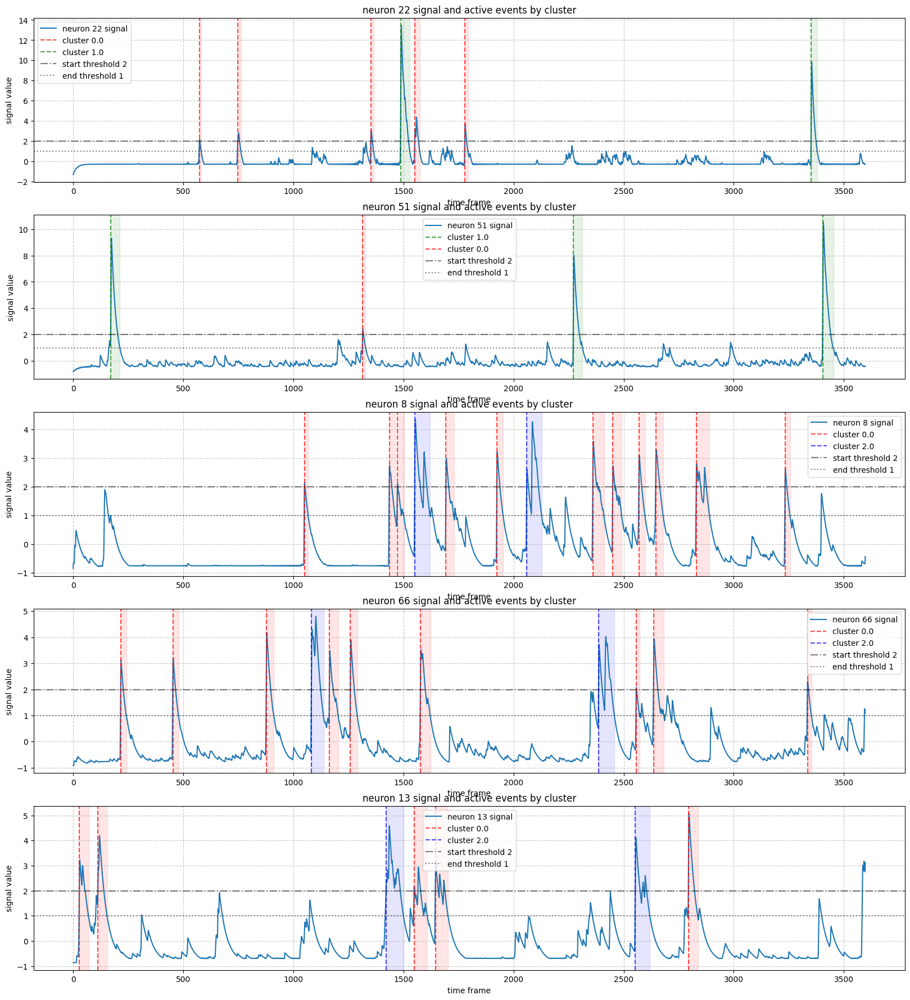

In [30]:
# 创建颜色映射字典，为不同的cluster_label分配不同颜色
# 可以根据需要调整颜色列表或添加更多颜色
cluster_colors = {
    0: 'r',  # 类别0使用红色
    1: 'g',  # 类别1使用绿色
    2: 'b',  # 类别2使用蓝色
    3: 'm',  # 类别3使用洋红色
    4: 'c',  # 类别4使用青色
    5: 'y'   # 类别5使用黄色
}


# 创建事件ID到cluster_label的映射字典
cluster_map = dict(zip(result_events_df['event_id'], result_events_df['kmeans_cluster']))

# 绘制选中神经元的信号和事件起始 
plt.figure(figsize=(20, 22)) 

for i, neuron_id in enumerate(selected_neuron_ids, 1):
    # 获取该神经元的信号数据
    neuron_signal = resized_df_signal_neuron[neuron_id].values
    # 获取该神经元的所有事件
    neuron_events = result_events_df[result_events_df['neuron_id'] == neuron_id].copy()
    
    # # 为每个事件添加cluster_label
    # neuron_events['kmeans_cluster'] = neuron_events['event_id'].map(cluster_map)
    
    # 创建子图
    plt.subplot(len(selected_neuron_ids), 1, i)
    # 绘制信号曲线
    plt.plot(neuron_signal, label=f'neuron {neuron_id} signal')
    
    # 跟踪已添加的图例标签，避免重复
    added_labels = set()
    
    # 标记事件起始位置和区间，根据cluster_label使用不同颜色
    for _, event in neuron_events.iterrows():
        cluster_label = event['kmeans_cluster']
        # 获取该聚类标签对应的颜色
        color = cluster_colors.get(cluster_label, 'k')  # 默认为黑色
        
        # 绘制起始点垂直线
        label = f'cluster {cluster_label}' if f'cluster {cluster_label}' not in added_labels else ""
        plt.axvline(x=event['start_frame'], color=color, linestyle='--', alpha=0.7, label=label)
        if label:
            added_labels.add(label)
        
        # 标记事件持续区间
        plt.axvspan(event['start_frame'], event['end_frame'], color=color, alpha=0.1)
    
    # 添加阈值线
    plt.axhline(y=2, color='k', linestyle='-.', alpha=0.5, label='start threshold 2')
    plt.axhline(y=1, color='k', linestyle=':', alpha=0.5, label='end threshold 1')
    
    # 设置图表属性
    plt.title(f'neuron {neuron_id} signal and active events by cluster')
    plt.xlabel('time frame')
    plt.ylabel('signal value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
plt.savefig(path_save + r'\duration signal and active events by cluster.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\duration signal and active events by cluster.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

已创建 11880 个神经元信号分段

聚类标签比例统计：
  无标签 (空): 91.34%
  标签 0: 4.63%
  标签 1: 1.30%
  标签 2: 2.74%


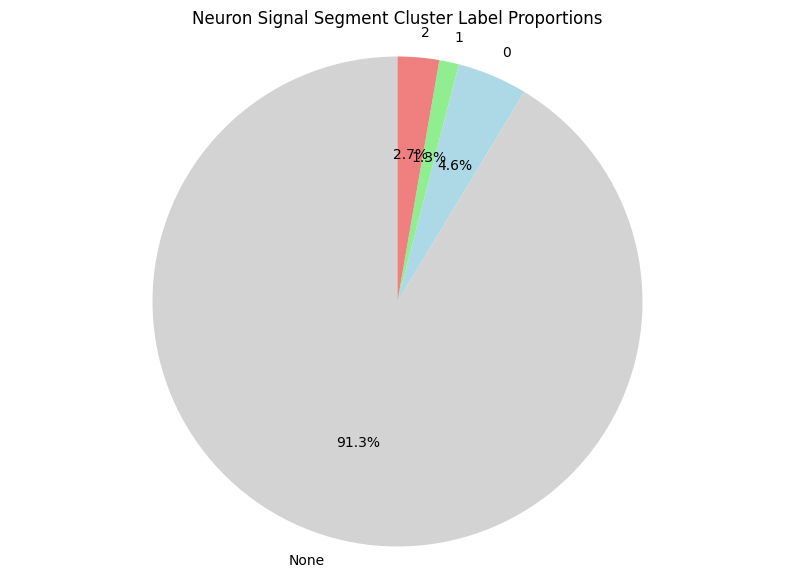

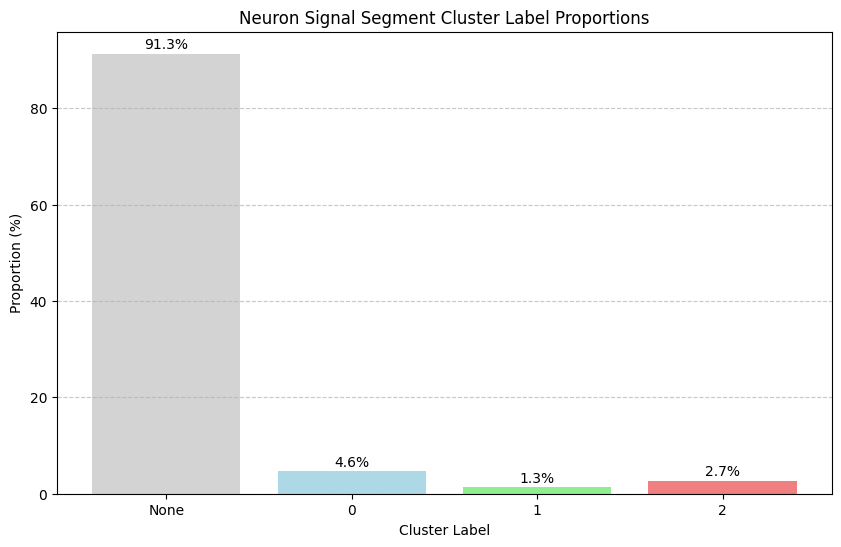

In [31]:
# 1. 将resized_df_signal_neuron按3秒（30帧）分段

def segment_neuron_signals(resized_df_signal_neuron, segment_duration_frames=30):
    """
    将神经元信号按指定帧数分段
    """
    total_frames = len(resized_df_signal_neuron)
    # 计算完整分段数量（最后不足30帧的部分也按照30帧计算）
    num_segments = (total_frames + segment_duration_frames - 1) // segment_duration_frames
    
    segments = []
    neuron_ids = resized_df_signal_neuron.columns.tolist()
    
    # 为每个神经元创建分段信息
    for neuron_id in neuron_ids:
        for seg_idx in range(num_segments):
            seg_start = seg_idx * segment_duration_frames
            seg_end = seg_start + segment_duration_frames - 1
            # 确保最后一段的结束帧不超过总帧数
            seg_end = min(seg_end, total_frames - 1)
            
            segments.append({
                'neuron_id': neuron_id,
                'segment_idx': seg_idx,
                'seg_start_frame': seg_start,
                'seg_end_frame': seg_end,
                'seg_mid_frame': (seg_start + seg_end) // 2,
                'cluster_label': None  # 初始化为None，表示未分配
            })
    
    return pd.DataFrame(segments)

# 2. 关联事件信息和聚类结果

def merge_event_cluster_info(events_df, result_df):
    """
    合并事件信息和聚类结果
    """
    # 确保两个DataFrame中的event_id可以正确关联
    # 首先从events_df中选择需要的列
    events_subset = events_df[['neuron_id', 'start_frame', 'end_frame']].copy()
    events_subset['event_id'] = events_subset.index  # 使用索引作为event_id
    
    # 从result_df中选择聚类标签
    result_subset = result_df[['event_id', 'cluster_label']].copy()
    
    # 合并两个DataFrame
    merged_events = pd.merge(events_subset, result_subset, on='event_id', how='left')
    
    # 计算每个事件的持续帧数
    merged_events['duration_frames'] = merged_events['end_frame'] - merged_events['start_frame']
    
    return merged_events

# 3. 将事件分配到分段

def assign_events_to_segments(segments_df, merged_events_df, segment_duration_frames=30, threshold_ratio=0.5):
    """
    将事件分配到分段，如果事件在分段中占据的比例超过阈值则分配
    """
    # 复制原始分段数据以避免修改源数据
    assigned_segments = segments_df.copy()
    threshold_frames = segment_duration_frames * threshold_ratio
    
    # 创建一个字典用于快速查找每个神经元的分段
    neuron_segments = {}
    for _, seg in assigned_segments.iterrows():
        neuron_id = seg['neuron_id']
        if neuron_id not in neuron_segments:
            neuron_segments[neuron_id] = []
        neuron_segments[neuron_id].append(seg)
    
    # 遍历每个事件，检查它是否应该分配到某个分段
    for _, event in merged_events_df.iterrows():
        neuron_id = event['neuron_id']
        event_start = event['start_frame']
        event_end = event['end_frame']
        cluster_label = event['kmeans_cluster']
        
        # 跳过没有聚类标签的事件
        if pd.isna(cluster_label):
            continue
        
        # 检查该神经元是否有分段
        if neuron_id not in neuron_segments:
            continue
        
        # 检查该事件与每个分段的重叠情况
        for seg in neuron_segments[neuron_id]:
            seg_start = seg['seg_start_frame']
            seg_end = seg['seg_end_frame']
            
            # 计算重叠区域
            overlap_start = max(event_start, seg_start)
            overlap_end = min(event_end, seg_end)
            
            # 如果有重叠，计算重叠帧数
            if overlap_start < overlap_end:
                overlap_frames = overlap_end - overlap_start + 1
                
                # 如果重叠超过阈值，分配聚类标签
                if overlap_frames >= threshold_frames:
                    # 更新原始DataFrame中的值
                    mask = ((assigned_segments['neuron_id'] == neuron_id) & 
                            (assigned_segments['segment_idx'] == seg['segment_idx']))
                    assigned_segments.loc[mask, 'kmeans_cluster'] = cluster_label
    
    return assigned_segments

# 4. 统计不同聚类标签的比例

def calculate_cluster_proportions(assigned_segments_df):
    """
    计算不同聚类标签的比例
    """
    # 确保cluster_label是字符串类型以便统计
    assigned_segments_df['kmeans_cluster_str'] = assigned_segments_df['kmeans_cluster'].apply(
        lambda x: 'None' if pd.isna(x) else str(int(x))
    )
    
    # 统计每个标签的数量
    label_counts = assigned_segments_df['kmeans_cluster_str'].value_counts()
    total_segments = len(assigned_segments_df)
    
    # 计算比例
    proportions = {}  
    for label, count in label_counts.items():
        proportions[label] = count / total_segments * 100
    
    # 确保所有可能的标签都被统计（包括没有出现的标签）
    possible_labels = ['None', '0', '1', '2']
    for label in possible_labels:
        if label not in proportions:
            proportions[label] = 0
    
    # 按标签排序
    sorted_proportions = {k: proportions[k] for k in possible_labels}
    
    return sorted_proportions

# 5. 可视化统计结果

def visualize_cluster_proportions(proportions):
    """
    可视化不同聚类标签的比例
    """
    labels = list(proportions.keys())
    values = list(proportions.values())
    
    # 创建饼图
    plt.figure(figsize=(10, 7))
    plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, 
            colors=['lightgray', 'lightblue', 'lightgreen', 'lightcoral'])
    plt.title('Neuron Signal Segment Cluster Label Proportions')
    plt.axis('equal')  # 保证饼图是圆形的
    plt.show()
    
    # 创建条形图
    plt.figure(figsize=(10, 6))
    bars = plt.bar(labels, values, color=['lightgray', 'lightblue', 'lightgreen', 'lightcoral'])
    plt.title('Neuron Signal Segment Cluster Label Proportions')
    plt.xlabel('Cluster Label')
    plt.ylabel('Proportion (%)')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # 在条形图上添加数值标签
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{height:.1f}%', ha='center', va='bottom')
    
    # plt.tight_layout()
    plt.show()

# 执行完整流程
# 1. 创建分段
segments_df = segment_neuron_signals(resized_df_signal_neuron, segment_duration_frames=30)
print(f"已创建 {len(segments_df)} 个神经元信号分段")

# # 2. 关联事件和聚类信息
# merged_events_df = merge_event_cluster_info(events_df, result_df)
# print(f"已关联 {len(merged_events_df)} 个事件的聚类信息")

# 3. 将事件分配到分段
assigned_segments_df = assign_events_to_segments(
    segments_df, 
    result_events_df, 
    segment_duration_frames=30, 
    threshold_ratio=0.5
)

# 4. 计算聚类标签比例
cluster_proportions = calculate_cluster_proportions(assigned_segments_df)

# 5. 输出统计结果
print("\n聚类标签比例统计：")
for label, proportion in cluster_proportions.items():
    if label == 'None':
        print(f"  无标签 (空): {proportion:.2f}%")
    else:
        print(f"  标签 {label}: {proportion:.2f}%")

# 6. 可视化结果
visualize_cluster_proportions(cluster_proportions)

assigned_segments_df_events3 = assigned_segments_df.copy()

# 可选：保存结果到CSV文件
# assigned_segments_df_events3.to_csv('neuron_segments_with_cluster_labels.csv', index=False)

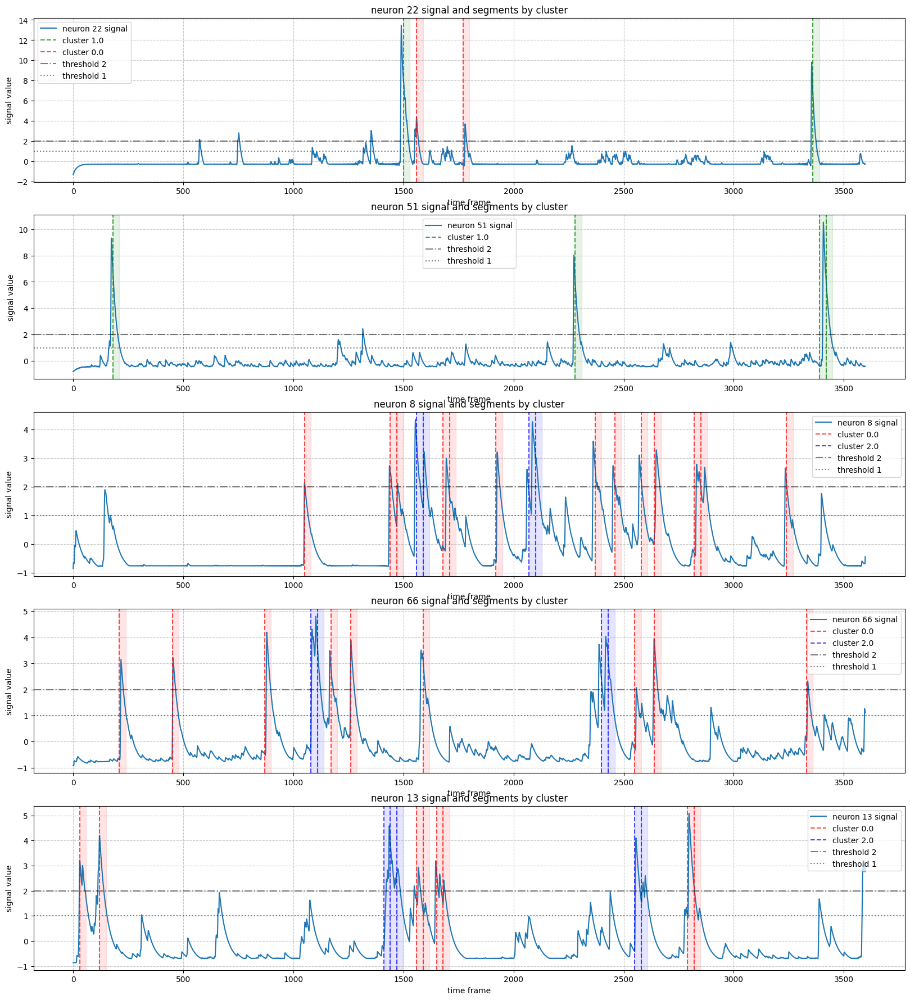

In [32]:
# 创建颜色映射字典，为不同的cluster_label分配不同颜色
# 只包含0,1,2这三个有效类别，none类型不标记颜色
cluster_colors = {
    0: 'r',   # 类别0使用红色
    1: 'g',   # 类别1使用绿色
    2: 'b'    # 类别2使用蓝色
}

# 绘制选中神经元的信号和事件起始
plt.figure(figsize=(20, 22))

for i, neuron_id in enumerate(selected_neuron_ids, 1):
    # 获取该神经元的信号数据
    neuron_signal = resized_df_signal_neuron[neuron_id].values
    # 获取该神经元的所有帧段
    neuron_segments = assigned_segments_df_events3[assigned_segments_df_events3['neuron_id'] == neuron_id].copy()
    
    # 创建子图
    plt.subplot(len(selected_neuron_ids), 1, i)
    # 绘制信号曲线
    plt.plot(neuron_signal, label=f'neuron {neuron_id} signal')
    
    # 跟踪已添加的图例标签，避免重复
    added_labels = set()
    
    # 标记帧段起始位置和区间，根据cluster_label使用不同颜色
    for _, segment in neuron_segments.iterrows():
        cluster_label = segment['kmeans_cluster']
        
        # 跳过none类型的cluster_label，不标记颜色
        if math.isnan(cluster_label) or cluster_label == 'None':
            continue
        
        # 获取该聚类标签对应的颜色
        color = cluster_colors.get(cluster_label, 'k')  # 默认为黑色
        
        # 绘制起始点垂直线
        label = f'cluster {cluster_label}' if f'cluster {cluster_label}' not in added_labels else ""
        plt.axvline(x=segment['seg_start_frame'], color=color, linestyle='--', alpha=0.7, label=label)
        if label:
            added_labels.add(label)
        
        # 标记帧段持续区间
        plt.axvspan(segment['seg_start_frame'], segment['seg_end_frame'], color=color, alpha=0.1)
    
    # 添加阈值线（如果需要）
    plt.axhline(y=2, color='k', linestyle='-.', alpha=0.5, label='threshold 2')
    plt.axhline(y=1, color='k', linestyle=':', alpha=0.5, label='threshold 1')
    
    # 设置图表属性
    plt.title(f'neuron {neuron_id} signal and segments by cluster')
    plt.xlabel('time frame')
    plt.ylabel('signal value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)


# 调整布局并显示图表
# plt.tight_layout()
plt.savefig(path_save + r'\duration signal and active events by cluster single window.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\duration signal and active events by cluster single window.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

In [33]:
# 函数：将神经元信号按3s（30帧）分段
def segment_neuron_data_by_3s(df_neuron, frame_rate=10):
    """
    将神经元信号数据按3秒（30帧）为时间段进行分段
    
    参数:
    df_neuron: 神经元信号数据框，行=时间帧，列=神经元ID
    frame_rate: 帧率，默认10帧/秒
    
    返回:
    分段后的时间区间列表和总段数
    """
    total_frames = len(df_neuron)
    segment_duration_frames = 3 * frame_rate  # 3秒 = 30帧
    
    # 创建分段区间
    segments = []
    for i in range(0, total_frames, segment_duration_frames):
        segment_start = i
        segment_end = min(i + segment_duration_frames - 1, total_frames - 1)
        segments.append((segment_start, segment_end))
    
    return segments

# 函数：将事件映射到3s时间段并判断有效性
def map_events_to_segments(segments, events_df, total_neurons):
    """
    将事件映射到3s时间段，判断每个时间段内每个神经元的活动是否有效
    
    参数:
    segments: 时间段区间列表
    events_df: 事件数据框，包含neuron_id, start_time, end_time
    total_neurons: 总神经元数量
    
    返回:
    有效性矩阵（段×神经元）和有效活动比例数组
    """
    # 初始化有效性矩阵，False表示无效，True表示有效
    validity_matrix = np.zeros((len(segments), total_neurons), dtype=bool)
    
    # 对每个时间段进行处理
    for seg_idx, (seg_start, seg_end) in enumerate(segments):
        seg_duration = seg_end - seg_start + 1
        min_valid_frames = seg_duration // 2  # 50%的时间段长度
        
        # 对每个神经元检查是否有足够长的事件覆盖
        for neuron_idx in range(total_neurons):
            # 筛选该神经元在当前时间段内的所有事件
            neuron_events = events_df[events_df['neuron_id'] == neuron_idx].copy()
            overlapping_events = neuron_events[
                (neuron_events['start_frame'] <= seg_end) & 
                (neuron_events['end_frame'] >= seg_start)
            ]
            
            # 计算总重叠帧数
            total_overlap = 0
            for _, event in overlapping_events.iterrows():
                overlap_start = max(seg_start, event['start_frame'])
                overlap_end = min(seg_end, event['end_frame'])
                total_overlap += (overlap_end - overlap_start + 1)
            
            # 判断是否达到有效阈值
            if total_overlap >= min_valid_frames:
                validity_matrix[seg_idx, neuron_idx] = True
    
    # 计算每个时间段内有效活动神经元的比例
    valid_proportions = np.sum(validity_matrix, axis=1) / total_neurons
    
    return validity_matrix, valid_proportions

# 主函数：处理神经元信号和事件数据
def analyze_neuron_activity_over_time(resized_df_signal_neuron, events_df, frame_rate=10):
    """
    分析神经元活动随时间变化的情况
    
    参数:
    resized_df_signal_neuron: 神经元信号数据框
    events_df: 事件数据框
    frame_rate: 帧率，默认10帧/秒
    
    返回:
    时间段列表、有效性矩阵、有效活动比例数组
    """
    # 获取总神经元数量
    total_neurons = resized_df_signal_neuron.shape[1]
    
    # 按3s分段
    segments = segment_neuron_data_by_3s(resized_df_signal_neuron, frame_rate)
    
    # 映射事件并计算有效性
    validity_matrix, valid_proportions = map_events_to_segments(
        segments, events_df, total_neurons
    )
    
    return segments, validity_matrix, valid_proportions

# 可视化有效活动比例随时间变化
def plot_valid_activity_proportions(segments, valid_proportions,threshold=None):
    """
    绘制有效活动神经元比例随时间变化的曲线
    """
    import matplotlib.pyplot as plt
    
    # 计算每个时间段的中间时间点作为x轴坐标
    segment_mid_times = [(start + end) / 2 for start, end in segments]
    
    plt.figure(figsize=(20, 3))
    plt.plot(segment_mid_times, valid_proportions, marker='o', linestyle='-', color='b')
    plt.title('real-time valid activity proportion')
    plt.xlabel('time frame')
    plt.ylabel('valid activity proportion')
    plt.grid(True, linestyle='--', alpha=0.7)
    # 添加阈值线（如果需要）
    if threshold is not None:
        plt.axhline(y=threshold, color='r', linestyle='--', alpha=0.5, label=f'threshold {threshold}')

    # plt.tight_layout()
    plt.savefig(path_save + r'\valid activity proportion.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\valid activity proportion.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

总时间段数: 120
平均有效活动神经元比例: 0.0791
最大有效活动神经元比例: 0.2525
最小有效活动神经元比例: 0.0000


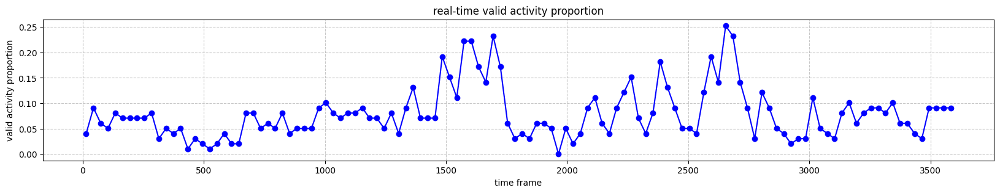


前5个时间段的有效活动比例:
   segment_start  segment_end  valid_proportion
0              0           29          0.040404
1             30           59          0.090909
2             60           89          0.060606
3             90          119          0.050505
4            120          149          0.080808


In [34]:
# 分析神经元活动
segments, validity_matrix, valid_proportions = analyze_neuron_activity_over_time(
    resized_df_signal_neuron, events_df
)
# 打印结果摘要
print(f"总时间段数: {len(segments)}")
print(f"平均有效活动神经元比例: {np.mean(valid_proportions):.4f}")
print(f"最大有效活动神经元比例: {np.max(valid_proportions):.4f}")
print(f"最小有效活动神经元比例: {np.min(valid_proportions):.4f}")

# 可视化结果
plot_valid_activity_proportions(segments, valid_proportions)

# 创建结果数据框便于进一步分析
result_df = pd.DataFrame({
    'segment_start': [seg[0] for seg in segments],
    'segment_end': [seg[1] for seg in segments],
    'valid_proportion': valid_proportions
})
print("\n前5个时间段的有效活动比例:")
print(result_df.head())

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, skew, norm
import warnings
warnings.filterwarnings('ignore')

行为数据分段结果: 120个时间段
合并后的数据长度: 120个时间段
挣扎状态时间段数量: 57
非挣扎状态时间段数量: 63


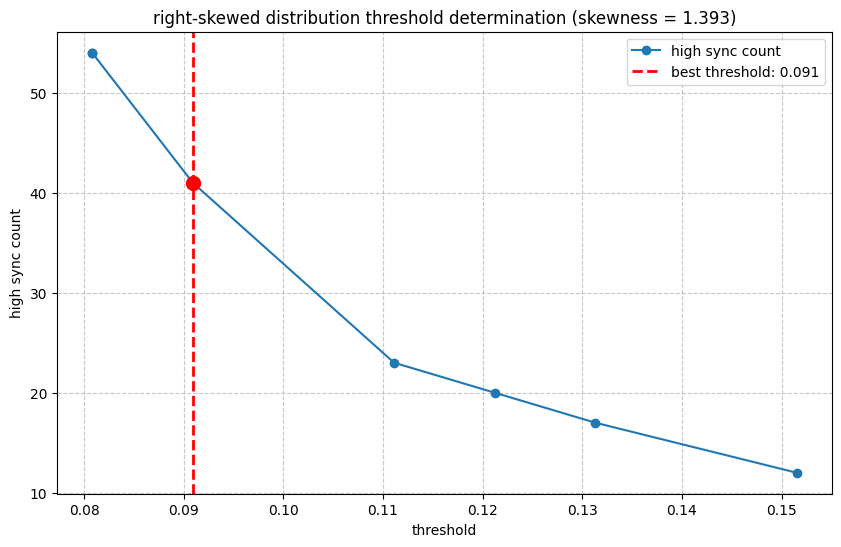


右偏分布分析结果:
- 累积分布率范围: 60% 到 90%
- 最佳阈值位置: 累积分布率 78.0%
- 最佳阈值: 0.091
- 对应高同步时间段数量: 41


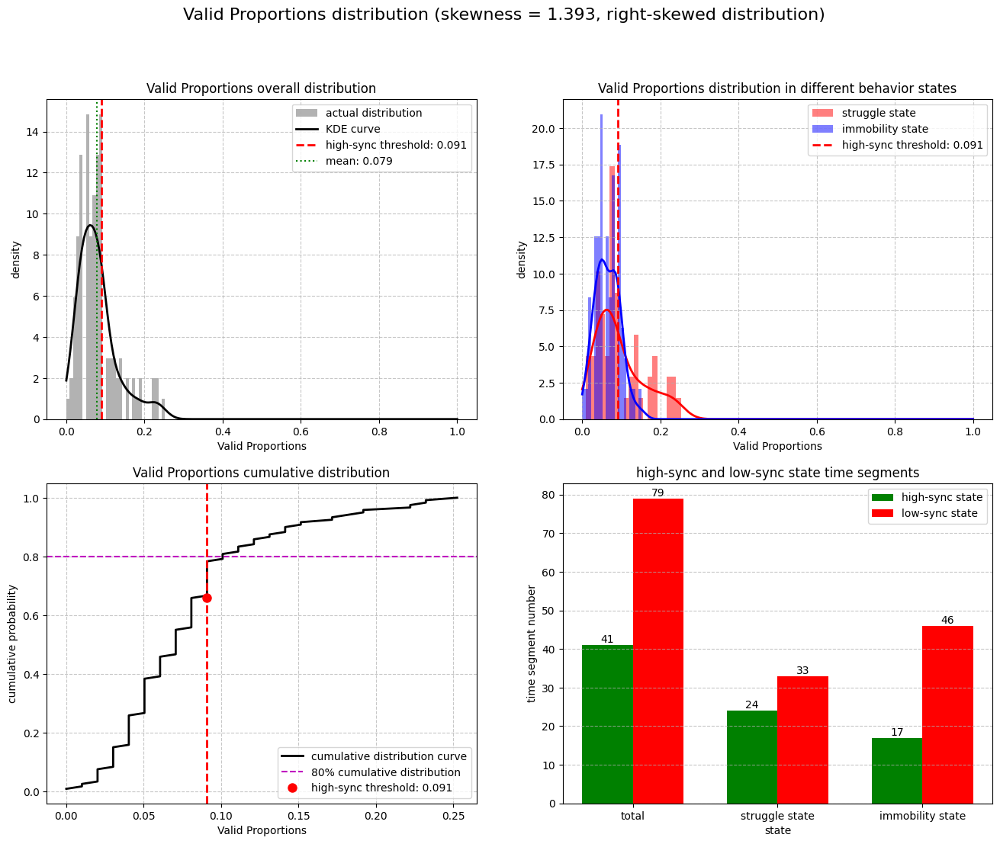


统计信息:
- 偏度: 1.393 (right-skewed distribution)
- 高同步阈值: 0.091
- 总时间段数: 120
  * 高同步时间段数: 41 (34.2%)
  * 低同步时间段数: 79 (65.8%)
- 挣扎状态时间段数: 57
  * 高同步: 24 (42.1% if >0)
  * 低同步: 33 (57.9% if >0)
- 非挣扎状态时间段数: 63
  * 高同步: 17 (27.0% if >0)
  * 低同步: 46 (73.0% if >0)

合并后数据的前5行:
   segment_start  segment_end  segment_duration  avg_value  is_struggle  \
0              0           29                30   1.000000            1   
1             30           59                30   1.000000            1   
2             60           89                30   1.000000            1   
3             90          119                30   1.000000            1   
4            120          149                30   0.133333            0   

   proportion  sync_status  
0    0.040404            0  
1    0.090909            1  
2    0.060606            0  
3    0.050505            0  
4    0.080808            0  


In [36]:
# 函数：将行为数据按3s（30帧）分段并判断挣扎状态
def segment_behaviour_data(behaviour_df, frame_rate=10):
    """
    将行为数据按3秒（30帧）为时间段进行分段，并判断每个时间段的挣扎状态
    
    参数:
    behaviour_df: 行为数据框，行=时间帧，列=行为值（0或1）
    frame_rate: 帧率，默认10帧/秒
    
    返回:
    包含分段信息和挣扎状态的数据框
    """
    # 确保输入是DataFrame格式
    if not isinstance(behaviour_df, pd.DataFrame):
        behaviour_df = pd.DataFrame(behaviour_df, columns=['behaviour'])
    
    total_frames = len(behaviour_df)
    segment_duration_frames = 3 * frame_rate  # 3秒 = 30帧
    
    # 创建分段
    segments = []
    for i in range(0, total_frames, segment_duration_frames):
        segment_start = i
        segment_end = min(i + segment_duration_frames - 1, total_frames - 1)
        
        # 提取当前分段的数据
        segment_data = behaviour_df.iloc[segment_start:segment_end+1].values.flatten()
        
        # 计算平均值并判断挣扎状态
        avg_value = np.mean(segment_data)
        is_struggle = 1 if avg_value >= 0.5 else 0
        
        segments.append({
            'segment_start': segment_start,
            'segment_end': segment_end,
            'segment_duration': segment_end - segment_start + 1,
            'avg_value': avg_value,
            'is_struggle': is_struggle
        })
    
    return pd.DataFrame(segments)

# 函数：对应行为状态和valid_proportions数据
def associate_behaviour_with_proportions(behaviour_segments, valid_proportions_df):
    """
    将行为状态与valid_proportions数据对应起来
    
    参数:
    behaviour_segments: 行为分段数据框
    valid_proportions_df: valid_proportions数据框
    
    返回:
    合并后的数据框
    """
    # 确保两个数据框的长度匹配
    min_len = min(len(behaviour_segments), len(valid_proportions_df))
    
    # 截取匹配长度的数据
    behaviour_subset = behaviour_segments.iloc[:min_len].copy()
    
    # 确保valid_proportions_df是DataFrame格式
    if not isinstance(valid_proportions_df, pd.DataFrame):
        # 处理可能的多维数组情况
        if len(np.shape(valid_proportions_df)) > 1:
            valid_proportions_df = pd.DataFrame(valid_proportions_df.flatten(), columns=['proportion'])
        else:
            valid_proportions_df = pd.DataFrame(valid_proportions_df, columns=['proportion'])
    elif len(valid_proportions_df.columns) > 0 and 'proportion' not in valid_proportions_df.columns:
        # 如果有列但不是proportion，重命名第一列为proportion
        valid_proportions_df = valid_proportions_df.rename(columns={valid_proportions_df.columns[0]: 'proportion'})
    
    valid_subset = valid_proportions_df.iloc[:min_len].copy()
    
    # 合并数据
    combined_df = pd.concat([behaviour_subset.reset_index(drop=True), 
                             valid_subset.reset_index(drop=True)], axis=1)
    
    return combined_df

# 函数：计算偏度并确定高同步阈值
def calculate_skewness_and_threshold(valid_proportions):
    """
    计算valid_proportions的偏度，并根据偏度确定高同步阈值
    
    参数:
    valid_proportions: valid_proportions数据
    
    返回:
    threshold: 高同步阈值
    skew_value: 计算的偏度值
    distribution_type: 分布类型描述
    additional_info: 包含额外分析信息的字典
    """
    # 确保数据是一维数组
    if isinstance(valid_proportions, pd.DataFrame):
        data = valid_proportions['proportion'].values
    else:
        data = np.array(valid_proportions).flatten()
    
    # 计算偏度
    skew_value = skew(data)
    additional_info = {}
    
    # 根据偏度确定阈值
    if skew_value < -0.5:
        # 左偏分布：大部分数据是高同步，使用"峰值 - 0.5 x 标准差"作为阈值
        kde = gaussian_kde(data)
        x_range = np.linspace(min(data), max(data), 1000)
        kde_values = kde(x_range)
        peak_index = np.argmax(kde_values)
        peak_value = x_range[peak_index]
        std_value = np.std(data)
        threshold = peak_value - 0.5 * std_value
        distribution_type = "left-skewed distribution"
        additional_info = {
            "peak_value": peak_value,
            "std_value": std_value
        }
    elif skew_value > 0.5:
        # 右偏分布：大部分数据是低同步，使用肘部图确定最佳阈值
        sorted_data = np.sort(data)
        n = len(sorted_data)
        
        # 生成累积分布率范围（60%到90%，每隔3%）
        cum_percentages = np.arange(0.6, 0.91, 0.03)  # 0.6, 0.63, 0.66, ..., 0.9
        thresholds = []
        high_sync_counts = []
        
        for p in cum_percentages:
            # 计算当前累积分布率对应的索引
            index = int(n * p)
            # 确保索引在有效范围内
            index = min(index, n - 1)
            # 获取对应的阈值
            current_threshold = sorted_data[index]
            thresholds.append(current_threshold)
            # 计算当前阈值下的高同步时间段数量
            high_sync_count = (data >= current_threshold).sum()
            high_sync_counts.append(high_sync_count)
        
        # 计算差值序列，用于寻找突变点
        differences = np.diff(high_sync_counts)
        
        # 寻找肘部点（突变值）
        # 方法1：寻找最大差值对应的位置
        max_diff_idx = np.argmax(np.abs(differences))
        
        # 方法2：寻找曲率最大的点（作为备选）
        # 计算二阶差分来估计曲率
        if len(differences) >= 2:
            second_diff = np.diff(differences)
            if len(second_diff) > 0:
                max_curvature_idx = np.argmax(np.abs(second_diff))
                # 综合两种方法，优先选择方法1
                selected_idx = max_diff_idx if max_diff_idx <= len(thresholds) - 1 else max_curvature_idx
            else:
                selected_idx = max_diff_idx
        else:
            selected_idx = max_diff_idx
        
        # 确保选择的索引在有效范围内
        selected_idx = min(selected_idx, len(thresholds) - 1)
        
        # 选择最终阈值
        threshold = thresholds[selected_idx]
        distribution_type = "right-skewed distribution"
        
        # 保存额外信息用于可视化
        additional_info = {
            "cum_percentages": cum_percentages,
            "thresholds": thresholds,
            "high_sync_counts": high_sync_counts,
            "elbow_idx": selected_idx,
            "elbow_threshold": threshold,
            "elbow_percentage": cum_percentages[selected_idx]
        }
        
        # 绘制肘部图
        plt.figure(figsize=(10, 6))
        plt.plot(thresholds, high_sync_counts, 'o-', label='high sync count')
        plt.axvline(x=threshold, color='r', linestyle='--', linewidth=2, 
                   label=f'best threshold: {threshold:.3f}')
        plt.plot(thresholds[selected_idx], high_sync_counts[selected_idx], 'ro', markersize=10)
        plt.title(f'right-skewed distribution threshold determination (skewness = {skew_value:.3f})')
        plt.xlabel('threshold')
        plt.ylabel('high sync count')
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend()
        # plt.tight_layout()
        plt.savefig(path_save + r'\right-skewed distribution threshold determination.pdf', format='pdf', dpi=300, bbox_inches='tight')
        plt.savefig(path_save + r'\right-skewed distribution threshold determination.png', format='png', dpi=300, bbox_inches='tight')

        plt.show()
        
        print(f"\n右偏分布分析结果:")
        print(f"- 累积分布率范围: 60% 到 90%")
        print(f"- 最佳阈值位置: 累积分布率 {cum_percentages[selected_idx]:.1%}")
        print(f"- 最佳阈值: {threshold:.3f}")
        print(f"- 对应高同步时间段数量: {high_sync_counts[selected_idx]}")
    else:
        # 接近正态分布：使用均值作为阈值
        threshold = np.mean(data)
        distribution_type = "most likely normal distribution"
        additional_info = {
            "mean_value": threshold
        }
    
    # 确保阈值在合理范围内
    threshold = max(0, min(1, threshold))
    
    return threshold, skew_value, distribution_type, additional_info


# 在combined_df中新增同步状态列
def add_sync_status_column(combined_df, threshold):
    """
    在combined_df中新增一列，将同步率高于阈值的赋值为1，低于阈值的赋值为0
    
    参数:
    combined_df: 合并后的数据框
    threshold: 高同步阈值
    
    返回:
    添加了同步状态列的数据框
    """
    # 创建新列'sync_status'
    combined_df['sync_status'] = (combined_df['proportion'] >= threshold).astype(int)
    
    # 统计高同步和低同步的数量
    high_sync_count = combined_df['sync_status'].sum()
    low_sync_count = len(combined_df) - high_sync_count
    
    # print(f"同步状态统计:")
    # print(f"- 高同步时间段数量 (sync_status=1): {high_sync_count} ({high_sync_count/len(combined_df)*100:.1f}%)")
    # print(f"- 低同步时间段数量 (sync_status=0): {low_sync_count} ({low_sync_count/len(combined_df)*100:.1f}%)")
    
    return combined_df

# 函数：绘制valid_proportions的分布曲线（整体、挣扎和非挣扎状态）
def plot_comprehensive_distributions(combined_df, threshold, skew_value, distribution_type):
    """
    绘制valid_proportions的整体分布、挣扎状态和非挣扎状态下的分布曲线，
    并标记高同步和低同步的划分阈值
    """
    # 提取数据
    all_data = combined_df['proportion'].values
    struggle_data = combined_df[combined_df['is_struggle'] == 1]['proportion'].values
    non_struggle_data = combined_df[combined_df['is_struggle'] == 0]['proportion'].values
    
    # 创建图形
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(f'Valid Proportions distribution (skewness = {skew_value:.3f}, {distribution_type})', fontsize=16)
    
    # 1. 整体分布图（左上角）
    ax1 = axes[0, 0]
    ax1.hist(all_data, bins=30, alpha=0.6, color='gray', density=True, label='actual distribution')
    
    # 添加KDE曲线
    kde_all = gaussian_kde(all_data)
    x_all = np.linspace(0, 1, 200)
    y_all = kde_all(x_all)
    ax1.plot(x_all, y_all, 'k-', linewidth=2, label='KDE curve')
    
    # 标记阈值
    ax1.axvline(x=threshold, color='r', linestyle='--', linewidth=2, 
                label=f'high-sync threshold: {threshold:.3f}')
    
    # 标记统计信息
    ax1.axvline(x=np.mean(all_data), color='g', linestyle=':', linewidth=1.5, 
                label=f'mean: {np.mean(all_data):.3f}')
    
    ax1.set_title('Valid Proportions overall distribution')
    ax1.set_xlabel('Valid Proportions')
    ax1.set_ylabel('density')
    ax1.grid(True, linestyle='--', alpha=0.7)
    ax1.legend()
    
    # 2. 挣扎和非挣扎状态的分布图（右上角）
    ax2 = axes[0, 1]
    
    # 绘制挣扎状态分布
    if len(struggle_data) > 0:
        ax2.hist(struggle_data, bins=20, alpha=0.5, color='r', density=True, label='struggle state')
        kde_struggle = gaussian_kde(struggle_data)
        x_struggle = np.linspace(0, 1, 200)
        y_struggle = kde_struggle(x_struggle)
        ax2.plot(x_struggle, y_struggle, 'r-', linewidth=2)
    
    # 绘制非挣扎状态分布
    if len(non_struggle_data) > 0:
        ax2.hist(non_struggle_data, bins=20, alpha=0.5, color='b', density=True, label='immobility state')
        kde_non_struggle = gaussian_kde(non_struggle_data)
        x_non_struggle = np.linspace(0, 1, 200)
        y_non_struggle = kde_non_struggle(x_non_struggle)
        ax2.plot(x_non_struggle, y_non_struggle, 'b-', linewidth=2)
    
    # 标记阈值
    ax2.axvline(x=threshold, color='r', linestyle='--', linewidth=2, 
                label=f'high-sync threshold: {threshold:.3f}')
    
    ax2.set_title('Valid Proportions distribution in different behavior states')
    ax2.set_xlabel('Valid Proportions')
    ax2.set_ylabel('density')
    ax2.grid(True, linestyle='--', alpha=0.7)
    ax2.legend()
    
    # 3. 累积分布曲线（左下角）
    ax3 = axes[1, 0]
    
    # 计算累积分布
    sorted_data = np.sort(all_data)
    cumulative = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    
    ax3.plot(sorted_data, cumulative, 'k-', linewidth=2, label='cumulative distribution curve')
    ax3.axhline(y=0.8, color='m', linestyle='--', linewidth=1.5, label=r'80% cumulative distribution')
    
    # 标记阈值位置
    if len(sorted_data) > 0:
        # 找到阈值对应的累积概率
        threshold_index = np.searchsorted(sorted_data, threshold)
        if threshold_index < len(sorted_data):
            cum_prob = threshold_index / len(sorted_data)
            ax3.axvline(x=threshold, color='r', linestyle='--', linewidth=2)
            ax3.plot(threshold, cum_prob, 'ro', markersize=8, 
                     label=f'high-sync threshold: {threshold:.3f}')
    
    ax3.set_title('Valid Proportions cumulative distribution')
    ax3.set_xlabel('Valid Proportions')
    ax3.set_ylabel('cumulative probability')
    ax3.grid(True, linestyle='--', alpha=0.7)
    ax3.legend()
    
    # 4. 高同步和低同步时间段统计（右下角）
    ax4 = axes[1, 1]
    
    # 统计高同步和低同步时间段数量
    high_sync_all = (all_data >= threshold).sum()
    low_sync_all = len(all_data) - high_sync_all
    
    # 统计挣扎状态下的高同步和低同步
    if len(struggle_data) > 0:
        high_sync_struggle = (struggle_data >= threshold).sum()
        low_sync_struggle = len(struggle_data) - high_sync_struggle
    else:
        high_sync_struggle = 0
        low_sync_struggle = 0
    
    # 统计非挣扎状态下的高同步和低同步
    if len(non_struggle_data) > 0:
        high_sync_non_struggle = (non_struggle_data >= threshold).sum()
        low_sync_non_struggle = len(non_struggle_data) - high_sync_non_struggle
    else:
        high_sync_non_struggle = 0
        low_sync_non_struggle = 0
    
    # 创建分组条形图
    categories = ['total', 'struggle state', 'immobility state']
    high_sync_counts = [high_sync_all, high_sync_struggle, high_sync_non_struggle]
    low_sync_counts = [low_sync_all, low_sync_struggle, low_sync_non_struggle]
    
    x = np.arange(len(categories))
    width = 0.35
    
    ax4.bar(x - width/2, high_sync_counts, width, label='high-sync state', color='g')
    ax4.bar(x + width/2, low_sync_counts, width, label='low-sync state', color='r')
    
    # 添加数值标签
    for i, (high, low) in enumerate(zip(high_sync_counts, low_sync_counts)):
        ax4.text(i - width/2, high, f'{high}', ha='center', va='bottom')
        ax4.text(i + width/2, low, f'{low}', ha='center', va='bottom')
    
    ax4.set_title('high-sync and low-sync state time segments')
    ax4.set_xlabel('state')
    ax4.set_ylabel('time segment number')
    ax4.set_xticks(x)
    ax4.set_xticklabels(categories)
    ax4.grid(True, linestyle='--', alpha=0.7, axis='y')
    ax4.legend()
    
    # plt.tight_layout(rect=[0, 0, 1, 0.96])  # 调整布局，为suptitle留出空间
    plt.savefig(path_save + r'\valid activity proportion distribution.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\valid activity proportion distribution.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 输出统计信息
    print(f"\n统计信息:")
    print(f"- 偏度: {skew_value:.3f} ({distribution_type})")
    print(f"- 高同步阈值: {threshold:.3f}")
    print(f"- 总时间段数: {len(all_data)}")
    print(f"  * 高同步时间段数: {high_sync_all} ({high_sync_all/len(all_data)*100:.1f}%)")
    print(f"  * 低同步时间段数: {low_sync_all} ({low_sync_all/len(all_data)*100:.1f}%)")
    print(f"- 挣扎状态时间段数: {len(struggle_data)}")
    print(f"  * 高同步: {high_sync_struggle} ({high_sync_struggle/len(struggle_data)*100:.1f}% if >0)")
    print(f"  * 低同步: {low_sync_struggle} ({low_sync_struggle/len(struggle_data)*100:.1f}% if >0)")
    print(f"- 非挣扎状态时间段数: {len(non_struggle_data)}")
    print(f"  * 高同步: {high_sync_non_struggle} ({high_sync_non_struggle/len(non_struggle_data)*100:.1f}% if >0)")
    print(f"  * 低同步: {low_sync_non_struggle} ({low_sync_non_struggle/len(non_struggle_data)*100:.1f}% if >0)")

# 主函数：分析行为数据和有效神经元比例
def analyze_behaviour_and_proportions(behaviour_im_with_head, valid_proportions):
    """
    分析行为数据和有效神经元比例的关系，包括偏度计算、阈值确定和分布分析
    """
    # 分段处理行为数据
    behaviour_segments = segment_behaviour_data(behaviour_im_with_head)
    print(f"行为数据分段结果: {len(behaviour_segments)}个时间段")
    
    # 对应行为状态和有效神经元比例数据
    combined_df = associate_behaviour_with_proportions(behaviour_segments, valid_proportions)
    print(f"合并后的数据长度: {len(combined_df)}个时间段")
    
    # 统计挣扎和非挣扎状态的数量
    struggle_count = combined_df['is_struggle'].sum()
    non_struggle_count = len(combined_df) - struggle_count
    print(f"挣扎状态时间段数量: {struggle_count}")
    print(f"非挣扎状态时间段数量: {non_struggle_count}")
    
    # 计算偏度并确定阈值
    threshold, skew_value, distribution_type, additional_info = calculate_skewness_and_threshold(combined_df['proportion'])

    # 在combined_df中新增同步状态列
    combined_df = add_sync_status_column(combined_df, threshold)
    
    # 绘制综合分布图
    plot_comprehensive_distributions(combined_df, threshold, skew_value, distribution_type)
    
    return combined_df, threshold, skew_value, distribution_type

# # 使用示例
# if 'behaviour_im_with_head' in locals() and 'valid_proportions' in locals():
# 分析行为数据和有效神经元比例
combined_df, threshold, skew_value, distribution_type = analyze_behaviour_and_proportions(behaviour_im_with_head, valid_proportions)

# 显示合并后的数据摘要
print("\n合并后数据的前5行:")
print(combined_df.head())
    
    # # 保存结果到CSV文件
    # combined_df.to_csv('behaviour_proportion_analysis.csv', index=False)
    # print("\n分析结果已保存到: behaviour_proportion_analysis.csv")
# else:
#     print("请确保behaviour_im_with_head和valid_proportions变量已在您的环境中定义")
    
#     # 生成示例数据用于演示（当真实数据不可用时）
#     print("\n生成示例数据用于演示...")
    
#     # 创建示例行为数据（3579行，0和1随机分布）
#     np.random.seed(42)  # 设置随机种子以确保结果可复现
#     behaviour_im_with_head = pd.DataFrame(np.random.randint(0, 2, size=(3579, 1)), columns=['behaviour'])
    
#     # 创建示例valid_proportions数据（120行，0-1之间的随机数，有一定的偏斜）
#     # 生成略微右偏的数据
#     valid_proportions = np.random.beta(2, 5, size=120)  # beta分布，形状参数会影响偏度
#     valid_proportions = pd.DataFrame(valid_proportions, columns=['proportion'])
    
#     print("示例数据生成完成，正在进行分析...")
#     combined_df, threshold, skew_value, distribution_type = analyze_behaviour_and_proportions(behaviour_im_with_head, valid_proportions)
    
#     print("\n示例数据的分析结果:")
#     print(f"- 偏度: {skew_value:.3f} ({distribution_type})")
#     print(f"- 高同步阈值: {threshold:.3f}")

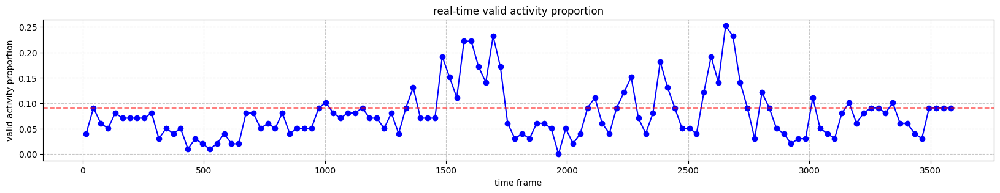

In [37]:
plot_valid_activity_proportions(segments, valid_proportions,threshold=threshold)

In [38]:
def segment_behaviour_data(behaviour_df, frame_rate=10):
    """
    将行为数据按3秒（30帧）为时间段进行分段，并判断每个时间段的挣扎状态
    
    参数:
    behaviour_df: 行为数据框，行=时间帧，列=行为值（0或1）
    frame_rate: 帧率，默认10帧/秒
    
    返回:
    包含分段信息和挣扎状态的数据框
    """
    total_frames = len(behaviour_df)
    segment_duration_frames = 3 * frame_rate  # 3秒 = 30帧
    
    # 创建分段
    segments = []
    for i in range(0, total_frames, segment_duration_frames):
        segment_start = i
        segment_end = min(i + segment_duration_frames - 1, total_frames - 1)
        
        # 提取当前分段的数据
        segment_data = behaviour_df.iloc[segment_start:segment_end+1].values.flatten()
        
        # 计算平均值并判断挣扎状态
        avg_value = np.mean(segment_data)
        is_struggle = 1 if avg_value >= 0.5 else 0
        
        segments.append({
            'segment_start': segment_start,
            'segment_end': segment_end,
            'segment_duration': segment_end - segment_start + 1,
            'avg_value': avg_value,
            'is_struggle': is_struggle
        })
    
    return pd.DataFrame(segments)

In [39]:
# 分段处理行为数据
behaviour_segments = segment_behaviour_data(behaviour_im_with_head)

In [40]:
df_coverage_updated = coverage_df_.copy()  # 创建副本以避免修改原始数据
df_coverage_updated['coverage_type'] = df_coverage_updated['coverage_type'].replace({
    '无覆盖': '0',
    '部分覆盖': '1',
    '完全覆盖': '2'
})
df_coverage_updated.rename(columns={'window_start_frame': 'seg_start_frame', 'window_end_frame': 'seg_end_frame'}, inplace=True)

In [41]:
behaviour_segments.rename(columns={'segment_start': 'seg_start_frame'}, inplace=True)

# 首先，基于共同的键合并三个DataFrame
aligned_df = pd.merge(df_coverage_updated, assigned_segments_df_events2, 
                     on=['neuron_id', 'seg_start_frame'], how='inner')
aligned_df = pd.merge(aligned_df, assigned_segments_df_events3, 
                     on=['neuron_id', 'seg_start_frame'], how='inner')
aligned_df = pd.merge(aligned_df, behaviour_segments, 
                     on=['seg_start_frame'], how='inner')

# 定义函数将类别标签转换为one-hot编码
def create_one_hot_columns(df, source_col, prefix, categories=['None', '0', '1', '2']):
    """将源列中的类别转换为三个one-hot编码列"""
    # 初始化结果列
    df[f'{prefix}_1'] = 0
    df[f'{prefix}_2'] = 0
    df[f'{prefix}_3'] = 0
    
    # 根据类别设置对应的值
    if 'None' in categories:
        df.loc[df[source_col] == 'None', [f'{prefix}_1', f'{prefix}_2', f'{prefix}_3']] = 0
    if '0' in categories:
        df.loc[df[source_col] == '0', [f'{prefix}_1', f'{prefix}_2', f'{prefix}_3']] = [1, 0, 0]
    if '1' in categories:
        df.loc[df[source_col] == '1', [f'{prefix}_1', f'{prefix}_2', f'{prefix}_3']] = [0, 1, 0]
    if '2' in categories:
        df.loc[df[source_col] == '2', [f'{prefix}_1', f'{prefix}_2', f'{prefix}_3']] = [0, 0, 1]
    
    return df

# 创建coverage相关的三个特征列
aligned_df = create_one_hot_columns(aligned_df, 'coverage_type', 'coverage')

# 创建intensity相关的三个特征列
aligned_df = create_one_hot_columns(aligned_df, 'cluster_label_str', 'intensity')

# 创建duration相关的三个特征列
aligned_df = create_one_hot_columns(aligned_df, 'kmeans_cluster_str', 'duration')

# 查看结果的前几行和新创建的列
display(aligned_df[['neuron_id', 'seg_start_frame', 'seg_end_frame', 
                   'coverage_1', 'coverage_2', 'coverage_3',
                   'intensity_1', 'intensity_2', 'intensity_3',
                   'duration_1', 'duration_2', 'duration_3','is_struggle']].head())

# 验证编码是否正确
print("\n验证coverage_type的编码情况：")
print(aligned_df.groupby('coverage_type')[['coverage_1', 'coverage_2', 'coverage_3']].max())

print("\n验证cluster_label_str的编码情况：")
print(aligned_df.groupby('cluster_label_str')[['intensity_1', 'intensity_2', 'intensity_3']].max())

print("\n验证kmeans_cluster_str的编码情况：")
print(aligned_df.groupby('kmeans_cluster_str')[['duration_1', 'duration_2', 'duration_3']].max())

# 如果需要只保留新创建的特征和关键列
result_df = aligned_df[['neuron_id', 'seg_start_frame', 'seg_end_frame', 
                       'coverage_1', 'coverage_2', 'coverage_3',
                       'intensity_1', 'intensity_2', 'intensity_3',
                       'duration_1', 'duration_2', 'duration_3','is_struggle']].copy()

# 保存结果到CSV文件
# result_df.to_csv('aligned_features_with_one_hot_encoding.csv', index=False)
# print("\n结果已保存到 'aligned_features_with_one_hot_encoding.csv'")


single_neuron_features = result_df.copy()

,neuron_id,seg_start_frame,seg_end_frame,coverage_1,coverage_2,coverage_3,intensity_1,intensity_2,intensity_3,duration_1,duration_2,duration_3,is_struggle
0,0,0,29,0,1,0,1,0,0,1,0,0,1
1,0,30,59,0,0,1,0,1,0,1,0,0,1
2,0,60,89,0,1,0,0,1,0,1,0,0,1
3,0,90,119,0,1,0,0,0,0,0,0,0,1
4,0,120,149,0,1,0,0,0,0,0,0,0,0



验证coverage_type的编码情况：
               coverage_1  coverage_2  coverage_3
coverage_type                                    
0                       1           0           0
1                       0           1           0
2                       0           0           1
None                    0           0           0

验证cluster_label_str的编码情况：
                   intensity_1  intensity_2  intensity_3
cluster_label_str                                       
0                            1            0            0
1                            0            1            0
2                            0            0            1
None                         0            0            0

验证kmeans_cluster_str的编码情况：
                    duration_1  duration_2  duration_3
kmeans_cluster_str                                    
0                            1           0           0
1                            0           1           0
2                            0           0           1
None 

In [42]:
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

In [43]:
# 神经元特征提取与层次聚类分析

# 1. 根据'neuron_id'和'is_struggle'统计9种特征的比例
def extract_neuron_features(df):
    """提取每个神经元的18维特征向量（9种特征在两种状态下的比例）"""
    # 定义特征列
    feature_columns = ['coverage_1', 'coverage_2', 'coverage_3', 
                       'intensity_1', 'intensity_2', 'intensity_3', 
                       'duration_1', 'duration_2', 'duration_3']
    
    # 初始化结果DataFrame
    neuron_ids = df['neuron_id'].unique()
    result_columns = []
    
    # 创建结果列名：特征名_状态（0表示静止，1表示挣扎）
    for feature in feature_columns:
        result_columns.append(f'{feature}_rest')  # 静止状态下的比例
        result_columns.append(f'{feature}_struggle')  # 挣扎状态下的比例
    
    # 创建结果DataFrame
    neuron_features = pd.DataFrame(index=neuron_ids, columns=result_columns)
    
    # 对每个神经元进行统计
    for neuron_id in neuron_ids:
        # 获取当前神经元的数据
        neuron_data = df[df['neuron_id'] == neuron_id]
        
        # 统计静止状态（is_struggle=0）下的特征比例
        rest_data = neuron_data[neuron_data['is_struggle'] == 0]
        if len(rest_data) > 0:
            rest_proportions = rest_data[feature_columns].mean()
        else:
            rest_proportions = pd.Series([0] * len(feature_columns), index=feature_columns)
        
        # 统计挣扎状态（is_struggle=1）下的特征比例
        struggle_data = neuron_data[neuron_data['is_struggle'] == 1]
        if len(struggle_data) > 0:
            struggle_proportions = struggle_data[feature_columns].mean()
        else:
            struggle_proportions = pd.Series([0] * len(feature_columns), index=feature_columns)
        
        # 填充结果DataFrame
        for feature in feature_columns:
            neuron_features.loc[neuron_id, f'{feature}_rest'] = rest_proportions[feature]
            neuron_features.loc[neuron_id, f'{feature}_struggle'] = struggle_proportions[feature]
    
    # 重置索引，使neuron_id成为列
    neuron_features = neuron_features.reset_index().rename(columns={'index': 'neuron_id'})
    
    return neuron_features

# 执行特征提取
neuron_features_df = extract_neuron_features(result_df)
print(f"特征提取完成，共{len(neuron_features_df)}个神经元，每个神经元{len(neuron_features_df.columns) - 1}维特征")

# 查看前几行特征数据
display(neuron_features_df.head())

# 2. 准备层次聚类的数据
# 提取特征矩阵，排除neuron_id列
X = neuron_features_df.drop('neuron_id', axis=1).values

# 数据标准化（可选但推荐）
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

特征提取完成，共99个神经元，每个神经元18维特征


,neuron_id,coverage_1_rest,coverage_1_struggle,coverage_2_rest,coverage_2_struggle,coverage_3_rest,coverage_3_struggle,intensity_1_rest,intensity_1_struggle,intensity_2_rest,intensity_2_struggle,intensity_3_rest,intensity_3_struggle,duration_1_rest,duration_1_struggle,duration_2_rest,duration_2_struggle,duration_3_rest,duration_3_struggle
0,0,0.0,0.052632,0.047619,0.280702,0.047619,0.087719,0.0,0.105263,0.047619,0.052632,0.015873,0.070175,0.063492,0.192982,0.0,0.0,0.0,0.035088
1,1,0.0,0.0,0.031746,0.122807,0.0,0.157895,0.015873,0.035088,0.0,0.017544,0.0,0.157895,0.015873,0.052632,0.0,0.0,0.0,0.157895
2,2,0.015873,0.017544,0.079365,0.017544,0.079365,0.052632,0.015873,0.0,0.031746,0.035088,0.095238,0.017544,0.047619,0.0,0.0,0.0,0.095238,0.052632
3,3,0.0,0.017544,0.047619,0.105263,0.015873,0.0,0.031746,0.052632,0.0,0.0,0.015873,0.0,0.031746,0.052632,0.015873,0.0,0.0,0.0
4,4,0.015873,0.0,0.063492,0.035088,0.079365,0.017544,0.047619,0.017544,0.031746,0.0,0.015873,0.017544,0.047619,0.017544,0.0,0.0,0.047619,0.017544


k=3, 轮廓系数=0.1552
k=4, 轮廓系数=0.1700
k=5, 轮廓系数=0.1558
k=6, 轮廓系数=0.1605


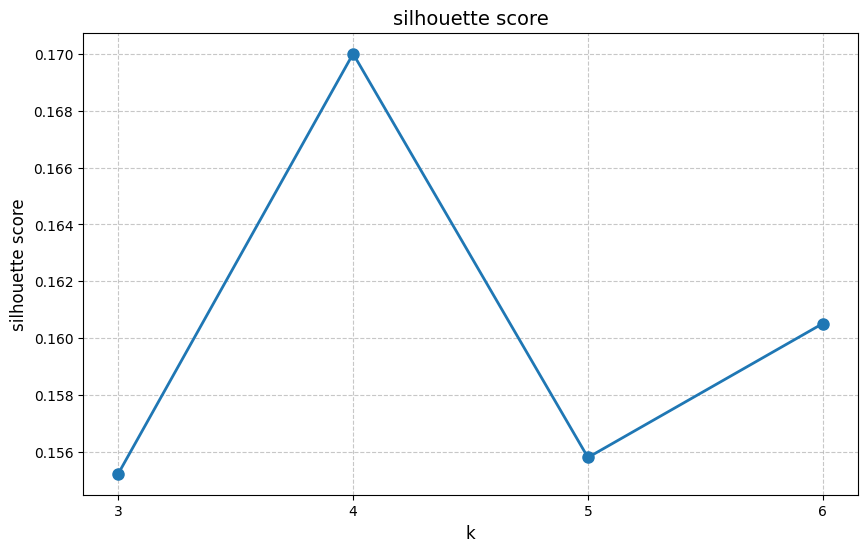

根据轮廓系数，最优聚类数为: 4


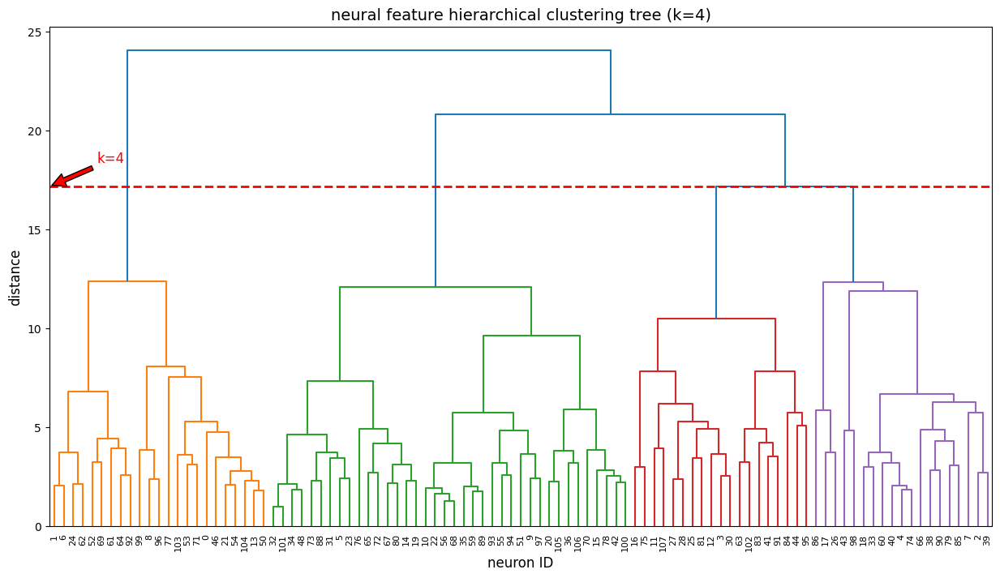

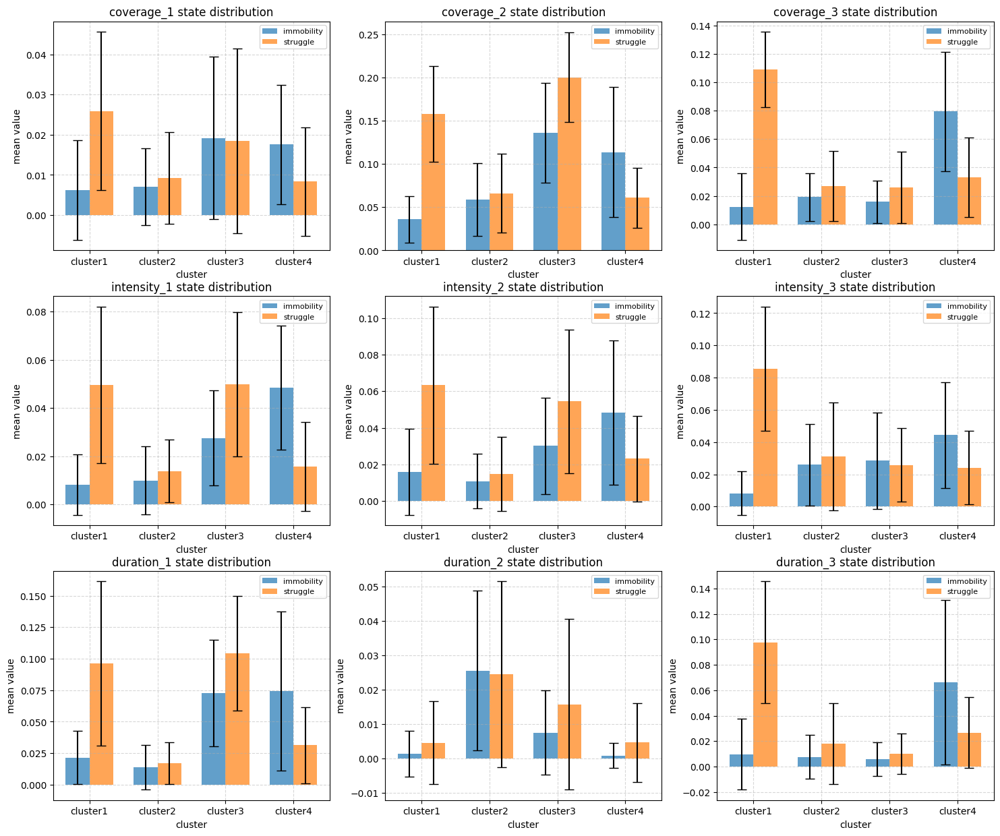


聚类结果统计：
总神经元数: 99
最优聚类数: 4

各聚类的神经元数量：
聚类1: 23个神经元 (23.23%)
聚类2: 38个神经元 (38.38%)
聚类3: 19个神经元 (19.19%)
聚类4: 19个神经元 (19.19%)


In [44]:
# 3. 执行层次聚类并计算轮廓系数以确定最优类数
def perform_hierarchical_clustering(X, min_k=2, max_k=8, method='ward'):
    """执行层次聚类并计算不同k值的轮廓系数"""
    # 执行层次聚类
    Z = linkage(X, method=method)
    
    # 计算不同k值的轮廓系数
    silhouette_scores = []
    cluster_labels_dict = {}
    
    for k in range(min_k, max_k + 1):
        # 获取k个聚类的标签
        labels = fcluster(Z, k, criterion='maxclust')
        cluster_labels_dict[k] = labels
        
        # 计算轮廓系数（如果k=1则无法计算）
        if k > 1:
            score = silhouette_score(X, labels)
            silhouette_scores.append((k, score))
            print(f'k={k}, 轮廓系数={score:.4f}')
    
    # 转换为DataFrame以便可视化
    silhouette_df = pd.DataFrame(silhouette_scores, columns=['k', 'silhouette_score'])
    
    return Z, silhouette_df, cluster_labels_dict

# 执行层次聚类
Z, silhouette_df, cluster_labels_dict = perform_hierarchical_clustering(X_scaled, min_k=3, max_k=6)

# 可视化轮廓系数
def plot_silhouette_scores(silhouette_df):
    """绘制不同k值的轮廓系数"""
    plt.figure(figsize=(10, 6))
    plt.plot(silhouette_df['k'], silhouette_df['silhouette_score'], 'o-', linewidth=2, markersize=8)
    plt.title('silhouette score', fontsize=14)
    plt.xlabel('k', fontsize=12)
    plt.ylabel('silhouette score', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(silhouette_df['k'])
    
    # 标记最优k值
    best_k = silhouette_df.loc[silhouette_df['silhouette_score'].idxmax(), 'k']
    # best_score = silhouette_df['silhouette_score'].max()
    # plt.annotate(f'the best k={best_k}\nscore={best_score:.4f}', 
    #              xy=(best_k, best_score), 
    #              xytext=(best_k + 0.5, best_score - 0.05),
    #              arrowprops=dict(facecolor='red', shrink=0.05, width=1.5),
    #              fontsize=10, ha='center')
    
    # plt.tight_layout()
    # plt.tight_layout()
    plt.savefig(path_save + r'\total hierarchial cluster k elbow.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\total hierarchial cluster k elbow.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return best_k

# 绘制轮廓系数并获取最优k值
best_k = plot_silhouette_scores(silhouette_df)
best_k = 4
print(f"根据轮廓系数，最优聚类数为: {best_k}")

# 4. 绘制层次聚类的树状图
def plot_dendrogram(Z, neuron_ids, best_k):
    """绘制层次聚类的树状图，并根据最优k值进行切割"""
    plt.figure(figsize=(15, 8))
    
    # 绘制树状图
    dendro = dendrogram(Z, labels=neuron_ids, leaf_rotation=90, leaf_font_size=8)
    
    # 根据最优k值添加切割线
    max_distance = max(Z[:, 2])
    plt.axhline(y=Z[-best_k + 1, 2], color='r', linestyle='--', linewidth=2)
    plt.annotate(f'k={best_k}', xy=(0, Z[-best_k + 1, 2]), 
                 xytext=(50, Z[-best_k + 1, 2] + max_distance * 0.05),
                 arrowprops=dict(facecolor='red', shrink=0.05),
                 fontsize=12, color='red')
                 
    
    plt.title(f'neural feature hierarchical clustering tree (k={best_k})', fontsize=14)
    plt.xlabel('neuron ID', fontsize=12)
    plt.ylabel('distance', fontsize=12)
    # plt.tight_layout()
    plt.savefig(path_save + r'\total hierarchial cluster tree.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\total hierarchial cluster tree.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

# 获取最优k值对应的聚类标签
best_labels = cluster_labels_dict[best_k]

# 将聚类标签添加到特征数据中
neuron_features_df['cluster'] = best_labels

# 绘制树状图
plot_dendrogram(Z, neuron_features_df['neuron_id'].values, best_k)

# 5. 统计每类中9种特征的分布情况
def analyze_cluster_features(neuron_features_df):
    """分析每个聚类中9种特征在两种状态下的分布情况"""
    # 定义原始特征列
    original_features = ['coverage_1', 'coverage_2', 'coverage_3', 
                         'intensity_1', 'intensity_2', 'intensity_3', 
                         'duration_1', 'duration_2', 'duration_3']
    
    # 初始化结果字典
    cluster_analysis = {}
    
    # 获取所有聚类
    clusters = sorted(neuron_features_df['cluster'].unique())
    
    for cluster in clusters:
        # 获取当前聚类的数据
        cluster_data = neuron_features_df[neuron_features_df['cluster'] == cluster]
        
        # 计算每个特征在两种状态下的平均值
        cluster_stats = {}
        for feature in original_features:
            # 静止状态下的平均值
            rest_mean = cluster_data[f'{feature}_rest'].mean()
            # 挣扎状态下的平均值
            struggle_mean = cluster_data[f'{feature}_struggle'].mean()
            
            cluster_stats[feature] = {
                'rest_mean': rest_mean,
                'struggle_mean': struggle_mean,
                'rest_std': cluster_data[f'{feature}_rest'].std(),
                'struggle_std': cluster_data[f'{feature}_struggle'].std(),
                'neuron_count': len(cluster_data)
            }
        
        cluster_analysis[cluster] = cluster_stats
    
    # 转换为DataFrame以便更好地展示
    analysis_results = []
    for cluster in clusters:
        for feature in original_features:
            stats = cluster_analysis[cluster][feature]
            analysis_results.append({
                'cluster': cluster,
                'feature': feature,
                'rest_mean': stats['rest_mean'],
                'rest_std': stats['rest_std'],
                'struggle_mean': stats['struggle_mean'],
                'struggle_std': stats['struggle_std'],
                'neuron_count': stats['neuron_count']
            })
    
    analysis_df = pd.DataFrame(analysis_results)
    
    return analysis_df, cluster_analysis

# 执行聚类特征分析
analysis_df, cluster_analysis = analyze_cluster_features(neuron_features_df)

# 可视化每个聚类的特征分布
def visualize_cluster_features(analysis_df):
    """可视化每个聚类中9种特征在两种状态下的分布"""
    # 获取特征列表和聚类列表
    features = analysis_df['feature'].unique()
    clusters = sorted(analysis_df['cluster'].unique())
    
    # 为每个特征创建一个子图
    fig, axes = plt.subplots(3, 3, figsize=(18, 15))
    axes = axes.flatten()
    
    for i, feature in enumerate(features):
        # 获取当前特征的数据
        feature_data = analysis_df[analysis_df['feature'] == feature]
        
        # 创建柱状图
        x = np.arange(len(clusters))
        width = 0.35
        
        axes[i].bar(x - width/2, feature_data['rest_mean'], width, label='immobility', 
                   yerr=feature_data['rest_std'], capsize=5, alpha=0.7)
        axes[i].bar(x + width/2, feature_data['struggle_mean'], width, label='struggle', 
                   yerr=feature_data['struggle_std'], capsize=5, alpha=0.7)
        
        # 设置子图属性
        axes[i].set_title(f'{feature} state distribution', fontsize=12)
        axes[i].set_xlabel('cluster', fontsize=10)
        axes[i].set_ylabel('mean value', fontsize=10)
        axes[i].set_xticks(x)
        axes[i].set_xticklabels([f'cluster{cluster}' for cluster in clusters])
        axes[i].legend(fontsize=8)
        axes[i].grid(True, linestyle='--', alpha=0.5)
    
    # plt.tight_layout()
    plt.savefig(path_save + r'\nine features distribution in two states.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\nine features distribution in two states.png', format='png', dpi=300, bbox_inches='tight')

    plt.show()
    
    # 创建热图展示每个聚类的特征模式
# def create_feature_heatmap(analysis_df):
#     """创建热图展示每个聚类的特征模式"""
#     # 为静止状态和挣扎状态分别创建热图
#     for state in ['rest', 'struggle']:
#         # 重塑数据为热图格式
#         pivot_data = analysis_df.pivot(index='cluster', columns='feature', 
#                                       values=f'{state}_mean')
        
#         # 创建热图
#         plt.figure(figsize=(12, 8))
#         sns.heatmap(pivot_data, annot=True, cmap='coolwarm', fmt='.3f', 
#                    linewidths=.5, cbar_kws={'label': 'mean value'})
        
#         plt.title(f'{"immobility" if state == "rest" else "struggle"} state feature pattern of each cluster', fontsize=14)
#         plt.xlabel('feature', fontsize=12)
#         plt.ylabel('cluster', fontsize=12)
#         # plt.tight_layout()
#         plt.show()

# 可视化聚类特征分布
visualize_cluster_features(analysis_df)

# # 创建特征热图
# create_feature_heatmap(analysis_df)

# 6. 输出聚类结果统计
def summarize_clustering_results(neuron_features_df, best_k):
    """总结聚类结果"""
    # 统计每个聚类的神经元数量
    cluster_counts = neuron_features_df['cluster'].value_counts().sort_index()
    
    print("\n聚类结果统计：")
    print(f"总神经元数: {len(neuron_features_df)}")
    print(f"最优聚类数: {best_k}")
    print("\n各聚类的神经元数量：")
    for cluster, count in cluster_counts.items():
        percentage = (count / len(neuron_features_df)) * 100
        print(f'聚类{cluster}: {count}个神经元 ({percentage:.2f}%)')
    
    # # 保存聚类结果
    # result_file = 'neuron_clustering_results.csv'
    # neuron_features_df.to_csv(result_file, index=False)
    # print(f"\n聚类结果已保存到: {result_file}")
    
    # # 保存特征分析结果
    # analysis_file = 'cluster_feature_analysis.csv'
    # analysis_df.to_csv(analysis_file, index=False)
    # print(f"特征分析结果已保存到: {analysis_file}")

# 总结聚类结果
summarize_clustering_results(neuron_features_df, best_k)

In [45]:
# 神经元行为偏向指数计算

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [46]:
# 定义活跃特征和无活动特征
active_feature_pairs = {
    'coverage_1': ['coverage_1_rest', 'coverage_1_struggle'],
    'coverage_2': ['coverage_2_rest', 'coverage_2_struggle'],
    'coverage_3': ['coverage_3_rest', 'coverage_3_struggle'],
    'intensity_1': ['intensity_1_rest', 'intensity_1_struggle'],
    'intensity_2': ['intensity_2_rest', 'intensity_2_struggle'],
    'intensity_3': ['intensity_3_rest', 'intensity_3_struggle'],
    'duration_1': ['duration_1_rest', 'duration_1_struggle'],
    'duration_2': ['duration_2_rest', 'duration_2_struggle'],
    'duration_3': ['duration_3_rest', 'duration_3_struggle']
}

# 计算行为偏向指数函数
def calculate_bias_indices(neuron_features_df):
    """计算每个簇的行为偏向指数（SBI、FBI、WRI）及其簇内标准差"""
    
    # 获取所有簇
    clusters = sorted(neuron_features_df['cluster'].unique())
    
    # 初始化结果列表
    results = []
    
    # 遍历每个簇
    for cluster in clusters:
        # 获取当前簇的数据
        cluster_data = neuron_features_df[neuron_features_df['cluster'] == cluster]
        cluster_size = len(cluster_data)
        
        # 初始化当前簇的结果字典
        cluster_result = {
            'cluster': cluster,
            'neuron_count': cluster_size
        }
        
        # 计算SBI和FBI（每个活跃特征对）
        sbi_values = []  # 存储每个神经元的整体SBI值
        fbi_values = []  # 存储每个神经元的整体FBI值
        
        for feature_name, (rest_col, struggle_col) in active_feature_pairs.items():
            # 计算每个神经元的SBI和FBI
            neuron_sbi = cluster_data[rest_col] - cluster_data[struggle_col]
            neuron_fbi = cluster_data[struggle_col] - cluster_data[rest_col]
            
            # 计算该特征的簇级SBI和FBI
            cluster_result[f'SBI_{feature_name}'] = neuron_sbi.mean()
            cluster_result[f'FBI_{feature_name}'] = neuron_fbi.mean()
            
            # 保存用于计算整体SBI和FBI的值
            sbi_values.extend(neuron_sbi)
            fbi_values.extend(neuron_fbi)
        
        # 将当前簇的结果添加到总结果中
        results.append(cluster_result)
    
    # 转换为DataFrame
    result_df = pd.DataFrame(results)
    
    return result_df

# 执行计算
# if 'neuron_features_df' in globals() or 'neuron_features_df' in locals():
bias_indices_df = calculate_bias_indices(neuron_features_df)

# 显示结果
print("行为偏向指数计算结果:")
display(bias_indices_df)

# # 保存结果到CSV文件
# output_file = r'C:\Users\Admin\Desktop\临时图像\behavioral_bias_indices_detailed.csv'
# bias_indices_df.to_csv(output_file, index=False)
# print(f"\n结果已保存到: {output_file}")
    

行为偏向指数计算结果:


,cluster,neuron_count,SBI_coverage_1,FBI_coverage_1,SBI_coverage_2,FBI_coverage_2,SBI_coverage_3,FBI_coverage_3,SBI_intensity_1,FBI_intensity_1,SBI_intensity_2,FBI_intensity_2,SBI_intensity_3,FBI_intensity_3,SBI_duration_1,FBI_duration_1,SBI_duration_2,FBI_duration_2,SBI_duration_3,FBI_duration_3
0,1,23,-0.019723,0.019723,-0.122008,0.122008,-0.096655,0.096655,-0.041299,0.041299,-0.047437,0.047437,-0.077149,0.077149,-0.074716,0.074716,-0.003196,0.003196,-0.087974,0.087974
1,2,38,-0.002133,0.002133,-0.007123,0.007123,-0.007563,0.007563,-0.003825,0.003825,-0.003913,0.003913,-0.005035,0.005035,-0.003298,0.003298,0.001011,-0.001011,-0.010487,0.010487
2,3,19,0.000747,-0.000747,-0.064196,0.064196,-0.009981,0.009981,-0.022293,0.022293,-0.024403,0.024403,0.002550,-0.002550,-0.031658,0.031658,-0.008178,0.008178,-0.004309,0.004309
3,4,19,0.009234,-0.009234,0.052676,-0.052676,0.046124,-0.046124,0.032757,-0.032757,0.025370,-0.025370,0.020270,-0.020270,0.042958,-0.042958,-0.003781,0.003781,0.039221,-0.039221


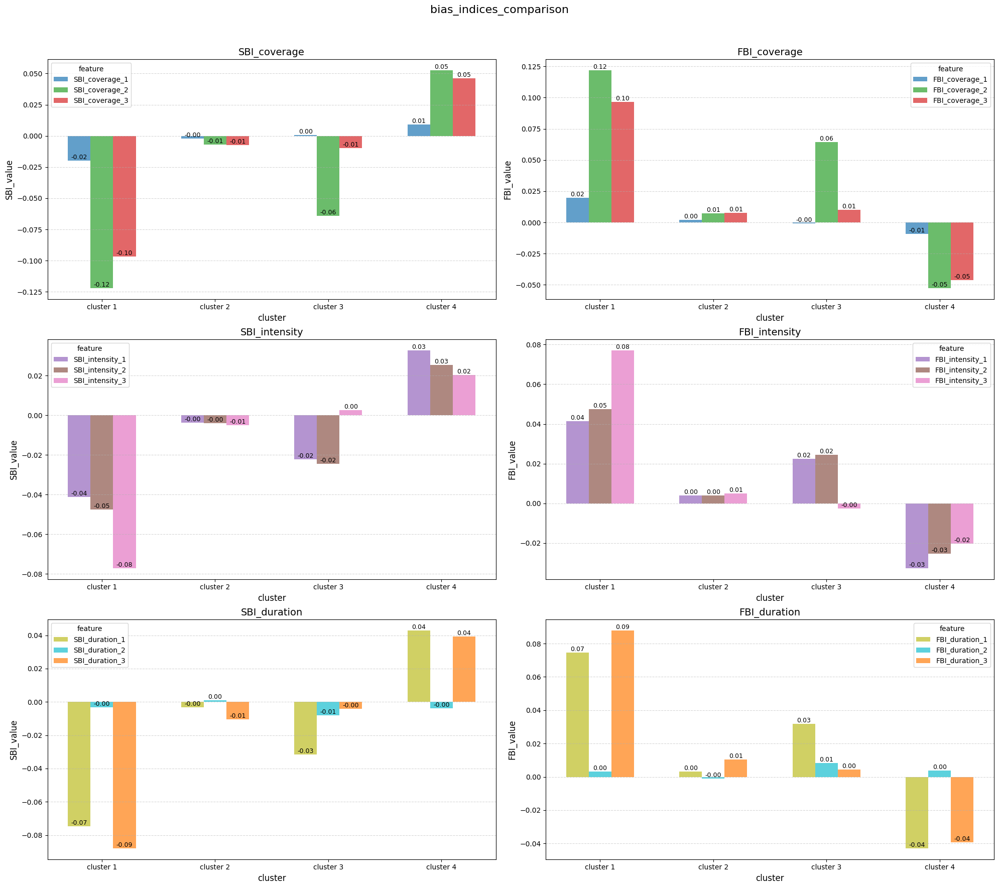

In [47]:
# 定义要绘制的特征组
feature_groups = [
    {
        'title': 'SBI_coverage',
        'features': ['SBI_coverage_1', 'SBI_coverage_2', 'SBI_coverage_3'],
        'colors': ['#1f77b4', '#2ca02c', '#d62728'],  # 蓝色、绿色、红色
        'ylabel': 'SBI_value'
    },
    {
        'title': 'FBI_coverage',
        'features': ['FBI_coverage_1', 'FBI_coverage_2', 'FBI_coverage_3'],
        'colors': ['#1f77b4', '#2ca02c', '#d62728'],
        'ylabel': 'FBI_value'
    },
    {
        'title': 'SBI_intensity',
        'features': ['SBI_intensity_1', 'SBI_intensity_2', 'SBI_intensity_3'],
        'colors': ['#9467bd', '#8c564b', '#e377c2'],  # 紫色、棕色、粉色
        'ylabel': 'SBI_value'
    },
    {
        'title': 'FBI_intensity',
        'features': ['FBI_intensity_1', 'FBI_intensity_2', 'FBI_intensity_3'],
        'colors': ['#9467bd', '#8c564b', '#e377c2'],
        'ylabel': 'FBI_value'
    },
    {
        'title': 'SBI_duration',
        'features': ['SBI_duration_1', 'SBI_duration_2', 'SBI_duration_3'],
        'colors': ['#bcbd22', '#17becf', '#ff7f0e'],  # 黄绿色、青色、橙色
        'ylabel': 'SBI_value'
    },
    {
        'title': 'FBI_duration',
        'features': ['FBI_duration_1', 'FBI_duration_2', 'FBI_duration_3'],
        'colors': ['#bcbd22', '#17becf', '#ff7f0e'],
        'ylabel': 'FBI_value'
    }
]

# 创建3x3的子图布局
fig, axes = plt.subplots(3, 2, figsize=(20, 18))
axes = axes.flatten()  # 将2D数组转换为1D，便于迭代

# 获取所有簇
clusters = bias_indices_df['cluster'].tolist()
n_clusters = len(clusters)

# 为每个特征组绘制柱状图
for i, group in enumerate(feature_groups):
    ax = axes[i]
    
    # 设置柱状图的位置
    bar_width = 0.2  # 柱状图宽度
    x = np.arange(len(clusters))  # 簇的位置
    
    # 为每个特征绘制柱状图
    for j, feature in enumerate(group['features']):
        # 确保特征存在于数据中
        if feature in bias_indices_df.columns:
            # 计算柱状图的位置
            bar_positions = x + j * bar_width
            
            # 绘制柱状图
            bars = ax.bar(bar_positions, 
                            bias_indices_df[feature].values, 
                            width=bar_width, 
                            label=feature, 
                            color=group['colors'][j],
                            alpha=0.7)
            
            # 在柱状图顶部添加数值标签
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height, 
                        f'{height:.2f}', 
                        ha='center', va='bottom', fontsize=9)
        else:
            print(f"警告: 特征 {feature} 不存在于数据中")
    
    # 设置图表属性
    ax.set_title(group['title'], fontsize=14)
    ax.set_xlabel('cluster', fontsize=12)
    ax.set_ylabel(group['ylabel'], fontsize=12)
    ax.set_xticks(x + bar_width)  # 设置x轴刻度位置
    ax.set_xticklabels([f'cluster {c}' for c in clusters])  # 设置x轴刻度标签
    ax.grid(True, linestyle='--', alpha=0.5, axis='y')  # 添加网格线
    ax.legend(title='feature', loc='best', fontsize=10)

# 隐藏未使用的子图（因为3x3=9个子图，但我们只使用了6个）
for i in range(len(feature_groups), 6):
    axes[i].axis('off')

# 调整布局
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle('bias_indices_comparison', fontsize=16)
plt.savefig(path_save + r'\bias_indices_comparison.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(path_save + r'\bias_indices_comparison.png', format='png', dpi=300, bbox_inches='tight')
plt.show()


In [48]:
# 将cluster值替换为对应的类别名称
cluster_mapping = {1: 'bias_struggle', 2: 'dual_response', 3: 'dual_response', 4: 'bias_immobility'}


In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

所有必要数据已加载，开始分析...

修改后的cluster标签分布:
cluster
dual_response      57
bias_struggle      23
bias_immobility    19
Name: count, dtype: int64

创建了 120 个3秒时间段

各类别神经元总数:
cluster
dual_response      57
bias_struggle      23
bias_immobility    19
Name: count, dtype: int64


处理时间段: 100%|██████████| 120/120 [00:00<00:00, 649.53it/s]


活动率计算完成。结果示例:


,segment_id,start_frame,end_frame,total_active_neurons,dual_response_active,dual_response_rate,bias_struggle_active,bias_struggle_rate,bias_immobility_active,bias_immobility_rate
0,0,0,29,5,3,0.052632,2,0.086957,0,0.000000
1,1,30,59,11,5,0.087719,5,0.217391,1,0.052632
2,2,60,89,6,2,0.035088,3,0.130435,1,0.052632
3,3,90,119,7,4,0.070175,3,0.130435,0,0.000000
4,4,120,149,9,4,0.070175,4,0.173913,1,0.052632


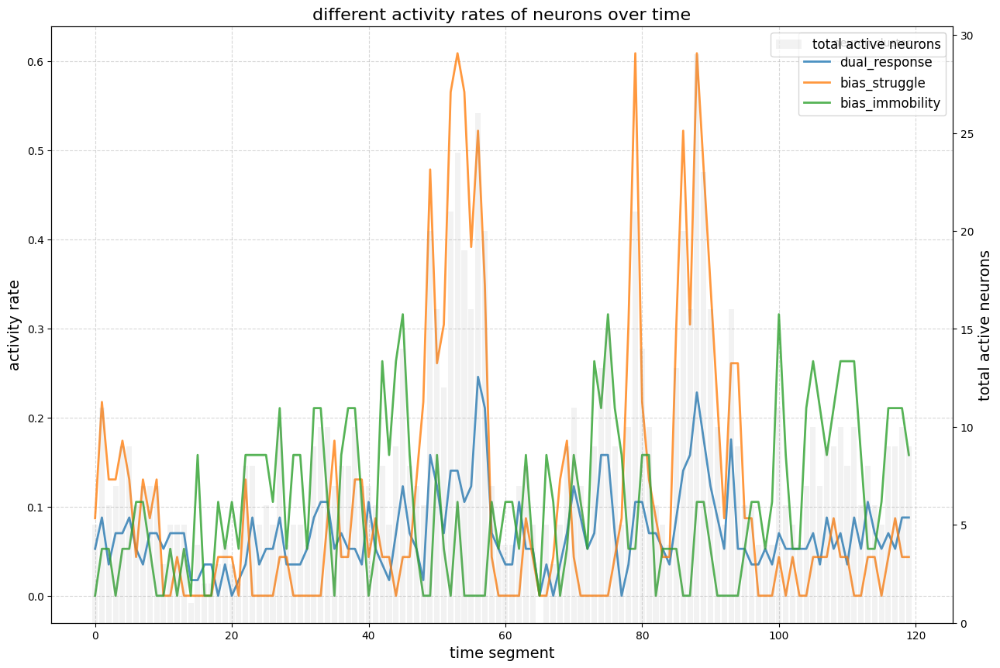


各类别平均活动率:


,cluster,average_activity_rate
1,bias_struggle,0.111232
2,bias_immobility,0.103947
0,dual_response,0.070906


In [50]:
# 神经元活动时间窗口分析

print("所有必要数据已加载，开始分析...")

# 1. 修改neuron_features_df中的cluster列值
def modify_cluster_labels(df, cluster_mapping):
    """将cluster列中的数字标签替换为文字标签"""
    df = df.copy()  # 创建副本以避免修改原始数据
    label_mapping = cluster_mapping
    df['cluster'] = df['cluster'].map(label_mapping)
    return df

# 应用修改
neuron_features_modified = modify_cluster_labels(neuron_features_df, cluster_mapping)
print("\n修改后的cluster标签分布:")
print(neuron_features_modified['cluster'].value_counts())

# 2. 按3秒（30帧）分段
def create_time_segments(total_frames, segment_size=30):
    """创建时间分段"""
    segments = []
    start_frame = 0
    while start_frame < total_frames:
        end_frame = min(start_frame + segment_size - 1, total_frames - 1)
        segments.append((start_frame, end_frame))
        start_frame += segment_size
    return segments

# 获取总帧数并创建时间分段
total_frames = resized_df_signal_neuron.shape[0]
time_segments = create_time_segments(total_frames)
print(f"\n创建了 {len(time_segments)} 个3秒时间段")

# 3. 处理事件并映射到时间段
def get_active_neurons_in_segment(segment_start, segment_end, events_df, min_active_frames=15):
    """获取在给定时间段内活动的神经元"""
    # 筛选与当前时间段有重叠的事件
    overlapping_events = events_df[
        (events_df['start_frame'] <= segment_end) & 
        (events_df['end_frame'] >= segment_start)
    ].copy()
    
    if overlapping_events.empty:
        return set()
    
    # 计算每个事件在当前时间段内的活动帧数
    overlapping_events['active_in_segment_start'] = overlapping_events['start_frame'].apply(lambda x: max(x, segment_start))
    overlapping_events['active_in_segment_end'] = overlapping_events['end_frame'].apply(lambda x: min(x, segment_end))
    overlapping_events['active_frames_in_segment'] = overlapping_events['active_in_segment_end'] - overlapping_events['active_in_segment_start'] + 1
    
    # 筛选活动帧数≥15的事件对应的神经元
    active_neurons = overlapping_events[
        overlapping_events['active_frames_in_segment'] >= min_active_frames
    ]['neuron_id'].unique()
    
    return set(active_neurons)

# 4. 统计每个时间段内各类别的活动率
def calculate_activity_rates(neuron_features, events_df, time_segments):
    """计算每个时间段内各类别的神经元活动率"""
    # 获取各类别的神经元总数
    cluster_counts = neuron_features['cluster'].value_counts()
    print("\n各类别神经元总数:")
    print(cluster_counts)
    
    # 初始化结果列表
    results = []
    
    # 对每个时间段进行处理
    for i, (start, end) in enumerate(tqdm(time_segments, desc="处理时间段")):
        # 获取当前时间段内活动的神经元
        active_neurons = get_active_neurons_in_segment(start, end, events_df)
        
        # 创建当前时间段的结果字典
        segment_result = {
            'segment_id': i,
            'start_frame': start,
            'end_frame': end,
            'total_active_neurons': len(active_neurons)
        }
        
        # 对每个类别计算活动率
        for cluster in cluster_counts.index:
            # 获取该类别的所有神经元
            cluster_neurons = set(neuron_features[neuron_features['cluster'] == cluster]['neuron_id'])
            # 计算该类别在当前时间段内活动的神经元数
            active_in_cluster = len(cluster_neurons.intersection(active_neurons))
            # 计算活动率
            activity_rate = active_in_cluster / len(cluster_neurons) if len(cluster_neurons) > 0 else 0
            # 保存结果
            segment_result[f'{cluster}_active'] = active_in_cluster
            segment_result[f'{cluster}_rate'] = activity_rate
        
        results.append(segment_result)
    
    # 转换为DataFrame
    results_df = pd.DataFrame(results)
    return results_df, cluster_counts

# 执行活动率计算
activity_rates_df, cluster_counts = calculate_activity_rates(neuron_features_modified, events_df, time_segments)

print("\n活动率计算完成。结果示例:")
display(activity_rates_df.head())

# 5. 可视化结果
def visualize_activity_rates(activity_df, cluster_labels):
    """可视化各类别的活动率随时间变化的情况"""
    # 创建图表
    plt.figure(figsize=(15, 10))
    
    # 为每个类别绘制活动率曲线
    for cluster in cluster_labels:
        rate_column = f'{cluster}_rate'
        if rate_column in activity_df.columns:
            plt.plot(activity_df['segment_id'], activity_df[rate_column], 
                        label=cluster, linewidth=2, alpha=0.8)
    
    # 设置图表属性
    plt.title('different activity rates of neurons over time', fontsize=16)
    plt.xlabel('time segment', fontsize=14)
    plt.ylabel('activity rate', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(title='neuron cluster', fontsize=12)
    
    # 添加每个时间段的总活动神经元数作为次级y轴
    ax2 = plt.gca().twinx()
    ax2.bar(activity_df['segment_id'], activity_df['total_active_neurons'], 
            alpha=0.1, color='gray', label='total active neurons')
    ax2.set_ylabel('total active neurons', fontsize=14)
    ax2.legend(loc='upper right', fontsize=12)
    plt.savefig(path_save + r'\different activity rates of neurons over time.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\different activity rates of neurons over time.png', format='png', dpi=300, bbox_inches='tight')
    
    plt.show()

# 调用可视化函数
visualize_activity_rates(activity_rates_df, cluster_counts.index)

# 6. 计算并展示各类别的平均活动率
def calculate_average_activity_rates(activity_df, cluster_labels):
    """计算各类别的平均活动率"""
    avg_rates = {}
    
    for cluster in cluster_labels:
        rate_column = f'{cluster}_rate'
        if rate_column in activity_df.columns:
            avg_rates[cluster] = activity_df[rate_column].mean()
    
    # 转换为DataFrame并排序
    avg_rates_df = pd.DataFrame(list(avg_rates.items()), columns=['cluster', 'average_activity_rate'])
    avg_rates_df = avg_rates_df.sort_values('average_activity_rate', ascending=False)
    
    return avg_rates_df

# 计算平均活动率
avg_activity_rates = calculate_average_activity_rates(activity_rates_df, cluster_counts.index)

print("\n各类别平均活动率:")
display(avg_activity_rates)


In [51]:
# 神经元活动率数据的k-means聚类分析

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

警告: 列 'weak_response_rate' 不存在，已创建并填充为0

更新后的DataFrame列名:
['segment_id', 'start_frame', 'end_frame', 'total_active_neurons', 'dual_response_active', 'dual_response_rate', 'bias_struggle_active', 'bias_struggle_rate', 'bias_immobility_active', 'bias_immobility_rate', 'weak_response_rate']

新创建的列: ['weak_response_rate']
对列 'weak_response_rate' 应用权重: 0.1

聚类数据形状: (120, 4)
K=3, 轮廓系数=0.4159
K=4, 轮廓系数=0.3286
K=5, 轮廓系数=0.3130
K=6, 轮廓系数=0.3060

最佳K值: 3, 对应的轮廓系数: 0.4159

聚类结果分布:
0    44
1    14
2    62
Name: count, dtype: int64


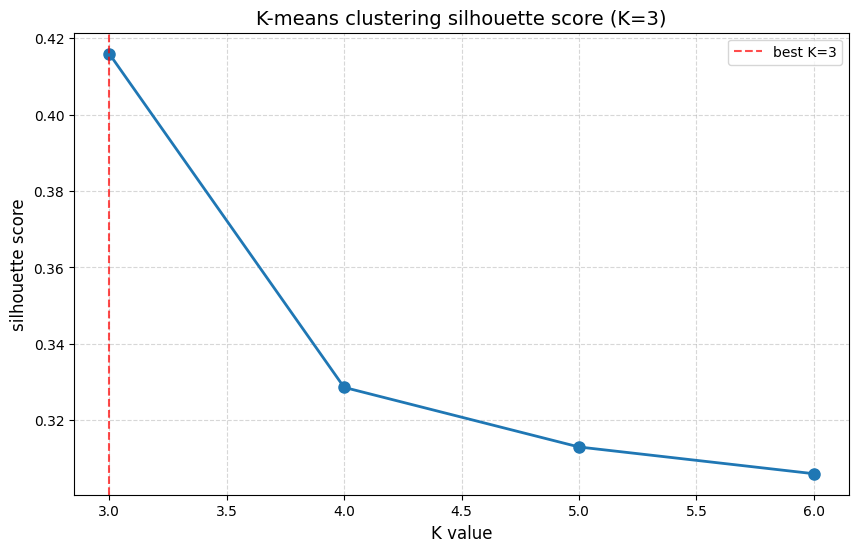

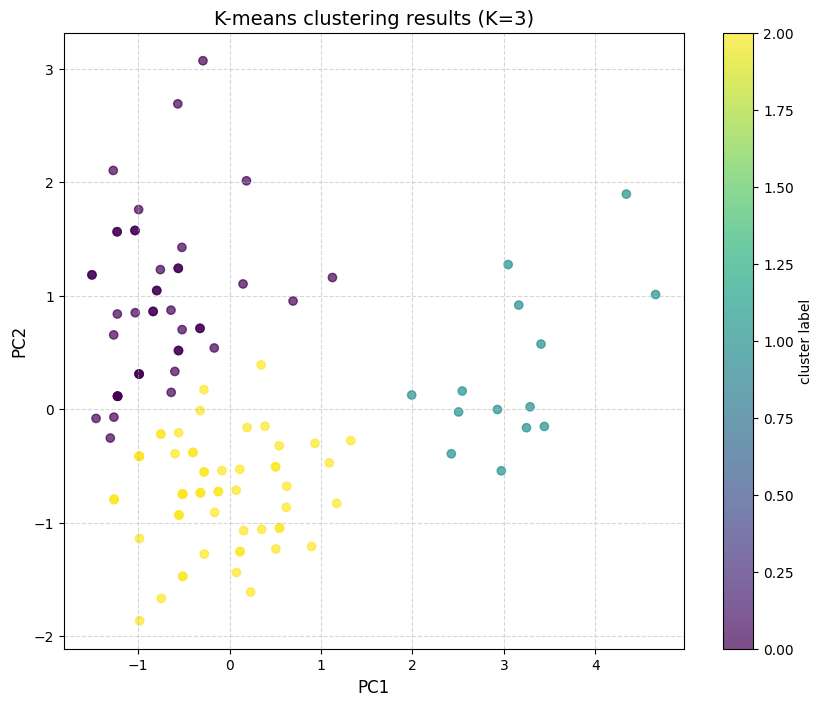

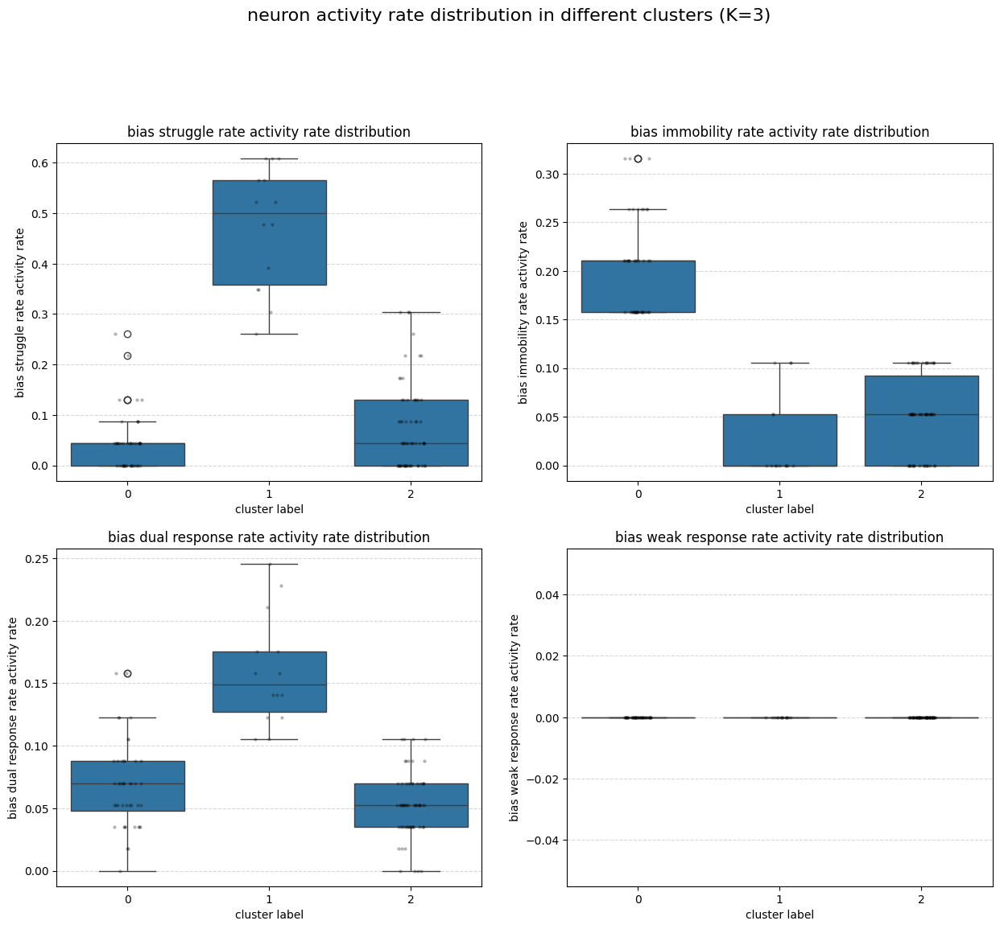


每个聚类的特征统计:


bias_struggle_rate         bias_immobility_rate          \
                      mean     std                 mean     std   
cluster                                                           
0                   0.0455  0.0570               0.2010  0.0498   
1                   0.4720  0.1204               0.0301  0.0448   
2                   0.0764  0.0850               0.0518  0.0387   

        dual_response_rate         weak_response_rate       
                      mean     std               mean  std  
cluster                                                     
0                   0.0682  0.0345                0.0  0.0  
1                   0.1591  0.0438                0.0  0.0  
2                   0.0529  0.0257                0.0  0.0

In [52]:
def check_and_complete_columns(df):
    """检查并补充缺失的列，将缺失列的值设为0"""
    required_columns = [
        'bias_struggle_rate',
        'bias_immobility_rate', 
        'dual_response_rate',
        'weak_response_rate'
    ]
    
    # 记录哪些列是新创建的
    newly_created_columns = []
    
    # 检查并添加缺失的列
    df_copy = df.copy()
    for col in required_columns:
        if col not in df_copy.columns:
            df_copy[col] = 0
            newly_created_columns.append(col)
            print(f"警告: 列 '{col}' 不存在，已创建并填充为0")
    
    return df_copy, newly_created_columns

# 应用列检查和补充
activity_df, new_columns = check_and_complete_columns(activity_rates_df)
print("\n更新后的DataFrame列名:")
print(activity_df.columns.tolist())
print(f"\n新创建的列: {new_columns}")

# 2. 准备聚类数据并应用权重
def prepare_clustering_data(df, required_columns, new_columns, weight_factor=0.1):
    """准备聚类数据，并对新创建的列应用权重"""
    # 提取需要的列
    clustering_data = df[required_columns].values.copy()
    
    # 创建权重数组（默认权重为1）
    weights = np.ones(len(required_columns))
    
    # 对新创建的列应用较小的权重
    for i, col in enumerate(required_columns):
        if col in new_columns:
            weights[i] = weight_factor
            print(f"对列 '{col}' 应用权重: {weight_factor}")
    
    # 应用权重
    weighted_data = clustering_data * weights
    
    # 标准化数据
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(weighted_data)
    
    return scaled_data, weights, scaler

# 定义需要的列
required_columns = [
    'bias_struggle_rate',
    'bias_immobility_rate', 
    'dual_response_rate',
    'weak_response_rate'
]

# 准备聚类数据
clustering_data, weights, scaler = prepare_clustering_data(
    activity_df, required_columns, new_columns
)

print(f"\n聚类数据形状: {clustering_data.shape}")

# 3. 进行K-means聚类并计算轮廓系数
def perform_kmeans_and_evaluate(data, k_range=(3, 7)):
    """执行K-means聚类并计算不同K值的轮廓系数"""
    silhouette_scores = []
    k_values = list(range(k_range[0], k_range[1]))
    
    # 对每个K值执行聚类
    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(data)
        
        # 计算轮廓系数
        score = silhouette_score(data, cluster_labels)
        silhouette_scores.append(score)
        
        print(f"K={k}, 轮廓系数={score:.4f}")
    
    return k_values, silhouette_scores

# 执行聚类评估
k_values, silhouette_scores = perform_kmeans_and_evaluate(clustering_data)

# 4. 选择最佳K值
best_k_index = np.argmax(silhouette_scores)
best_k = k_values[best_k_index]
best_score = silhouette_scores[best_k_index]

print(f"\n最佳K值: {best_k}, 对应的轮廓系数: {best_score:.4f}")

# 5. 使用最佳K值执行最终聚类
def perform_final_clustering(data, best_k):
    """使用最佳K值执行最终聚类"""
    kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(data)
    
    # 获取聚类中心
    cluster_centers = kmeans.cluster_centers_
    
    return cluster_labels, cluster_centers, kmeans

# 执行最终聚类
cluster_labels, cluster_centers, kmeans_model = perform_final_clustering(clustering_data, best_k)

# 将聚类结果添加到原始数据中
activity_df['cluster'] = cluster_labels

print(f"\n聚类结果分布:")
print(pd.Series(cluster_labels).value_counts().sort_index())

# 6. 可视化结果
def visualize_clustering_results(df, cluster_labels, k_values, silhouette_scores, best_k):
    """可视化聚类结果"""
    # 1. 轮廓系数图
    plt.figure(figsize=(10, 6))
    plt.plot(k_values, silhouette_scores, 'o-', linewidth=2, markersize=8)
    plt.axvline(x=best_k, color='r', linestyle='--', alpha=0.7, label=f'best K={best_k}')
    plt.title(f'K-means clustering silhouette score (K={best_k})', fontsize=14)
    plt.xlabel('K value', fontsize=12)
    plt.ylabel('silhouette score', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    # plt.tight_layout()
    plt.savefig(path_save + r'\total Kmeans clustering silhouette score.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\total Kmeans clustering silhouette score.png', format='png', dpi=300, bbox_inches='tight')

    plt.show()
    
    # 2. 聚类结果散点图（使用前两个主成分进行可视化）
    from sklearn.decomposition import PCA
    
    pca = PCA(n_components=2)
    pca_data = pca.fit_transform(clustering_data)
    
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(pca_data[:, 0], pca_data[:, 1], c=cluster_labels, cmap='viridis', alpha=0.7)
    plt.colorbar(scatter, label='cluster label')
    plt.title(f'K-means clustering results (K={best_k})', fontsize=14)
    plt.xlabel('PC1', fontsize=12)
    plt.ylabel('PC2', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    # plt.tight_layout()
    plt.savefig(path_save + r'\total Kmeans clustering results PCA 2 dimension.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\total Kmeans clustering results PCA 2 dimension.png', format='png', dpi=300, bbox_inches='tight')

    plt.show()
    
    # 3. 各类别在四个特征上的箱线图
    feature_labels = {
        'bias_struggle_rate': 'bias struggle rate',
        'bias_immobility_rate': 'bias immobility rate',
        'dual_response_rate': 'bias dual response rate',
        'weak_response_rate': 'bias weak response rate'
    }
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()
    
    for i, (col, label) in enumerate(feature_labels.items()):
        ax = axes[i]
        sns.boxplot(x='cluster', y=col, data=df, ax=ax)
        sns.stripplot(x='cluster', y=col, data=df, size=3, color='black', alpha=0.3, ax=ax)
        ax.set_title(f'{label} activity rate distribution', fontsize=12)
        ax.set_xlabel('cluster label', fontsize=10)
        ax.set_ylabel(f'{label} activity rate', fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.5, axis='y')
    
    # plt.tight_layout()
    plt.suptitle(f'neuron activity rate distribution in different clusters (K={best_k})', fontsize=16, y=1.02)
    plt.show()

# 调用可视化函数
visualize_clustering_results(activity_df, cluster_labels, k_values, silhouette_scores, best_k)

# 7. 分析每个聚类的特征
def analyze_cluster_features(df, required_columns):
    """分析每个聚类的特征"""
    cluster_analysis = df.groupby('cluster')[required_columns].agg(['mean', 'std']).round(4)
    
    print("\n每个聚类的特征统计:")
    display(cluster_analysis)
    
    return cluster_analysis

# 执行聚类特征分析
cluster_analysis = analyze_cluster_features(activity_df, required_columns)

In [53]:
combined_df = combined_df.reset_index().rename(columns={'index': 'segment_id'})
combined_df

,segment_id,segment_start,segment_end,segment_duration,avg_value,is_struggle,proportion,sync_status
0,0,0,29,30,1.000000,1,0.040404,0
1,1,30,59,30,1.000000,1,0.090909,1
2,2,60,89,30,1.000000,1,0.060606,0
3,3,90,119,30,1.000000,1,0.050505,0
4,4,120,149,30,0.133333,0,0.080808,0
...,...,...,...,...,...,...,...,...
115,115,3450,3479,30,0.133333,0,0.030303,0
116,116,3480,3509,30,0.000000,0,0.090909,1
117,117,3510,3539,30,0.000000,0,0.090909,1
118,118,3540,3569,30,0.000000,0,0.090909,1


In [54]:
# 函数：为single_neuron_features添加segment_id列
def add_segment_id_to_neurons(single_neuron_features):
    """
    为每个神经元添加segment_id列，每个神经元按顺序赋值0到119
    
    参数:
    single_neuron_features: 单神经元特征数据框
    
    返回:
    添加了segment_id列的数据框
    """
    # 复制数据框以避免修改原始数据
    df_copy = single_neuron_features.copy()
    
    # 获取所有唯一的神经元ID并排序
    unique_neuron_ids = sorted(df_copy['neuron_id'].unique())
    print(f"找到{len(unique_neuron_ids)}个唯一的神经元ID")
    
    # 为每个神经元添加对应的segment_id
    segment_ids = []
    
    for neuron_id in unique_neuron_ids:
        # 为每个神经元添加120个时间段（0-119）
        segment_ids.extend(range(120))
    
    # 检查数据长度是否匹配
    if len(segment_ids) != len(df_copy):
        raise ValueError(f"数据长度不匹配: 预期{len(segment_ids)}行，实际{len(df_copy)}行")
    
    # 设置segment_id列
    df_copy['segment_id'] = segment_ids
    
    # 按neuron_id和segment_id排序
    df_copy = df_copy.sort_values(by=['neuron_id', 'segment_id'])
    
    # 重置索引
    df_copy = df_copy.reset_index(drop=True)
    
    return df_copy

# 函数：合并特征列
def merge_feature_column(df, prefix):
    """
    将(xxx_1, xxx_2, xxx_3)的二值化数据合并为一个列
    
    参数:
    df: 数据框（单个神经元的数据）
    prefix: 特征前缀（如'coverage', 'intensity', 'duration'）
    
    返回:
    合并后的列数据
    """
    # 创建结果数组
    result = np.zeros(len(df), dtype=int)
    
    # 检查每个特征列
    for i in range(1, 4):
        col_name = f"{prefix}_{i}"
        if col_name in df.columns:
            # 找到该列值为1的位置，设置结果为对应的序号
            result[df[col_name] == 1] = i
        else:
            print(f"警告：{col_name} 列不存在于数据框中")
    
    return result

# 函数：按神经元分组并处理特征
def process_neuron_features(single_neuron_features_with_segment):
    """
    按神经元分组并处理特征列
    
    参数:
    single_neuron_features_with_segment: 添加了segment_id列的单神经元特征数据框
    
    返回:
    处理后的特征字典，键为特征名，值为数据
    """
    # 按neuron_id分组
    grouped = single_neuron_features_with_segment.groupby('neuron_id')
    
    # 创建结果字典
    neuron_features_dict = {}
    
    print(f"开始处理{len(grouped)}个神经元的数据...")
    
    # 处理每个神经元
    for neuron_id, group in grouped:
        # 确保每个神经元有120个时间段
        if len(group) != 120:
            print(f"警告：神经元ID {neuron_id} 只有 {len(group)} 个时间段，预期120个")
            
        # 按segment_id排序
        group_sorted = group.sort_values(by='segment_id')
        
        # 合并特征列
        coverage_col = merge_feature_column(group_sorted, 'coverage')
        intensity_col = merge_feature_column(group_sorted, 'intensity')
        duration_col = merge_feature_column(group_sorted, 'duration')
        
        # 保存到字典中
        neuron_features_dict[f'coverage_{neuron_id}'] = coverage_col
        neuron_features_dict[f'intensity_{neuron_id}'] = intensity_col  
        neuron_features_dict[f'duration_{neuron_id}'] = duration_col  
    
    print(f"神经元特征处理完成，共生成{len(neuron_features_dict)}列特征数据")
    
    return neuron_features_dict

# 函数：整合所有数据
def integrate_all_data(single_neuron_features, activity_df, combined_df):
    """
    整合所有数据，生成120行的表格
    
    参数:
    single_neuron_features: 单神经元特征数据框
    activity_df: 群体活动特征数据框
    combined_df: 群体同步特征数据框
    
    返回:
    整合后的120行数据框
    """
    print("开始整合数据...")
    
    # 1. 为单神经元数据添加segment_id列
    print("步骤1: 为单神经元数据添加segment_id列")
    df_with_segment = add_segment_id_to_neurons(single_neuron_features)
    
    # 2. 处理神经元特征
    print("步骤2: 按神经元分组并处理特征列")
    neuron_features = process_neuron_features(df_with_segment)
    
    # 3. 创建基础整合数据框
    print("步骤3: 创建基础整合数据框")
    # 以segment_id为索引创建基础数据框
    final_df = pd.DataFrame(index=range(120))
    final_df['segment_id'] = range(120)
    
    # 4. 添加神经元特征列
    print("步骤4: 添加神经元特征列")
    for feature_name, feature_data in neuron_features.items():
        if len(feature_data) == 120:
            final_df[feature_name] = feature_data
        else:
            print(f"警告：{feature_name} 的数据长度为 {len(feature_data)}，跳过添加")
    
    # 5. 合并群体特征
    print("步骤5: 合并群体特征")
    # 确保activity_df和combined_df按segment_id排序
    activity_df_sorted = activity_df.sort_values(by='segment_id')
    combined_df_sorted = combined_df.sort_values(by='segment_id')
    
    # 合并cluster列
    if 'cluster' in activity_df_sorted.columns:
        final_df = pd.merge(final_df, activity_df_sorted[['segment_id', 'cluster']], on='segment_id', how='left')
    else:
        print("警告：activity_df中没有找到cluster列")
    
    # 合并sync_status列
    if 'sync_status' in combined_df_sorted.columns:
        final_df = pd.merge(final_df, combined_df_sorted[['segment_id', 'sync_status']], on='segment_id', how='left')
    else:
        print("警告：combined_df中没有找到sync_status列")
    
    # 合并is_struggle列
    if 'is_struggle' in combined_df_sorted.columns:
        final_df = pd.merge(final_df, combined_df_sorted[['segment_id', 'is_struggle']], on='segment_id', how='left')
    else:
        print("警告：combined_df中没有找到is_struggle列")
    
    # 6. 处理缺失值
    print("步骤6: 处理缺失值")
    # 填充数字型列的缺失值为0
    numeric_cols = final_df.select_dtypes(include=[np.number]).columns
    final_df[numeric_cols] = final_df[numeric_cols].fillna(0)
    
    # 7. 重置索引
    final_df = final_df.reset_index(drop=True)
    
    print("数据整合完成")
    return final_df

# 函数：检查数据并显示结果
def check_and_display_results(single_neuron_features, activity_df, combined_df, final_df):
    """
    检查数据处理结果并显示关键信息
    """
    print("\n=== 数据处理结果检查 ===")
    
    # 检查single_neuron_features
    print("\nsingle_neuron_features 信息:")
    print(f"形状: {single_neuron_features.shape}")
    print(f"列: {single_neuron_features.columns.tolist()}")
    
    # 检查activity_df
    print("\nactivity_df 信息:")
    print(f"形状: {activity_df.shape}")
    if 'cluster' in activity_df.columns:
        print(f"cluster的唯一值: {activity_df['cluster'].unique().tolist()}")
    
    # 检查combined_df
    print("\ncombined_df 信息:")
    print(f"形状: {combined_df.shape}")
    if 'sync_status' in combined_df.columns:
        print(f"sync_status的唯一值: {combined_df['sync_status'].unique().tolist()}")
    if 'is_struggle' in combined_df.columns:
        print(f"is_struggle的唯一值: {combined_df['is_struggle'].unique().tolist()}")
    
    # 检查最终结果
    print("\n最终整合结果信息:")
    print(f"形状: {final_df.shape}")
    print(f"列数: {len(final_df.columns)}")
    print(f"前5列: {final_df.columns[:5].tolist()}")
    print(f"后5列: {final_df.columns[-5:].tolist()}")
    
    # 显示前几行结果（只显示关键列）
    print("\n最终结果前5行（关键列）:")
    key_columns = ['segment_id', 'cluster', 'sync_status', 'is_struggle']
    key_columns = [col for col in key_columns if col in final_df.columns]
    
    # 检查是否有120行
    print(f"\n最终结果行数: {len(final_df)}")
    if len(final_df) == 120:
        print("✓ 行数正确")
    else:
        print("✗ 行数错误，应为120行")
    
    # 检查segment_id是否连续
    segment_ids = final_df['segment_id'].tolist()
    if segment_ids == list(range(120)):
        print("✓ segment_id连续且完整")
    else:
        print("✗ segment_id不完整或不连续")

# 主函数：处理数据并生成结果
def process_and_integrate_data(single_neuron_features, activity_df, combined_df):
    """
    主函数：处理数据并生成整合后的结果
    """
    try:
        # 检查输入数据
        print("开始处理数据...")
        
        # 检查必要的列是否存在
        required_columns = {
            'single_neuron_features': ['neuron_id', 'coverage_1', 'coverage_2', 'coverage_3', 
                                      'intensity_1', 'intensity_2', 'intensity_3', 
                                      'duration_1', 'duration_2', 'duration_3'],
            'activity_df': ['segment_id', 'cluster'],
            'combined_df': ['segment_id', 'sync_status', 'is_struggle']
        }
        
        # 检查每个数据框的必要列
        for df_name, df in zip(['single_neuron_features', 'activity_df', 'combined_df'], 
                              [single_neuron_features, activity_df, combined_df]):
            missing_cols = [col for col in required_columns[df_name] if col not in df.columns]
            if missing_cols:
                print(f"警告：{df_name} 缺少必要的列: {missing_cols}")
        
        # 执行整合
        final_df = integrate_all_data(single_neuron_features, activity_df, combined_df)
        
        # 检查结果
        check_and_display_results(single_neuron_features, activity_df, combined_df, final_df)
        
        return final_df
        
    except Exception as e:
        print(f"处理数据时发生错误: {e}")
        raise


final_df = process_and_integrate_data(single_neuron_features, activity_df, combined_df)

# 显示最终结果的统计信息
print("\n=== 最终结果统计信息 ===")
print(f"整合后的数据框形状: {final_df.shape}")

# 统计神经元特征列的数量
coverage_cols_count = len([col for col in final_df.columns if col.startswith('coverage_')])
intensity_cols_count = len([col for col in final_df.columns if col.startswith('intensity_')])
duration_cols_count = len([col for col in final_df.columns if col.startswith('duration_')])

print(f"coverage特征列数量: {coverage_cols_count}")
print(f"intensity特征列数量: {intensity_cols_count}")
print(f"duration特征列数量: {duration_cols_count}")
print(f"总特征列数量: {coverage_cols_count + intensity_cols_count + duration_cols_count}")
    

开始处理数据...
开始整合数据...
步骤1: 为单神经元数据添加segment_id列
找到99个唯一的神经元ID
步骤2: 按神经元分组并处理特征列
开始处理99个神经元的数据...
神经元特征处理完成，共生成297列特征数据
步骤3: 创建基础整合数据框
步骤4: 添加神经元特征列
步骤5: 合并群体特征
步骤6: 处理缺失值
数据整合完成

=== 数据处理结果检查 ===

single_neuron_features 信息:
形状: (11880, 13)
列: ['neuron_id', 'seg_start_frame', 'seg_end_frame', 'coverage_1', 'coverage_2', 'coverage_3', 'intensity_1', 'intensity_2', 'intensity_3', 'duration_1', 'duration_2', 'duration_3', 'is_struggle']

activity_df 信息:
形状: (120, 12)
cluster的唯一值: [2, 0, 1]

combined_df 信息:
形状: (120, 8)
sync_status的唯一值: [0, 1]
is_struggle的唯一值: [1, 0]

最终整合结果信息:
形状: (120, 301)
列数: 301
前5列: ['segment_id', 'coverage_0', 'intensity_0', 'duration_0', 'coverage_1']
后5列: ['intensity_107', 'duration_107', 'cluster', 'sync_status', 'is_struggle']

最终结果前5行（关键列）:

最终结果行数: 120
✓ 行数正确
✓ segment_id连续且完整

=== 最终结果统计信息 ===
整合后的数据框形状: (120, 301)
coverage特征列数量: 99
intensity特征列数量: 99
duration特征列数量: 99
总特征列数量: 297


In [55]:
column_mapping = {
    'cluster': 'function_group'
}
final_df = final_df.rename(columns=column_mapping)

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from scipy import stats
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LinearSegmentedColormap

In [57]:
neuron_features_df

,neuron_id,coverage_1_rest,coverage_1_struggle,coverage_2_rest,coverage_2_struggle,coverage_3_rest,coverage_3_struggle,intensity_1_rest,intensity_1_struggle,intensity_2_rest,intensity_2_struggle,intensity_3_rest,intensity_3_struggle,duration_1_rest,duration_1_struggle,duration_2_rest,duration_2_struggle,duration_3_rest,duration_3_struggle,cluster
0,0,0.0,0.052632,0.047619,0.280702,0.047619,0.087719,0.0,0.105263,0.047619,0.052632,0.015873,0.070175,0.063492,0.192982,0.0,0.0,0.0,0.035088,1
1,1,0.0,0.0,0.031746,0.122807,0.0,0.157895,0.015873,0.035088,0.0,0.017544,0.0,0.157895,0.015873,0.052632,0.0,0.0,0.0,0.157895,1
2,2,0.015873,0.017544,0.079365,0.017544,0.079365,0.052632,0.015873,0.0,0.031746,0.035088,0.095238,0.017544,0.047619,0.0,0.0,0.0,0.095238,0.052632,4
3,3,0.0,0.017544,0.047619,0.105263,0.015873,0.0,0.031746,0.052632,0.0,0.0,0.015873,0.0,0.031746,0.052632,0.015873,0.0,0.0,0.0,3
4,4,0.015873,0.0,0.063492,0.035088,0.079365,0.017544,0.047619,0.017544,0.031746,0.0,0.015873,0.017544,0.047619,0.017544,0.0,0.0,0.047619,0.017544,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,103,0.031746,0.035088,0.063492,0.122807,0.0,0.087719,0.0,0.035088,0.031746,0.035088,0.031746,0.087719,0.031746,0.070175,0.031746,0.0,0.0,0.087719,1
95,104,0.0,0.017544,0.015873,0.210526,0.0,0.122807,0.015873,0.105263,0.0,0.052632,0.0,0.087719,0.015873,0.192982,0.0,0.0,0.0,0.052632,1
96,105,0.0,0.0,0.111111,0.087719,0.015873,0.070175,0.015873,0.017544,0.047619,0.035088,0.031746,0.070175,0.047619,0.017544,0.0,0.0,0.047619,0.105263,2
97,106,0.015873,0.0,0.063492,0.052632,0.0,0.070175,0.031746,0.017544,0.0,0.0,0.0,0.087719,0.031746,0.017544,0.0,0.0,0.0,0.087719,2


In [58]:
cluster_mapping

{1: 'bias_struggle',
 2: 'dual_response',
 3: 'dual_response',
 4: 'bias_immobility'}

输入数据验证通过，开始分析...
开始神经元活动分析与能量场计算...
处理神经元特征数据...
{1: 'bias_struggle', 2: 'dual_response', 3: 'dual_response', 4: 'bias_immobility'}
处理后的cluster类别分布:
cluster
dual_response      57
bias_struggle      23
bias_immobility    19
Name: count, dtype: int64
按30帧(3秒)生成分段...
生成了120个时间窗口
标记各时间窗口内的有效活动神经元...
基于Z-score划分双响应群神经元亚群...
双响应群神经元亚群划分完成，delta_f均值: 0.0490, 标准差: 0.3091
亚群分布: dm    28
di    16
ds    13
Name: count, dtype: int64
计算各类别在时间窗口中的活动率和标准化有效激活数...
计算各类别的基准激活水平和标准化有效激活数...
计算权重参数...
计算得到w_ds: 0.7000
计算得到w_di: 0.7000
计算状态贡献度...
对状态进行归类...
计算滑动窗口稳定概率...
计算自由能（势能）...
生成二维能量场...
生成可视化结果...
神经元活动分析与能量场计算完成！

分析结果摘要:
1. 处理后的神经元特征: (99, 21)
2. 生成的时间窗口数: 120
3. 激活状态矩阵: (120, 99)
4. 双响应亚群权重: {'dm': 0.05, 'ds': 0.7, 'di': 0.7}
5. 状态指示数组形状: (120,)
6. 归一化状态概率数组形状: (120,)
7. 势能数组形状: (120,)
8. 能量场形状: (50, 50)


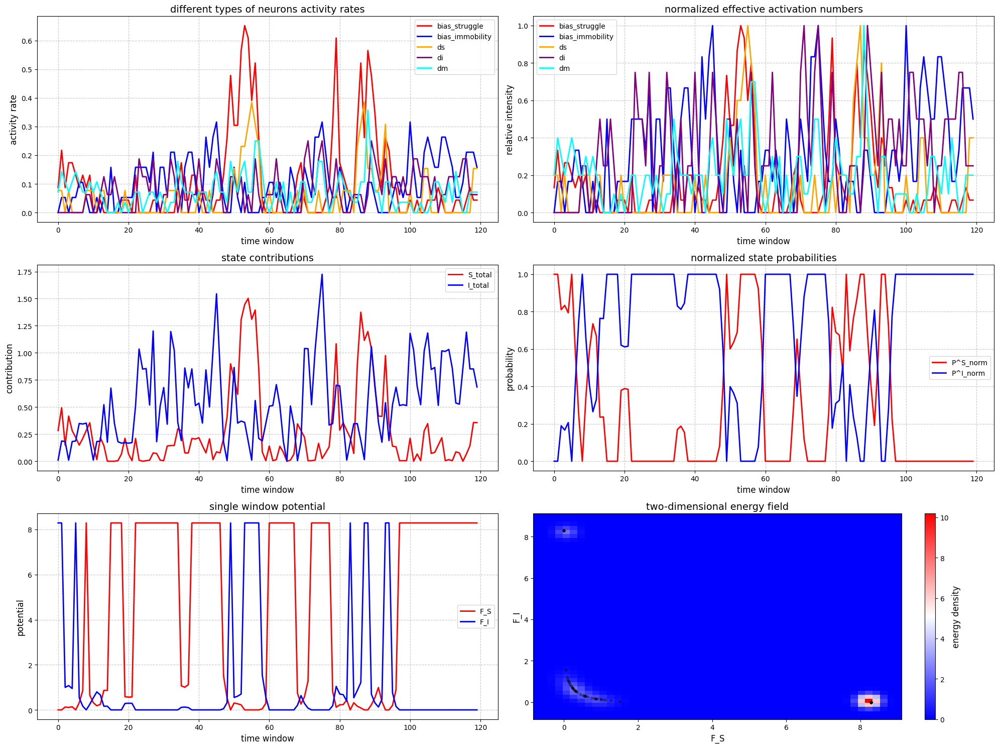

In [59]:
# 主函数：执行完整的神经元活动分析与能量场计算
def analyze_neuron_activity_energy(
    neuron_features_df, 
    events_df, 
    resized_df_signal_neuron_raw, 
    window_size_frames=30,  # 3秒对应的帧数
    activation_threshold_frames=15,  # 50%窗口时间对应的帧数
    cluster_mapping=cluster_mapping
):
    """
    执行完整的神经元活动分析与能量场计算，包括:
    1. 数据预处理与时间分段
    2. 有效活动神经元标记
    3. 双响应神经元亚群划分（基于Z-score）
    4. 标准化有效激活数计算
    5. 权重参数确定
    6. 状态贡献度分析
    7. 滑动窗口稳定概率计算
    8. 势能与能量场生成
    
    参数:
    neuron_features_df: 神经元特征数据框，包含cluster信息
    events_df: 神经元事件数据框
    resized_df_signal_neuron_raw: 原始神经元信号数据框
    window_size_frames: 时间窗口大小（帧数）
    activation_threshold_frames: 激活阈值（帧数）
    
    返回:
    analysis_results: 包含所有分析结果的字典
    """
    print("开始神经元活动分析与能量场计算...")
    
    # 1. 处理neuron_features_df的cluster列
    print("处理神经元特征数据...")
    neuron_features_processed = neuron_features_df.copy()
    
    # 将cluster值替换为对应的类别名称
    cluster_mapping = cluster_mapping
    print(cluster_mapping)
    neuron_features_processed['cluster'] = neuron_features_processed['cluster'].replace(cluster_mapping)
    
    # 验证替换是否成功
    print(f"处理后的cluster类别分布:\n{neuron_features_processed['cluster'].value_counts()}")
    
    # 2. 生成时间窗口分段
    print(f"按{window_size_frames}帧(3秒)生成分段...")
    total_frames = len(resized_df_signal_neuron_raw)
    num_windows = (total_frames + window_size_frames - 1) // window_size_frames  # 向上取整
    
    # 创建窗口信息字典
    windows_info = []
    for i in range(num_windows):
        start_frame = i * window_size_frames
        end_frame = min((i + 1) * window_size_frames, total_frames)  # 最后一个窗口可能不足30帧
        windows_info.append({
            'window_id': i,
            'start_frame': start_frame,
            'end_frame': end_frame,
            'duration_frames': end_frame - start_frame
        })
    
    windows_df = pd.DataFrame(windows_info)
    print(f"生成了{len(windows_df)}个时间窗口")
    
    # 3. 标记每个窗口内有有效活动的神经元
    print("标记各时间窗口内的有效活动神经元...")
    # 创建神经元ID到窗口激活状态的映射
    neuron_window_activation = {}
    all_neuron_ids = neuron_features_processed['neuron_id'].unique()
    
    for neuron_id in all_neuron_ids:
        # 获取当前神经元的所有事件
        neuron_events = events_df[events_df['neuron_id'] == neuron_id].copy()
        
        # 初始化该神经元在所有窗口的激活状态为0
        activation_status = [0] * len(windows_df)
        
        # 检查每个窗口是否有有效活动
        for win_idx, window in windows_df.iterrows():
            # 检查该窗口内是否有事件，且事件总持续时间达到阈值
            window_events = neuron_events[
                (neuron_events['start_frame'] < window['end_frame']) &
                (neuron_events['end_frame'] > window['start_frame'])
            ]
            
            # 计算每个事件在当前窗口内的持续时间
            total_active_frames = 0
            for _, event in window_events.iterrows():
                # 计算事件与窗口的重叠部分
                overlap_start = max(event['start_frame'], window['start_frame'])
                overlap_end = min(event['end_frame'], window['end_frame'])
                overlap_duration = overlap_end - overlap_start
                total_active_frames += overlap_duration
            
            # 如果总活跃帧数达到阈值，则标记为激活
            if total_active_frames >= activation_threshold_frames:
                activation_status[win_idx] = 1
        
        neuron_window_activation[neuron_id] = activation_status
    
    # 创建窗口-神经元激活状态矩阵
    activation_matrix = pd.DataFrame(neuron_window_activation, index=windows_df['window_id'])
    
    # 4. 对双响应群神经元进行亚群划分（基于Z-score方法）
    print("基于Z-score划分双响应群神经元亚群...")
    # 定义各类别神经元ID集合
    bias_struggle_neurons = set(neuron_features_processed[
        neuron_features_processed['cluster'] == 'bias_struggle'
    ]['neuron_id'])
    
    bias_immobility_neurons = set(neuron_features_processed[
        neuron_features_processed['cluster'] == 'bias_immobility'
    ]['neuron_id'])
    
    dual_response_neurons = set(neuron_features_processed[
        neuron_features_processed['cluster'] == 'dual_response'
    ]['neuron_id'])
    
    # 计算每个窗口中各类别是否激活（至少有一个神经元激活）
    window_class_activation = {}
    for win_idx in range(len(windows_df)):
        # 检查bias_struggle群在当前窗口是否有激活
        struggle_activated = any(activation_matrix.iloc[win_idx][neuron_id] 
                                for neuron_id in bias_struggle_neurons if neuron_id in activation_matrix.columns)
        
        # 检查bias_immobility群在当前窗口是否有激活
        immobility_activated = any(activation_matrix.iloc[win_idx][neuron_id] 
                                  for neuron_id in bias_immobility_neurons if neuron_id in activation_matrix.columns)
        
        window_class_activation[win_idx] = {
            'struggle_activated': struggle_activated,
            'immobility_activated': immobility_activated
        }
    
    # 为双响应神经元计算共激活频率并划分亚群
    dual_subgroups = {}
    delta_f_list = []
    
    for neuron_id in dual_response_neurons:
        # 获取该神经元的激活窗口
        neuron_activations = np.array(neuron_window_activation[neuron_id])
        total_active_windows = np.sum(neuron_activations)
        
        if total_active_windows == 0:
            # 如果该神经元从未激活，无法划分亚群
            dual_subgroups[neuron_id] = 'unknown'
            continue
        
        # 计算与bias_struggle群的共激活频率
        struggle_co_activation_windows = 0
        immobility_co_activation_windows = 0
        
        for win_idx in range(len(windows_df)):
            if neuron_activations[win_idx] == 1:
                # 该窗口神经元激活，检查与各类别的共激活情况
                if window_class_activation[win_idx]['struggle_activated']:
                    struggle_co_activation_windows += 1
                if window_class_activation[win_idx]['immobility_activated']:
                    immobility_co_activation_windows += 1
        
        # 计算共激活频率
        f_s = struggle_co_activation_windows / total_active_windows if total_active_windows > 0 else 0
        f_im = immobility_co_activation_windows / total_active_windows if total_active_windows > 0 else 0
        
        # 计算共激活频率差异
        delta_f = f_s - f_im
        delta_f_list.append(delta_f)
        
        # 暂时存储，后面统一计算阈值
        dual_subgroups[neuron_id] = {'f_s': f_s, 'f_im': f_im, 'delta_f': delta_f}
    
    # 计算整体均值和标准差用于阈值确定
    if len(delta_f_list) > 0:
        # 计算delta_f的均值和标准差
        mu_delta_f = np.mean(delta_f_list)
        sigma_delta_f = np.std(delta_f_list)
        
        # 应用Z-score阈值划分亚群
        for neuron_id, metrics in dual_subgroups.items():
            if isinstance(metrics, dict):  # 跳过那些从未激活的神经元
                delta_f = metrics['delta_f']
                # 计算标准化差异得分
                Z_i = (delta_f - mu_delta_f) / sigma_delta_f if sigma_delta_f > 0 else 0
                
                if Z_i > 0.5:
                    dual_subgroups[neuron_id] = 'ds'  # 挣扎偏向亚群
                elif Z_i < -0.5:
                    dual_subgroups[neuron_id] = 'di'  # 非挣扎偏向亚群
                else:
                    dual_subgroups[neuron_id] = 'dm'  # 混合响应亚群
        
        print(f"双响应群神经元亚群划分完成，delta_f均值: {mu_delta_f:.4f}, 标准差: {sigma_delta_f:.4f}")
        print(f"亚群分布: {pd.Series(list(dual_subgroups.values())).value_counts()}")
    
    # 将亚群信息添加到神经元特征数据框
    neuron_features_processed['dual_subgroup'] = neuron_features_processed['neuron_id'].map(
        lambda x: dual_subgroups.get(x, None)
    )
    
    # 5. 计算各类别在各时间窗口中的活动率和标准化有效激活数
    print("计算各类别在时间窗口中的活动率和标准化有效激活数...")
    # 定义要分析的所有类别
    categories = ['bias_struggle', 'bias_immobility', 'ds', 'di', 'dm']
    category_names = {
        'bias_struggle': 's',
        'bias_immobility': 'im',
        'ds': 'ds',
        'di': 'di',
        'dm': 'dm'
    }
    
    # 初始化活动率和标准化有效激活数结果字典
    category_activation_rates = {}
    category_activation_numbers = {}
    category_populations = {}
    
    # 收集各类别的神经元数量
    for category in categories:
        if category in ['ds', 'di', 'dm']:
            # 对于双响应亚群
            category_neurons = set(neuron_features_processed[
                neuron_features_processed['dual_subgroup'] == category
            ]['neuron_id'])
        else:
            # 对于主类别
            category_neurons = set(neuron_features_processed[
                neuron_features_processed['cluster'] == category
            ]['neuron_id'])
        
        category_populations[category] = len(category_neurons)
    
    # 计算各类别的活动率和实际有效激活数
    for category in categories:
        # 获取该类别的所有神经元ID
        if category in ['ds', 'di', 'dm']:
            # 对于双响应亚群
            category_neurons = set(neuron_features_processed[
                neuron_features_processed['dual_subgroup'] == category
            ]['neuron_id'])
        else:
            # 对于主类别
            category_neurons = set(neuron_features_processed[
                neuron_features_processed['cluster'] == category
            ]['neuron_id'])
        
        # 跳过空类别
        if not category_neurons:
            continue
        
        # 计算该类别在每个窗口的活动率和有效激活数
        activation_rates = []
        activation_numbers = []
        category_size = len(category_neurons)
        
        for win_idx in range(len(windows_df)):
            # 统计该窗口中激活的神经元数量
            active_count = 0
            for neuron_id in category_neurons:
                if neuron_id in activation_matrix.columns and activation_matrix.iloc[win_idx][neuron_id] == 1:
                    active_count += 1
            
            # 计算活动率
            activation_rate = active_count / category_size if category_size > 0 else 0
            activation_rates.append(activation_rate)
            activation_numbers.append(active_count)
        
        category_activation_rates[category] = activation_rates
        category_activation_numbers[category] = activation_numbers
    
    # 创建活动率和有效激活数数据框
    activation_rates_df = pd.DataFrame(category_activation_rates, index=windows_df['window_id'])
    activation_numbers_df = pd.DataFrame(category_activation_numbers, index=windows_df['window_id'])
    
    # 6. 计算各类别的基准激活水平和标准化有效激活数
    print("计算各类别的基准激活水平和标准化有效激活数...")
    # 计算各类别的最大激活比例（饱和激活水平）
    max_activation_proportions = {}
    for category in activation_rates_df.columns:
        if category in category_populations and category_populations[category] > 0:
            max_activation_proportions[category] = activation_rates_df[category].max()
    
    # 计算基准有效数
    baseline_effective_numbers = {}
    for category in activation_rates_df.columns:
        if category in category_populations and category_populations[category] > 0:
            baseline_effective_numbers[category] = category_populations[category] * max_activation_proportions[category]
    
    # 计算标准化有效激活数（相对强度）
    normalized_effective_numbers = {}
    for category in activation_rates_df.columns:
        if category in baseline_effective_numbers and baseline_effective_numbers[category] > 0:
            # 使用活动率除以最大活动率作为标准化有效激活数
            normalized_values = activation_rates_df[category] / max_activation_proportions[category]
            # 确保值在0-1之间
            normalized_values = np.clip(normalized_values, 0, 1)
            normalized_effective_numbers[category] = normalized_values
        else:
            normalized_effective_numbers[category] = np.zeros(len(activation_rates_df))
    
    # 创建标准化有效激活数数据框
    normalized_effective_df = pd.DataFrame(normalized_effective_numbers, index=windows_df['window_id'])
    
    # 7. 计算权重参数
    print("计算权重参数...")
    # 初始化权重字典
    weights = {'dm': 0.05}  # 固定dm的权重为0.05
    
    # 计算w_ds：挣扎偏向亚群权重
    if 's' in category_names.values() and 'ds' in category_names.values():
        s_category = [k for k, v in category_names.items() if v == 's'][0]
        ds_category = [k for k, v in category_names.items() if v == 'ds'][0]
        
        if s_category in activation_rates_df.columns and ds_category in activation_rates_df.columns:
            # 找到s群激活的窗口
            s_activated_windows = activation_rates_df[s_category] > 0
            
            if s_activated_windows.sum() > 0:
                # 计算仅在s群激活窗口中，ds亚群的平均标准化有效数
                avg_nds_s = normalized_effective_df.loc[s_activated_windows, ds_category].mean()
                # 计算同期s群的平均标准化有效数
                avg_ns_s = normalized_effective_df.loc[s_activated_windows, s_category].mean()
                
                # 避免除零错误
                if avg_ns_s > 0:
                    w_ds = avg_nds_s / avg_ns_s
                    # 应用生物学约束
                    w_ds = min(w_ds, 0.7)  # 确保亚群弱于单一群
                    w_ds = max(w_ds, 0.1)  # 避免亚群贡献被过度压制
                    weights['ds'] = w_ds
                    print(f"计算得到w_ds: {w_ds:.4f}")
    
    # 计算w_di：非挣扎偏向亚群权重
    if 'im' in category_names.values() and 'di' in category_names.values():
        im_category = [k for k, v in category_names.items() if v == 'im'][0]
        di_category = [k for k, v in category_names.items() if v == 'di'][0]
        
        if im_category in activation_rates_df.columns and di_category in activation_rates_df.columns:
            # 找到im群激活的窗口
            im_activated_windows = activation_rates_df[im_category] > 0
            
            if im_activated_windows.sum() > 0:
                # 计算仅在im群激活窗口中，di亚群的平均标准化有效数
                avg_ndi_im = normalized_effective_df.loc[im_activated_windows, di_category].mean()
                # 计算同期im群的平均标准化有效数
                avg_nim_im = normalized_effective_df.loc[im_activated_windows, im_category].mean()
                
                # 避免除零错误
                if avg_nim_im > 0:
                    w_di = avg_ndi_im / avg_nim_im
                    # 应用生物学约束
                    w_di = min(w_di, 0.7)  # 确保亚群弱于单一群
                    w_di = max(w_di, 0.1)  # 避免亚群贡献被过度压制
                    weights['di'] = w_di
                    print(f"计算得到w_di: {w_di:.4f}")
    
    # 8. 计算状态贡献度
    print("计算状态贡献度...")
    # 确保所有需要的类别都存在
    required_categories_s = ['bias_struggle', 'ds', 'dm']
    required_categories_im = ['bias_immobility', 'di', 'dm']
    
    # 检查是否所有需要的类别都存在于normalized_effective_df中
    has_all_s_categories = all(cat in normalized_effective_df.columns for cat in required_categories_s)
    has_all_im_categories = all(cat in normalized_effective_df.columns for cat in required_categories_im)
    has_all_weights = all(weight in weights for weight in ['ds', 'dm', 'di'])
    
    # 初始化状态贡献度数组
    S_total = np.zeros(len(windows_df))
    I_total = np.zeros(len(windows_df))
    
    if has_all_s_categories and has_all_im_categories and has_all_weights:
        # 计算S_total和I_total
        S_total = (normalized_effective_df['bias_struggle'] + 
                  weights['ds'] * normalized_effective_df['ds'] + 
                  weights['dm'] * normalized_effective_df['dm']).values
        
        I_total = (normalized_effective_df['bias_immobility'] + 
                  weights['di'] * normalized_effective_df['di'] + 
                  weights['dm'] * normalized_effective_df['dm']).values
    else:
        # 处理缺少某些类别的情况
        # 对于存在的类别进行计算
        if 'bias_struggle' in normalized_effective_df.columns:
            S_total += normalized_effective_df['bias_struggle'].values
        if 'ds' in normalized_effective_df.columns and 'ds' in weights:
            S_total += weights['ds'] * normalized_effective_df['ds'].values
        if 'dm' in normalized_effective_df.columns and 'dm' in weights:
            S_total += weights['dm'] * normalized_effective_df['dm'].values
        
        if 'bias_immobility' in normalized_effective_df.columns:
            I_total += normalized_effective_df['bias_immobility'].values
        if 'di' in normalized_effective_df.columns and 'di' in weights:
            I_total += weights['di'] * normalized_effective_df['di'].values
        if 'dm' in normalized_effective_df.columns and 'dm' in weights:
            I_total += weights['dm'] * normalized_effective_df['dm'].values
        
        print("警告: 部分类别或权重缺失，状态贡献度计算可能不准确")
    
    # 9. 对状态进行归类
    print("对状态进行归类...")
    # 初始化状态指示数组
    state_indicator = np.zeros(len(windows_df), dtype=int)
    
    # 标记状态：S_total > I_total 为1（挣扎），否则为0（非挣扎）
    state_indicator[S_total > I_total] = 1
    
    # 10. 计算滑动窗口稳定概率
    print("计算滑动窗口稳定概率...")
    window_size = 3  # 3窗口滑动均值
    epsilon = 1e-6  # 避免分母为0
    
    # 初始化概率数组
    P_S = np.zeros(len(windows_df))
    P_I = np.zeros(len(windows_df))
    P_S_norm = np.zeros(len(windows_df))
    P_I_norm = np.zeros(len(windows_df))
    
    # 计算滑动窗口稳定概率
    for t in range(len(windows_df)):
        # 确定滑动窗口的范围
        start_idx = max(0, t - window_size + 1)
        end_idx = t + 1  # 不包含end_idx
        
        # 获取滑动窗口内的数据
        window_S_total = S_total[start_idx:end_idx]
        window_I_total = I_total[start_idx:end_idx]
        window_state_indicator = state_indicator[start_idx:end_idx]
        
        # 计算挣扎状态概率
        P_S[t] = np.mean(window_S_total * window_state_indicator) if len(window_S_total) > 0 else 0
        # P_S[t] = np.mean(window_S_total) if len(window_S_total) > 0 else 0
        
        # 计算非挣扎状态概率
        P_I[t] = np.mean(window_I_total * (1 - window_state_indicator)) if len(window_I_total) > 0 else 0
        # P_I[t] = np.mean(window_I_total) if len(window_I_total) > 0 else 0
        
        # 归一化概率，确保P_S_norm + P_I_norm = 1
        total_prob = P_S[t] + P_I[t] + epsilon
        P_S_norm[t] = P_S[t] / total_prob
        P_I_norm[t] = P_I[t] / total_prob
    
    # 11. 计算自由能（势能）
    print("计算自由能（势能）...")
    beta = 0.6  # 温度参数，可以根据需要调整
    
    # 计算单窗口势能
    F_S = -beta * np.log(P_S_norm + epsilon)
    F_I = -beta * np.log(P_I_norm + epsilon)
    
    # 12. 生成二维能量场
    print("生成二维能量场...")
    # 使用核密度估计生成能量场
    # 准备数据
    energy_data = np.column_stack((F_S, F_I))
    
    # 创建二维直方图（作为简单的核密度估计替代）
    x_min, x_max = min(F_S), max(F_S)
    y_min, y_max = min(F_I), max(F_I)
    
    # 扩展范围以避免边界效应
    x_range = x_max - x_min
    y_range = y_max - y_min
    x_min -= 0.1 * x_range
    x_max += 0.1 * x_range
    y_min -= 0.1 * y_range
    y_max += 0.1 * y_range
    
    # 创建网格
    grid_size = 50
    x = np.linspace(x_min, x_max, grid_size)
    y = np.linspace(y_min, y_max, grid_size)
    X, Y = np.meshgrid(x, y)
    
    # 计算核密度估计
    try:
        # 使用高斯滤波作为核密度估计的简化版本
        # 首先计算直方图
        hist, xedges, yedges = np.histogram2d(F_S, F_I, bins=grid_size, range=[[x_min, x_max], [y_min, y_max]])
        
        # 应用高斯滤波平滑直方图
        sigma = 1.0  # 平滑参数
        density = gaussian_filter(hist.T, sigma=sigma)
        
        # 反转y轴以匹配图像坐标
        density = density[::-1, :]
    except Exception as e:
        print(f"核密度估计失败，使用默认密度场: {e}")
        # 创建默认的密度场
        density = np.zeros((grid_size, grid_size))
    
    # 13. 可视化主要结果
    print("生成可视化结果...")
    # 创建一个包含多个子图的大图表
    fig = plt.figure(figsize=(20, 15))
    
    # 子图1：各类别的活动率曲线
    ax1 = plt.subplot(321)
    colors = {
        'bias_struggle': 'red',
        'bias_immobility': 'blue',
        'ds': 'orange',
        'di': 'purple',
        'dm': 'cyan'
    }
    
    for category in activation_rates_df.columns:
        if category in colors:
            ax1.plot(activation_rates_df.index, activation_rates_df[category], 
                    label=category, color=colors[category], linewidth=2)
        else:
            ax1.plot(activation_rates_df.index, activation_rates_df[category], label=category, linewidth=2)
    
    ax1.set_title('different types of neurons activity rates', fontsize=14)
    ax1.set_xlabel('time window', fontsize=12)
    ax1.set_ylabel('activity rate', fontsize=12)
    ax1.grid(True, linestyle='--', alpha=0.7)
    ax1.legend(fontsize=10)
    
    # 子图2：标准化有效激活数
    ax2 = plt.subplot(322)
    for category in normalized_effective_df.columns:
        if category in colors:
            ax2.plot(normalized_effective_df.index, normalized_effective_df[category], 
                    label=category, color=colors[category], linewidth=2)
        else:
            ax2.plot(normalized_effective_df.index, normalized_effective_df[category], label=category, linewidth=2)
    
    ax2.set_title('normalized effective activation numbers', fontsize=14)
    ax2.set_xlabel('time window', fontsize=12)
    ax2.set_ylabel('relative intensity', fontsize=12)
    ax2.grid(True, linestyle='--', alpha=0.7)
    ax2.legend(fontsize=10)
    
    # 子图3：状态贡献度和状态指示
    ax3 = plt.subplot(323)
    ax3.plot(range(len(windows_df)), S_total, 'r-', label='S_total', linewidth=2)
    ax3.plot(range(len(windows_df)), I_total, 'b-', label='I_total', linewidth=2)
    ax3.set_title('state contributions', fontsize=14)
    ax3.set_xlabel('time window', fontsize=12)
    ax3.set_ylabel('contribution', fontsize=12)
    ax3.grid(True, linestyle='--', alpha=0.7)
    ax3.legend(fontsize=10)
    
    # 子图4：归一化状态概率
    ax4 = plt.subplot(324)
    ax4.plot(range(len(windows_df)), P_S_norm, 'r-', label='P^S_norm', linewidth=2)
    ax4.plot(range(len(windows_df)), P_I_norm, 'b-', label='P^I_norm', linewidth=2)
    ax4.set_title('normalized state probabilities', fontsize=14)
    ax4.set_xlabel('time window', fontsize=12)
    ax4.set_ylabel('probability', fontsize=12)
    ax4.grid(True, linestyle='--', alpha=0.7)
    ax4.legend(fontsize=10)
    
    # 子图5：势能
    ax5 = plt.subplot(325)
    ax5.plot(range(len(windows_df)), F_S, 'r-', label='F_S', linewidth=2)
    ax5.plot(range(len(windows_df)), F_I, 'b-', label='F_I', linewidth=2)
    ax5.set_title('single window potential', fontsize=14)
    ax5.set_xlabel('time window', fontsize=12)
    ax5.set_ylabel('potential', fontsize=12)
    ax5.grid(True, linestyle='--', alpha=0.7)
    ax5.legend(fontsize=10)
    
    # 子图6：二维能量场
    ax6 = plt.subplot(326)
    # 创建自定义颜色映射（从蓝色到红色，表示低能量到高能量）
    colors = [(0, 0, 1), (1, 1, 1), (1, 0, 0)]  # 蓝色->白色->红色
    cmap = LinearSegmentedColormap.from_list('energy_cmap', colors, N=256)
    
    # 绘制能量场
    im = ax6.imshow(density, extent=[x_min, x_max, y_min, y_max], cmap=cmap, aspect='auto')
    
    # 绘制原始数据点
    ax6.scatter(F_S, F_I, c='k', s=10, alpha=0.3)
    
    ax6.set_title('two-dimensional energy field', fontsize=14)
    ax6.set_xlabel('F_S', fontsize=12)
    ax6.set_ylabel('F_I', fontsize=12)
    
    # 添加颜色条
    cbar = fig.colorbar(im, ax=ax6)
    cbar.set_label('energy density', fontsize=12)
    
    plt.tight_layout()
    plt.savefig(path_save + r'\neuron activity energy analysis.pdf', format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(path_save + r'\neuron activity energy analysis.png', format='png', dpi=300, bbox_inches='tight')
    
    # 14. 打包结果
    analysis_results = {
        'neuron_features_processed': neuron_features_processed,
        'windows_df': windows_df,
        'activation_matrix': activation_matrix,
        'dual_subgroups': dual_subgroups,
        'activation_rates_df': activation_rates_df,
        'activation_numbers_df': activation_numbers_df,
        'normalized_effective_df': normalized_effective_df,
        'weights': weights,
        'S_total': S_total,
        'I_total': I_total,
        'state_indicator': state_indicator,
        'P_S': P_S,
        'P_I': P_I,
        'P_S_norm': P_S_norm,
        'P_I_norm': P_I_norm,
        'F_S': F_S,
        'F_I': F_I,
        'energy_field': density,
        'energy_grid': {'x': x, 'y': y},
        'figure': fig
    }
    
    print("神经元活动分析与能量场计算完成！")
    return analysis_results

# 示例使用代码
if __name__ == "__main__":

    print("输入数据验证通过，开始分析...")
    # 执行分析
    results = analyze_neuron_activity_energy(
        neuron_features_df, events_df, resized_df_signal_neuron_raw
    )
    
    # 显示结果摘要
    print("\n分析结果摘要:")
    print(f"1. 处理后的神经元特征: {results['neuron_features_processed'].shape}")
    print(f"2. 生成的时间窗口数: {len(results['windows_df'])}")
    print(f"3. 激活状态矩阵: {results['activation_matrix'].shape}")
    print(f"4. 双响应亚群权重: {results['weights']}")
    print(f"5. 状态指示数组形状: {results['state_indicator'].shape}")
    print(f"6. 归一化状态概率数组形状: {results['P_S_norm'].shape}")
    print(f"7. 势能数组形状: {results['F_S'].shape}")
    print(f"8. 能量场形状: {results['energy_field'].shape}")
        

In [60]:
results_probility = results.copy()
results_F_S = results_probility['P_S_norm']
results_F_I = results_probility['P_I_norm']

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize
import matplotlib.cm as cm
from scipy.interpolate import griddata

两个能量谷之间的距离: 1.26
第一个峰值的F_S: -0.00, F_I: 1.00
第二个峰值的F_S: 0.89, F_I: 0.11
F_S阈值: 0.42, F_I阈值: 0.42
第一个能量谷的能量值: -0.6956
第二个能量谷的能量值: 0.4623
能量势垒高度: 1.2891


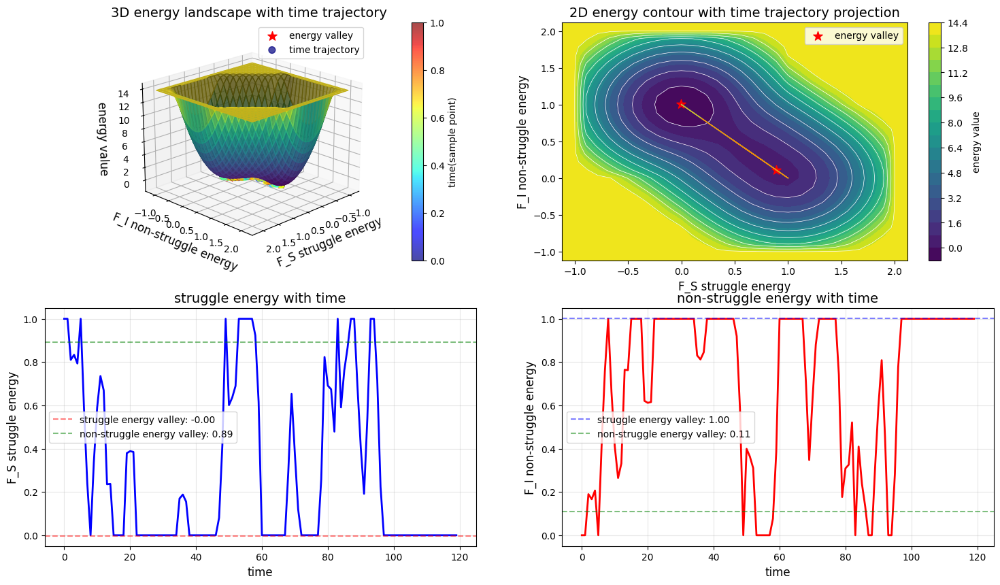

挣扎状态能量谷 (F_S, F_I): (-0.00, 1.00)
非挣扎状态能量谷 (F_S, F_I): (0.89, 0.11)
能量势垒高度: 1.2891
小鼠在挣扎状态能量谷附近的时间比例: 69.2%
小鼠在非挣扎状态能量谷附近的时间比例: 30.8%
挣扎状态与非挣扎状态之间的转换次数: 11


In [62]:
# ---------------------- 1. 数据准备 ----------------------
# 假设results_F_S和results_F_I已定义为120个时间点的数组
n_samples = len(results_F_S)  # 应为120
X = np.arange(n_samples)      # 时间轴：0~119
Y = results_F_S               # 挣扎状态能量值
Z = results_F_I               # 非挣扎状态能量值
Y_std = np.std(Y)*3
Z_std = np.std(Z)*3

# ---------------------- 2. 数据分析 ----------------------
# 计算概率密度分布
# 定义网格范围，根据数据动态调整
y_min, y_max = np.min(Y)-Y_std, np.max(Y)+Y_std
z_min, z_max = np.min(Z)-Z_std, np.max(Z)+Z_std
n_bins = 30  # 网格分辨率

y_grid = np.linspace(y_min, y_max, n_bins)
z_grid = np.linspace(z_min, z_max, n_bins)
Y_grid, Z_grid = np.meshgrid(y_grid, z_grid)

# 计算每个网格点的概率密度
# 方法：使用2D直方图统计样本分布
heatmap, xedges, yedges = np.histogram2d(Y, Z, bins=[n_bins, n_bins], 
                                         range=[[y_min, y_max], [z_min, z_max]],
                                         density=True)  # 归一化为概率密度

# 高斯平滑以获得更平滑的能量景观
sigma = 2  # 平滑系数
smooth_heatmap = gaussian_filter(heatmap.T, sigma=sigma)

# 找出能量谷（概率密度的峰值对应能量最小值区域）
# 注意：这里假设概率密度高的区域对应能量低的状态
# 找到两个主要能量谷（挣扎状态和非挣扎状态）
from scipy.signal import find_peaks

# 为了找到两个主要峰值，我们可以展平后排序
flat_density = smooth_heatmap.flatten()
sorted_indices = np.argsort(flat_density)[::-1]  # 降序排列

# 找到两个峰值的位置（对应于两个能量谷）
# 确保两个峰值之间的距离至少大于5
# 确保每个峰值点的两种能量中至少有一种能量大于等于该能量最大值的一半
min_distance = 1  # 最小距离阈值
peak_indices = []
peak_coords = []

# 计算F_S和F_I的最大值，用于能量阈值检查
y_max_value = np.max(y_grid)
z_max_value = np.max(z_grid)
energy_threshold_ratio = 0.2  # 阈值比例
y_threshold = y_max_value * energy_threshold_ratio
z_threshold = z_max_value * energy_threshold_ratio

# 遍历排序后的索引，寻找符合条件的两个峰值
for i in range(len(sorted_indices)):
    if len(peak_indices) == 0:
        # 第一个峰值，需要检查能量阈值
        current_idx = sorted_indices[i]
        current_coord = np.unravel_index(current_idx, smooth_heatmap.shape)
        current_z, current_y = current_coord
        current_F_S = y_grid[current_y]
        current_F_I = z_grid[current_z]
        
        # 检查是否至少有一种能量大于等于阈值
        if current_F_S >= y_threshold or current_F_I >= z_threshold:
            peak_indices.append(current_idx)
            peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)
    else:
        # 第二个峰值，需要检查距离和能量阈值
        current_idx = sorted_indices[i]
        current_coord = np.unravel_index(current_idx, smooth_heatmap.shape)
        current_z, current_y = current_coord
        current_F_S = y_grid[current_y]
        current_F_I = z_grid[current_z]
        
        # 检查是否至少有一种能量大于等于阈值
        if current_F_S >= y_threshold or current_F_I >= z_threshold:
            # 计算与第一个峰值的距离
            valley1_z, valley1_y = peak_coords[0][0], peak_coords[1][0]
            valley1_F_S = y_grid[valley1_y]
            valley1_F_I = z_grid[valley1_z]
            
            distance = np.sqrt((current_F_S - valley1_F_S)**2 + (current_F_I - valley1_F_I)**2)
            
            if distance >= min_distance:
                # 找到符合所有要求的第二个峰值
                peak_indices.append(current_idx)
                peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)
                break

# 如果没有找到足够距离和能量阈值的峰值，使用默认的前两个符合能量阈值的峰值
if len(peak_indices) < 2:
    print(f"警告：未找到满足所有条件的两个峰值，使用符合能量阈值的前两个峰值")
    # 重新寻找符合能量阈值的前两个峰值
    peak_indices = []
    for i in range(len(sorted_indices)):
        current_idx = sorted_indices[i]
        current_coord = np.unravel_index(current_idx, smooth_heatmap.shape)
        current_z, current_y = current_coord
        current_F_S = y_grid[current_y]
        current_F_I = z_grid[current_z]
        
        if current_F_S >= y_threshold or current_F_I >= z_threshold:
            peak_indices.append(current_idx)
            if len(peak_indices) == 2:
                break
    
    if len(peak_indices) >= 2:
        peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)
    else:
        # 如果仍然找不到，就使用默认的前两个峰值
        print("警告：未找到符合能量阈值的峰值，使用前两个最高密度点")
        peak_indices = sorted_indices[:2]
        peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)

# 挣扎状态和非挣扎状态的能量谷坐标
valley1_z, valley1_y = peak_coords[0][0], peak_coords[1][0]
valley2_z, valley2_y = peak_coords[0][1], peak_coords[1][1]

valley1_F_S = y_grid[valley1_y]
valley1_F_I = z_grid[valley1_z]
valley2_F_S = y_grid[valley2_y]
valley2_F_I = z_grid[valley2_z]

# 计算两个峰值之间的实际距离
peak_distance = np.sqrt((valley2_F_S - valley1_F_S)**2 + (valley2_F_I - valley1_F_I)**2)
print(f"两个能量谷之间的距离: {peak_distance:.2f}")
print(f"第一个峰值的F_S: {valley1_F_S:.2f}, F_I: {valley1_F_I:.2f}")
print(f"第二个峰值的F_S: {valley2_F_S:.2f}, F_I: {valley2_F_I:.2f}")
print(f"F_S阈值: {y_threshold:.2f}, F_I阈值: {z_threshold:.2f}")

# 计算能量势垒高度（两个能量谷之间的能量差）
def get_energy_value(y, z, y_grid, z_grid, smooth_heatmap):
    # 找到最接近的网格点
    y_idx = np.argmin(np.abs(y_grid - y))
    z_idx = np.argmin(np.abs(z_grid - z))
    # 返回该位置的能量值（转换为能量：密度越高，能量越低）
    return -np.log(smooth_heatmap[z_idx, y_idx] + 1e-6)

energy_valley1 = get_energy_value(valley1_F_S, valley1_F_I, y_grid, z_grid, smooth_heatmap)
energy_valley2 = get_energy_value(valley2_F_S, valley2_F_I, y_grid, z_grid, smooth_heatmap)

# 计算两个能量谷之间的势垒高度
num_points = 100  # 采样点数量
y_line = np.linspace(valley1_F_S, valley2_F_S, num_points)
z_line = np.linspace(valley1_F_I, valley2_F_I, num_points)
energy_line = [get_energy_value(y, z, y_grid, z_grid, smooth_heatmap) for y, z in zip(y_line, z_line)]

# 势垒高度是连线上的最大能量减去两个谷中的最小能量
energy_barrier = np.max(energy_line) - min(energy_valley1, energy_valley2)
print(f"第一个能量谷的能量值: {energy_valley1:.4f}")
print(f"第二个能量谷的能量值: {energy_valley2:.4f}")
print(f"能量势垒高度: {energy_barrier:.4f}")

# ---------------------- 3. 三维可视化 ----------------------
fig = plt.figure(figsize=(18, 10))

# 3D能量景观图
av1 = fig.add_subplot(221, projection='3d', elev=20, azim=45)

# 绘制概率密度表面
# 将概率密度转换为能量（密度越高，能量越低）
energy_surface = -np.log(smooth_heatmap + 1e-6)  # 添加小值避免log(0)

# 归一化能量表面用于着色
norm = Normalize(vmin=energy_surface.min(), vmax=energy_surface.max())
colors = cm.viridis(norm(energy_surface))

# 绘制3D表面
surf = av1.plot_surface(Y_grid, Z_grid, energy_surface, facecolors=colors, 
                        rstride=1, cstride=1, alpha=0.8, shade=True)

# 标注能量谷
av1.scatter([valley1_F_S, valley2_F_S], [valley1_F_I, valley2_F_I], 
            [-np.log(flat_density[peak_indices[0]] + 1e-6), 
             -np.log(flat_density[peak_indices[1]] + 1e-6)], 
            color='red', s=100, marker='*', label='energy valley')

# 绘制时间轨迹
# 计算每个点对应的能量值
point_energies = []
for y, z in zip(Y, Z):
    # 找到最接近的网格点
    y_idx = np.argmin(np.abs(y_grid - y))
    z_idx = np.argmin(np.abs(z_grid - z))
    point_energies.append(-np.log(smooth_heatmap[z_idx, y_idx] + 1e-6))

# 绘制轨迹，使用时间作为颜色渐变
colors_time = np.linspace(0, 1, n_samples)
traj = av1.scatter(Y, Z, point_energies, c=colors_time, cmap='jet', 
                   s=50, alpha=0.7, marker='o', label='time trajectory')

# 添加时间轨迹连线
av1.plot(Y, Z, point_energies, color='gray', alpha=0.3, linewidth=1)

# 添加标签和标题
av1.set_xlabel('F_S struggle energy', fontsize=12)
av1.set_ylabel('F_I non-struggle energy', fontsize=12)
av1.set_zlabel('energy value', fontsize=12)
av1.set_title('3D energy landscape with time trajectory', fontsize=14)
av1.legend()

# 添加时间颜色条
cbar = plt.colorbar(traj, ax=av1, pad=0.1)
cbar.set_label('time(sample point)', fontsize=10)

# 2D能量等高线图
av2 = fig.add_subplot(222)
contour = av2.contourf(Y_grid, Z_grid, energy_surface, 20, cmap='viridis')
av2.contour(Y_grid, Z_grid, energy_surface, 10, colors='white', linewidths=0.5)
av2.scatter([valley1_F_S, valley2_F_S], [valley1_F_I, valley2_F_I], 
            color='red', s=100, marker='*', label='energy valley')
# 绘制时间轨迹（2D投影）
for i in range(n_samples - 1):
    av2.plot([Y[i], Y[i+1]], [Z[i], Z[i+1]], color=cm.jet(colors_time[i]), 
             alpha=0.5, linewidth=1)
av2.set_xlabel('F_S struggle energy', fontsize=12)
av2.set_ylabel('F_I non-struggle energy', fontsize=12)
av2.set_title('2D energy contour with time trajectory projection', fontsize=14)
av2.legend()
plt.colorbar(contour, ax=av2, label='energy value')

# F_S能量随时间变化图
av3 = fig.add_subplot(223)
av3.plot(X, Y, 'b-', linewidth=2)
av3.axhline(y=valley1_F_S, color='r', linestyle='--', alpha=0.5, label=f'struggle energy valley: {valley1_F_S:.2f}')
av3.axhline(y=valley2_F_S, color='g', linestyle='--', alpha=0.5, label=f'non-struggle energy valley: {valley2_F_S:.2f}')
av3.set_xlabel('time', fontsize=12)
av3.set_ylabel('F_S struggle energy', fontsize=12)
av3.set_title('struggle energy with time', fontsize=14)
av3.legend()
av3.grid(True, alpha=0.3)

# F_I能量随时间变化图
av4 = fig.add_subplot(224)
av4.plot(X, Z, 'r-', linewidth=2)
av4.axhline(y=valley1_F_I, color='b', linestyle='--', alpha=0.5, label=f'struggle energy valley: {valley1_F_I:.2f}')
av4.axhline(y=valley2_F_I, color='g', linestyle='--', alpha=0.5, label=f'non-struggle energy valley: {valley2_F_I:.2f}')
av4.set_xlabel('time', fontsize=12)
av4.set_ylabel('F_I non-struggle energy', fontsize=12)
av4.set_title('non-struggle energy with time', fontsize=14)
av4.legend()
av4.grid(True, alpha=0.3)

# plt.tight_layout()
plt.savefig(path_save+'\energy_landscape.png', dpi=300, format='png', bbox_inches='tight')
plt.savefig(path_save+'\energy_landscape.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

# ---------------------- 4. 结果分析 ----------------------
print(f"挣扎状态能量谷 (F_S, F_I): ({valley1_F_S:.2f}, {valley1_F_I:.2f})")
print(f"非挣扎状态能量谷 (F_S, F_I): ({valley2_F_S:.2f}, {valley2_F_I:.2f})")
print(f"能量势垒高度: {energy_barrier:.4f}")

# 计算轨迹稳定性分析
# 计算每个时间点更接近哪个能量谷
dist_to_valley1 = np.sqrt((Y - valley1_F_S)**2 + (Z - valley1_F_I)** 2)
dist_to_valley2 = np.sqrt((Y - valley2_F_S)**2 + (Z - valley2_F_I)** 2)

# 统计在每个能量谷附近的时间比例
percent_in_valley1 = np.mean(dist_to_valley1 < dist_to_valley2) * 100
percent_in_valley2 = 100 - percent_in_valley1

print(f"小鼠在挣扎状态能量谷附近的时间比例: {percent_in_valley1:.1f}%")
print(f"小鼠在非挣扎状态能量谷附近的时间比例: {percent_in_valley2:.1f}%")

# 计算状态转换次数
transitions = np.diff(dist_to_valley1 < dist_to_valley2)
num_transitions = np.sum(np.abs(transitions))
print(f"挣扎状态与非挣扎状态之间的转换次数: {num_transitions}")

# 保存结果
results = {
    'valley1_F_S': valley1_F_S,
    'valley1_F_I': valley1_F_I,
    'valley2_F_S': valley2_F_S,
    'valley2_F_I': valley2_F_I,
    'energy_valley1':energy_valley1,
    'energy_valley2':energy_valley2,
    'energy_barrier': energy_barrier,
    'percent_in_valley1': percent_in_valley1,
    'percent_in_valley2': percent_in_valley2,
    'num_transitions': num_transitions
}

results = pd.DataFrame(results, index=[0])
results.to_csv(path_save+'\energy_landscape_results.csv')
# # 可以选择保存结果到文件
# import json
# with open(path_save+'\energy_landscape_results.json', 'w') as f:
#     json.dump(results, f, indent=4)

两个能量谷之间的距离: 0.95
第一个峰值的F_S: 0.11, F_I: 0.89
第二个峰值的F_S: 0.78, F_I: 0.22
F_S阈值: 0.21, F_I阈值: 0.21
第一个能量谷的能量值: -0.1799
第二个能量谷的能量值: -0.0957
能量势垒高度: 0.3335
最终状态的第一个峰值的F_S: -0.00, F_I: 1.00
最终状态的第二个峰值的F_S: 0.89, F_I: 0.11
最终状态的第一个能量谷的能量值: -0.0768
最终状态的第二个能量谷的能量值: -0.0668


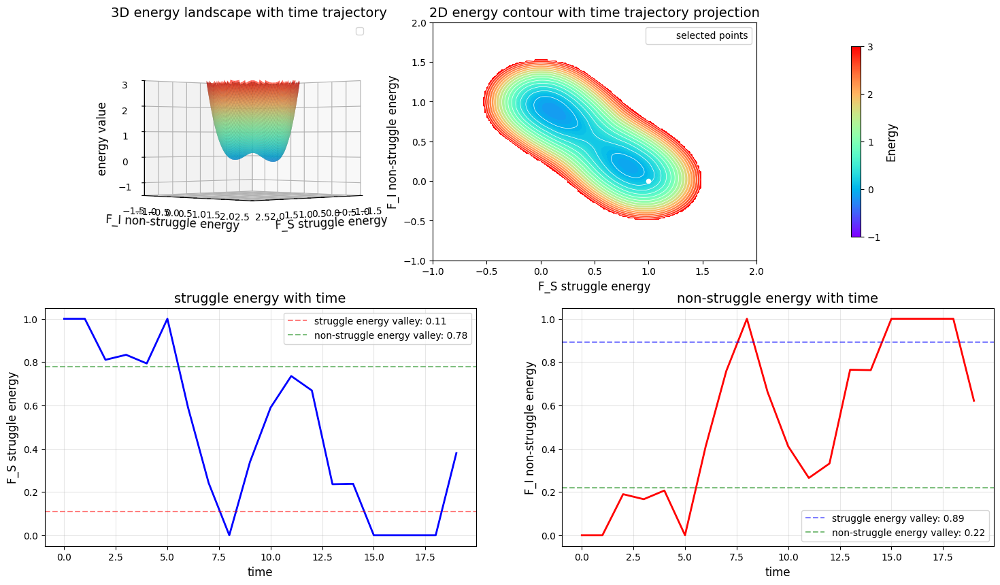

挣扎状态能量谷 (F_S, F_I): (0.11, 0.89)
非挣扎状态能量谷 (F_S, F_I): (0.78, 0.22)
能量势垒高度: 0.3335
小鼠在挣扎状态能量谷附近的时间比例: 50.0%
小鼠在非挣扎状态能量谷附近的时间比例: 50.0%
挣扎状态与非挣扎状态之间的转换次数: 3
两个能量谷之间的距离: 0.56
第一个峰值的F_S: -0.00, F_I: 1.00
第二个峰值的F_S: 0.44, F_I: 0.67
F_S阈值: 0.21, F_I阈值: 0.21
第一个能量谷的能量值: -0.6952
第二个能量谷的能量值: 0.3376
能量势垒高度: 1.0328
最终状态的第一个峰值的F_S: -0.00, F_I: 1.00
最终状态的第二个峰值的F_S: 0.89, F_I: 0.11
最终状态的第一个能量谷的能量值: -0.6952
最终状态的第二个能量谷的能量值: 0.6257


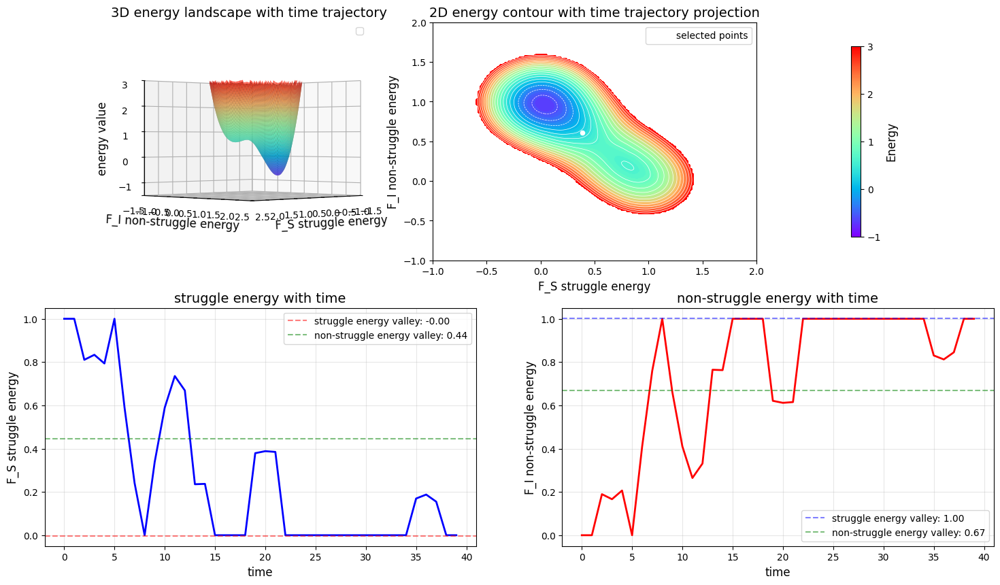

挣扎状态能量谷 (F_S, F_I): (-0.00, 1.00)
非挣扎状态能量谷 (F_S, F_I): (0.44, 0.67)
能量势垒高度: 1.0328
小鼠在挣扎状态能量谷附近的时间比例: 57.5%
小鼠在非挣扎状态能量谷附近的时间比例: 42.5%
挣扎状态与非挣扎状态之间的转换次数: 5
两个能量谷之间的距离: 1.26
第一个峰值的F_S: -0.00, F_I: 1.00
第二个峰值的F_S: 0.89, F_I: 0.11
F_S阈值: 0.21, F_I阈值: 0.21
第一个能量谷的能量值: -0.5768
第二个能量谷的能量值: 0.2882
能量势垒高度: 1.1029
最终状态的第一个峰值的F_S: -0.00, F_I: 1.00
最终状态的第二个峰值的F_S: 0.89, F_I: 0.11
最终状态的第一个能量谷的能量值: -0.5768
最终状态的第二个能量谷的能量值: 0.2882


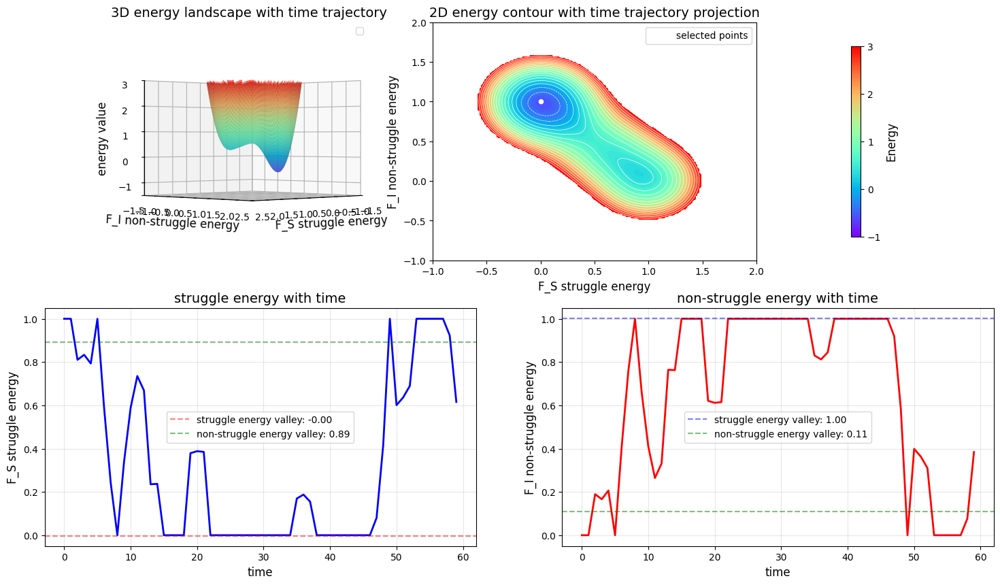

挣扎状态能量谷 (F_S, F_I): (-0.00, 1.00)
非挣扎状态能量谷 (F_S, F_I): (0.89, 0.11)
能量势垒高度: 1.1029
小鼠在挣扎状态能量谷附近的时间比例: 65.0%
小鼠在非挣扎状态能量谷附近的时间比例: 35.0%
挣扎状态与非挣扎状态之间的转换次数: 4
两个能量谷之间的距离: 1.26
第一个峰值的F_S: -0.00, F_I: 1.00
第二个峰值的F_S: 0.89, F_I: 0.11
F_S阈值: 0.21, F_I阈值: 0.21
第一个能量谷的能量值: -0.6888
第二个能量谷的能量值: 0.4920
能量势垒高度: 1.3236
最终状态的第一个峰值的F_S: -0.00, F_I: 1.00
最终状态的第二个峰值的F_S: 0.89, F_I: 0.11
最终状态的第一个能量谷的能量值: -0.6888
最终状态的第二个能量谷的能量值: 0.4920


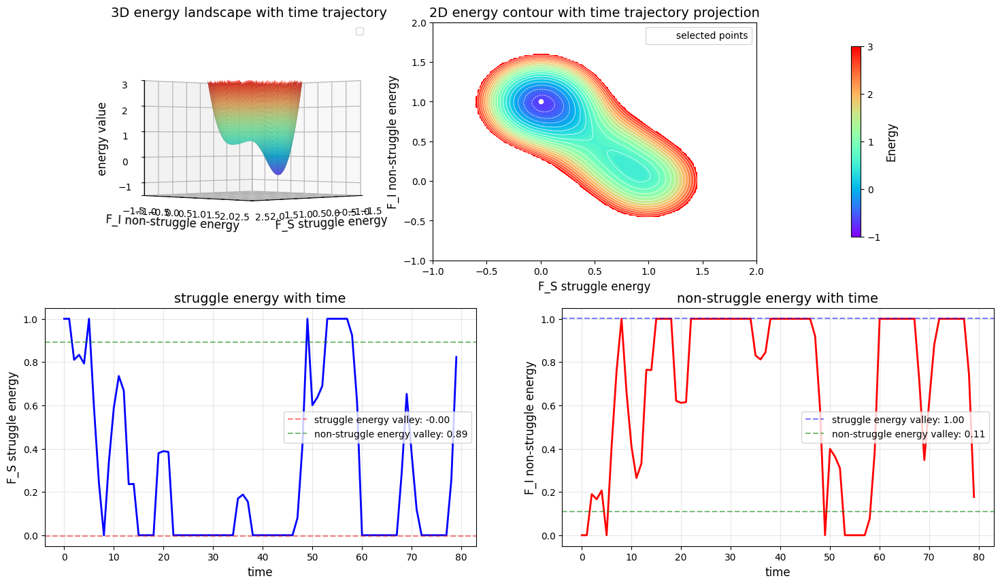

挣扎状态能量谷 (F_S, F_I): (-0.00, 1.00)
非挣扎状态能量谷 (F_S, F_I): (0.89, 0.11)
能量势垒高度: 1.3236
小鼠在挣扎状态能量谷附近的时间比例: 71.2%
小鼠在非挣扎状态能量谷附近的时间比例: 28.8%
挣扎状态与非挣扎状态之间的转换次数: 8
两个能量谷之间的距离: 1.26
第一个峰值的F_S: -0.00, F_I: 1.00
第二个峰值的F_S: 0.89, F_I: 0.11
F_S阈值: 0.21, F_I阈值: 0.21
第一个能量谷的能量值: -0.5436
第二个能量谷的能量值: 0.2800
能量势垒高度: 0.9739
最终状态的第一个峰值的F_S: -0.00, F_I: 1.00
最终状态的第二个峰值的F_S: 0.89, F_I: 0.11
最终状态的第一个能量谷的能量值: -0.5436
最终状态的第二个能量谷的能量值: 0.2800


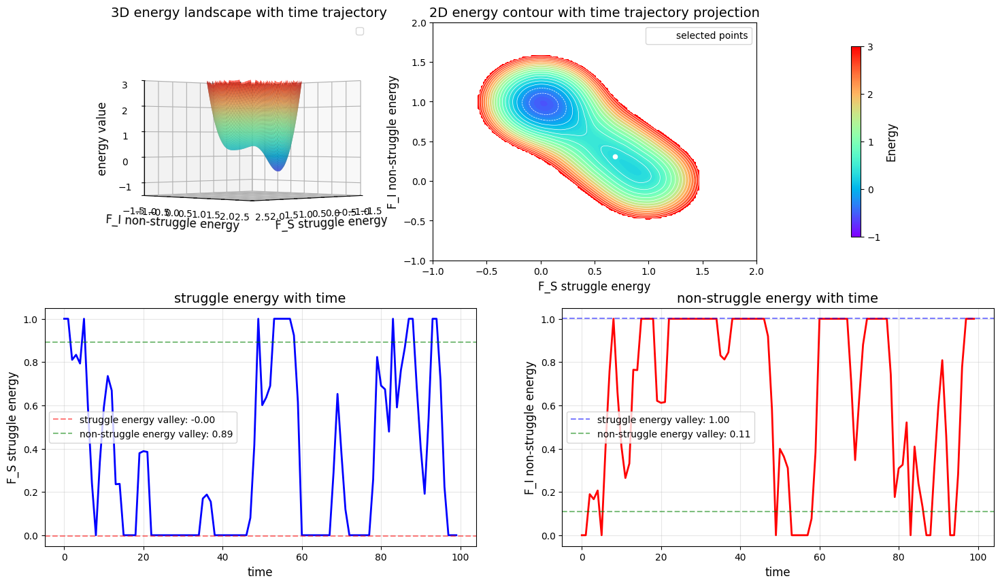

挣扎状态能量谷 (F_S, F_I): (-0.00, 1.00)
非挣扎状态能量谷 (F_S, F_I): (0.89, 0.11)
能量势垒高度: 0.9739
小鼠在挣扎状态能量谷附近的时间比例: 63.0%
小鼠在非挣扎状态能量谷附近的时间比例: 37.0%
挣扎状态与非挣扎状态之间的转换次数: 11
两个能量谷之间的距离: 1.26
第一个峰值的F_S: -0.00, F_I: 1.00
第二个峰值的F_S: 0.89, F_I: 0.11
F_S阈值: 0.21, F_I阈值: 0.21
第一个能量谷的能量值: -0.6956
第二个能量谷的能量值: 0.4623
能量势垒高度: 1.2891
最终状态的第一个峰值的F_S: -0.00, F_I: 1.00
最终状态的第二个峰值的F_S: 0.89, F_I: 0.11
最终状态的第一个能量谷的能量值: -0.6956
最终状态的第二个能量谷的能量值: 0.4623


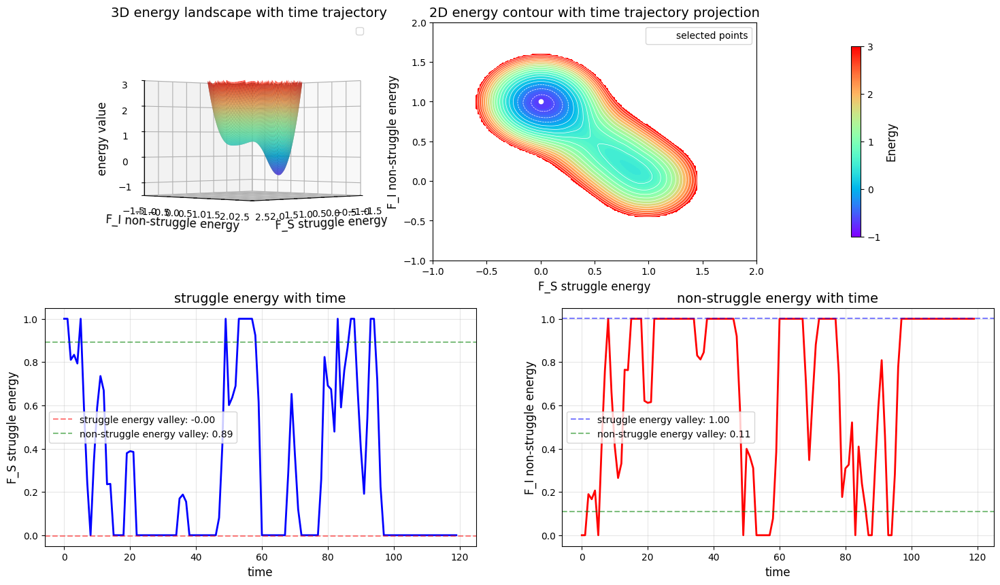

挣扎状态能量谷 (F_S, F_I): (-0.00, 1.00)
非挣扎状态能量谷 (F_S, F_I): (0.89, 0.11)
能量势垒高度: 1.2891
小鼠在挣扎状态能量谷附近的时间比例: 69.2%
小鼠在非挣扎状态能量谷附近的时间比例: 30.8%
挣扎状态与非挣扎状态之间的转换次数: 11


In [63]:
result_total = results.copy()
Final_valley1_F_S = result_total['valley1_F_S'][0]
Final_valley1_F_I = result_total['valley1_F_I'][0]
Final_valley2_F_S = result_total['valley2_F_S'][0]
Final_valley2_F_I = result_total['valley2_F_I'][0]
energy_valleys = {
    'valley1_F_S': [],
    'valley1_F_I': [],
    'valley2_F_S': [],
    'valley2_F_I': [],
    'energy_valley1': [],
    'energy_valley2': [],
    'energy_barrier': [],
    'Final_valley1_F_S': [],
    'Final_valley1_F_I': [],
    'Final_valley2_F_S': [],
    'Final_valley2_F_I': [],
    'Final_energy_valley1': [],
    'Final_energy_valley2': [],
}
for nn_num in range(1,7):
    num_section = nn_num * 20
    # if nn_num == 1:
    num = num_section-20
    # for num in range(num_section-20,num_section):
    # ---------------------- 1. 数据准备 ----------------------
    # 假设results_F_S和results_F_I已定义为120个时间点的数组
    n_samples = num_section  # 应为120
    X = np.arange(num_section)      # 时间轴：0~119
    Y = results_F_S[:num_section]               # 挣扎状态能量值
    Z = results_F_I[:num_section]               # 非挣扎状态能量值
    Y_std = np.std(results_F_S)*3
    Z_std = np.std(results_F_I)*3

    # ---------------------- 2. 数据分析 ----------------------
    # 计算概率密度分布
    # 定义网格范围，根据数据动态调整
    # y_min, y_max = np.min(Y) - Y_std, np.max(Y) + Y_std
    # z_min, z_max = np.min(Z) - Z_std, np.max(Z) + Z_std
    y_min, y_max = np.min(results_F_S) - Y_std, np.max(results_F_S) + Y_std
    z_min, z_max = np.min(results_F_I) - Z_std, np.max(results_F_I) + Z_std
    n_bins = 30  # 网格分辨率

    y_grid = np.linspace(y_min, y_max, n_bins)
    z_grid = np.linspace(z_min, z_max, n_bins)
    Y_grid, Z_grid = np.meshgrid(y_grid, z_grid)

    # 计算每个网格点的概率密度
    # 方法：使用2D直方图统计样本分布
    heatmap, xedges, yedges = np.histogram2d(Y, Z, bins=[n_bins, n_bins], 
                                            range=[[y_min, y_max], [z_min, z_max]],
                                            density=True)  # 归一化为概率密度

    # 高斯平滑以获得更平滑的能量景观
    sigma = 2  # 平滑系数
    smooth_heatmap = gaussian_filter(heatmap.T, sigma=sigma)

    # 找出能量谷（概率密度的峰值对应能量最小值区域）
    # 注意：这里假设概率密度高的区域对应能量低的状态
    # 找到两个主要能量谷（挣扎状态和非挣扎状态）
    from scipy.signal import find_peaks

    # # 为了找到两个主要峰值，我们可以展平后排序
    # flat_density = smooth_heatmap.flatten()
    # sorted_indices = np.argsort(flat_density)[::-1]  # 降序排列

    # # 找到两个峰值的位置（对应于两个能量谷）
    # peak_indices = sorted_indices[:2]  # 取前两个最高密度点
    # peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)

    # # 挣扎状态和非挣扎状态的能量谷坐标
    # # 这里需要根据实际数据判断哪个是挣扎状态，哪个是非挣扎状态
    # # 假设F_S能量较低的为挣扎状态能量谷
    # valley1_z, valley1_y = peak_coords[0][0], peak_coords[1][0]
    # valley2_z, valley2_y = peak_coords[0][1], peak_coords[1][1]

    # valley1_F_S = y_grid[valley1_y]
    # valley1_F_I = z_grid[valley1_z]
    # valley2_F_S = y_grid[valley2_y]
    # valley2_F_I = z_grid[valley2_z]

    # # 计算能量势垒高度（两个能量谷之间的差异）
    # energy_barrier = np.abs(smooth_heatmap.max() - np.min(smooth_heatmap))

    # 为了找到两个主要峰值，我们可以展平后排序
    flat_density = smooth_heatmap.flatten()
    sorted_indices = np.argsort(flat_density)[::-1]  # 降序排列

    # 找到两个峰值的位置（对应于两个能量谷）
    # 确保两个峰值之间的距离至少大于5
    # 确保每个峰值点的两种能量中至少有一种能量大于等于该能量最大值的一半
    min_distance = 0.5  # 最小距离阈值
    peak_indices = []
    peak_coords = []

    # 计算F_S和F_I的最大值，用于能量阈值检查
    y_max_value = np.max(y_grid)
    z_max_value = np.max(z_grid)
    energy_threshold_ratio = 0.1  # 阈值比例
    y_threshold = y_max_value * energy_threshold_ratio
    z_threshold = z_max_value * energy_threshold_ratio

    # 遍历排序后的索引，寻找符合条件的两个峰值
    for i in range(len(sorted_indices)):
        if len(peak_indices) == 0:
            # 第一个峰值，需要检查能量阈值
            current_idx = sorted_indices[i]
            current_coord = np.unravel_index(current_idx, smooth_heatmap.shape)
            current_z, current_y = current_coord
            current_F_S = y_grid[current_y]
            current_F_I = z_grid[current_z]
            
            # 检查是否至少有一种能量大于等于阈值
            if current_F_S >= y_threshold or current_F_I >= z_threshold:
                peak_indices.append(current_idx)
                peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)
        else:
            # 第二个峰值，需要检查距离和能量阈值
            current_idx = sorted_indices[i]
            current_coord = np.unravel_index(current_idx, smooth_heatmap.shape)
            current_z, current_y = current_coord
            current_F_S = y_grid[current_y]
            current_F_I = z_grid[current_z]
            
            # 检查是否至少有一种能量大于等于阈值
            if current_F_S >= y_threshold or current_F_I >= z_threshold:
                # 计算与第一个峰值的距离
                valley1_z, valley1_y = peak_coords[0][0], peak_coords[1][0]
                valley1_F_S = y_grid[valley1_y]
                valley1_F_I = z_grid[valley1_z]
                
                distance = np.sqrt((current_F_S - valley1_F_S)**2 + (current_F_I - valley1_F_I)**2)
                
                if distance >= min_distance:
                    # 找到符合所有要求的第二个峰值
                    peak_indices.append(current_idx)
                    peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)
                    break

    # 如果没有找到足够距离和能量阈值的峰值，使用默认的前两个符合能量阈值的峰值
    if len(peak_indices) < 2:
        print(f"警告：未找到满足所有条件的两个峰值，使用符合能量阈值的前两个峰值")
        # 重新寻找符合能量阈值的前两个峰值
        peak_indices = []
        for i in range(len(sorted_indices)):
            current_idx = sorted_indices[i]
            current_coord = np.unravel_index(current_idx, smooth_heatmap.shape)
            current_z, current_y = current_coord
            current_F_S = y_grid[current_y]
            current_F_I = z_grid[current_z]
            
            if current_F_S >= y_threshold or current_F_I >= z_threshold:
                peak_indices.append(current_idx)
                if len(peak_indices) == 2:
                    break
        
        if len(peak_indices) >= 2:
            peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)
        else:
            # 如果仍然找不到，就使用默认的前两个峰值
            print("警告：未找到符合能量阈值的峰值，使用前两个最高密度点")
            peak_indices = sorted_indices[:2]
            peak_coords = np.unravel_index(peak_indices, smooth_heatmap.shape)

    # 挣扎状态和非挣扎状态的能量谷坐标
    valley1_z, valley1_y = peak_coords[0][0], peak_coords[1][0]
    valley2_z, valley2_y = peak_coords[0][1], peak_coords[1][1]

    valley1_F_S = y_grid[valley1_y]
    valley1_F_I = z_grid[valley1_z]
    valley2_F_S = y_grid[valley2_y]
    valley2_F_I = z_grid[valley2_z]

    # 计算两个峰值之间的实际距离
    peak_distance = np.sqrt((valley2_F_S - valley1_F_S)**2 + (valley2_F_I - valley1_F_I)**2)
    print(f"两个能量谷之间的距离: {peak_distance:.2f}")
    print(f"第一个峰值的F_S: {valley1_F_S:.2f}, F_I: {valley1_F_I:.2f}")
    print(f"第二个峰值的F_S: {valley2_F_S:.2f}, F_I: {valley2_F_I:.2f}")
    print(f"F_S阈值: {y_threshold:.2f}, F_I阈值: {z_threshold:.2f}")

    # 计算能量势垒高度（两个能量谷之间的能量差）
    def get_energy_value(y, z, y_grid, z_grid, smooth_heatmap):
        # 找到最接近的网格点
        y_idx = np.argmin(np.abs(y_grid - y))
        z_idx = np.argmin(np.abs(z_grid - z))
        # 返回该位置的能量值（转换为能量：密度越高，能量越低）
        return -np.log(smooth_heatmap[z_idx, y_idx] + 1e-6)

    energy_valley1 = get_energy_value(valley1_F_S, valley1_F_I, y_grid, z_grid, smooth_heatmap)
    energy_valley2 = get_energy_value(valley2_F_S, valley2_F_I, y_grid, z_grid, smooth_heatmap)
    Final_energy_valley1 = get_energy_value(Final_valley1_F_S, Final_valley1_F_I, y_grid, z_grid, smooth_heatmap)
    Final_energy_valley2 = get_energy_value(Final_valley2_F_S, Final_valley2_F_I, y_grid, z_grid, smooth_heatmap)

    # 计算两个能量谷之间的势垒高度
    num_points = 100  # 采样点数量
    y_line = np.linspace(valley1_F_S, valley2_F_S, num_points)
    z_line = np.linspace(valley1_F_I, valley2_F_I, num_points)
    energy_line = [get_energy_value(y, z, y_grid, z_grid, smooth_heatmap) for y, z in zip(y_line, z_line)]

    # 势垒高度是连线上的最大能量减去两个谷中的最小能量
    energy_barrier = np.max(energy_line) - min(energy_valley1, energy_valley2)
    print(f"第一个能量谷的能量值: {energy_valley1:.4f}")
    print(f"第二个能量谷的能量值: {energy_valley2:.4f}")
    print(f"能量势垒高度: {energy_barrier:.4f}")
    print(f"最终状态的第一个峰值的F_S: {Final_valley1_F_S:.2f}, F_I: {Final_valley1_F_I:.2f}")
    print(f"最终状态的第二个峰值的F_S: {Final_valley2_F_S:.2f}, F_I: {Final_valley2_F_I:.2f}")
    print(f"最终状态的第一个能量谷的能量值: {Final_energy_valley1:.4f}")
    print(f"最终状态的第二个能量谷的能量值: {Final_energy_valley2:.4f}")

    # ---------------------- 3. 三维可视化 ----------------------
    fig = plt.figure(figsize=(18, 10))
    # 不再基于数据计算范围，而是直接指定 vmin=-1, vmax=3
    fixed_norm = Normalize(vmin=-1, vmax=3)

    # 3D能量景观图
    av1 = fig.add_subplot(221, projection='3d')
    av1.view_init(elev=0, azim=45)

    # 绘制概率密度表面
    # 将概率密度转换为能量（密度越高，能量越低）
    energy_surface = -np.log(smooth_heatmap + 1e-6)  # 添加小值避免log(0)

    # 创建更密集的网格
    n_points_dense = 200
    Y_dense, Z_dense = np.meshgrid(
        np.linspace(y_min, y_max, n_points_dense),
        np.linspace(z_min, z_max, n_points_dense)
    )

    points = np.column_stack([Y_grid.ravel(), Z_grid.ravel()])
    values = energy_surface.ravel()
    energy_dense = griddata(points, values, (Y_dense, Z_dense), method='cubic')

    mask = energy_dense > 3

    # 2. 将蒙版中为 True 的位置的能量值设置为 np.nan
    energy_dense_masked = energy_dense.copy()
    energy_dense_masked[mask] = np.nan

    # # 2. 基于蒙版后的数据计算新的归一化范围
    # #    使用 np.nanmin 和 np.nanmax 来自动忽略 NaN 值
    # masked_vmin = np.nanmin(energy_dense_masked)
    # masked_vmax = np.nanmax(energy_dense_masked)
    # norm_masked = Normalize(vmin=masked_vmin, vmax=masked_vmax)



    # 3. 基于蒙版后的能量数据计算颜色
    # norm = Normalize(vmin=energy_surface.min(), vmax=energy_surface.max())
    # colors_masked = cm.rainbow(norm(energy_dense_masked))

    # colors_masked = cm.rainbow(norm_masked(energy_dense_masked))
    colors_masked = cm.rainbow(fixed_norm(energy_dense_masked))

    # 绘制3D表面 (使用蒙版后的数据和颜色)
    surf = av1.plot_surface(Y_dense, Z_dense, energy_dense_masked, facecolors=colors_masked,
                    rstride=1, cstride=1, alpha=0.8, shade=True, edgecolor='none')

    # # 标注能量谷
    # av1.scatter([valley1_F_S, valley2_F_S], [valley1_F_I, valley2_F_I], 
    #             [-np.log(flat_density[peak_indices[0]] + 1e-6), 
    #             -np.log(flat_density[peak_indices[1]] + 1e-6)], 
    #             color='red', s=100, marker='*', label='energy valley')

    # 绘制时间轨迹
    # 计算每个点对应的能量值
    point_energies = []
    for y, z in zip(Y, Z):
        # 找到最接近的网格点
        y_idx = np.argmin(np.abs(y_grid - y))
        z_idx = np.argmin(np.abs(z_grid - z))
        point_energies.append(-np.log(smooth_heatmap[z_idx, y_idx] + 1e-6))

    # # 绘制轨迹，使用时间作为颜色渐变
    # colors_time = np.linspace(0, 1, n_samples)
    # traj = av1.scatter(Y, Z, point_energies, c=colors_time, cmap='jet', 
    #                    s=50, alpha=0.7, marker='o', label='time trajectory')

    # 添加时间轨迹连线
    # av1.plot(Y, Z, point_energies, color='gray', alpha=0.3, linewidth=1)

    # 添加标签和标题
    av1.set_xlabel('F_S struggle energy', fontsize=12)
    av1.set_ylabel('F_I non-struggle energy', fontsize=12)
    av1.set_zlabel('energy value', fontsize=12)
    av1.set_title('3D energy landscape with time trajectory', fontsize=14)
    av1.legend()
    # 可以设置坐标轴范围以便更好地观察
    av1.set_xlim([-1.5, 2.5])
    av1.set_ylim([-1.5, 2.5])
    av1.set_zlim([-1.5, 3.0])

    # # 为3D图添加颜色条
    # # sm = cm.ScalarMappable(cmap=cm.rainbow, norm=norm_masked)
    # sm = cm.ScalarMappable(cmap=cm.rainbow, norm=fixed_norm)
    # sm.set_array([])
    # cbar1 = fig.colorbar(sm, ax=av1, pad=0.1)
    # cbar1.set_label('Energy', fontsize=12)
    # cbar1.set_ticks([-1, 0, 1, 2, 3])

    # # 添加时间颜色条
    # cbar = plt.colorbar(traj, ax=av1, pad=0.1)
    # cbar.set_label('time(sample point)', fontsize=10)

    # 2D能量等高线图
    av2 = fig.add_subplot(222)

    # 在绘制等高线图之前，手动将能量值限制在 [-1, 3] 范围内
    # np.clip 会将小于-1的值设为-1，大于3的值设为3
    energy_dense_clamped = np.clip(energy_dense_masked, -1.0, 3.0)

    # contour = av2.contourf(Y_dense, Z_dense, energy_dense_masked, 60, cmap='rainbow', norm=norm_masked)
    # contour = av2.contourf(Y_dense, Z_dense, energy_dense_masked, 60, cmap='rainbow', norm=fixed_norm)
    contour = av2.contourf(Y_dense, Z_dense, energy_dense_clamped, 60, cmap='rainbow', norm=fixed_norm)
    # av2.contour(Y_dense, Z_dense, energy_dense_masked, 20, colors='white', linewidths=0.5)
    av2.contour(Y_dense, Z_dense, energy_dense_clamped, 20, colors='white', linewidths=0.5)
    # av2.scatter([valley1_F_S, valley2_F_S], [valley1_F_I, valley2_F_I], 
    #             color='red', s=100, marker='*', label='energy valley')

    # num = 76
    # av2.scatter(Y[0:30] , Z[0:30], color=cm.jet(np.linspace(0, 1, 30)), s=20, marker='o', label='selected points')
    av2.scatter(Y[num] , Z[num], color='white', s=20, marker='o', label='selected points')
    # # 绘制时间轨迹（2D投影）
    # for i in range(n_samples - 1):
    #     av2.plot([Y[i], Y[i+1]], [Z[i], Z[i+1]], color=cm.jet(colors_time[i]), 
    #              alpha=0.5, linewidth=1)
    av2.set_xlim([-1, 2])
    av2.set_ylim([-1, 2])
    av2.set_xlabel('F_S struggle energy', fontsize=12)
    av2.set_ylabel('F_I non-struggle energy', fontsize=12)
    av2.set_title('2D energy contour with time trajectory projection', fontsize=14)
    av2.legend()
    # plt.colorbar(contour, ax=av2, label='energy value')
    # 基于2D图的contour创建colorbar，指定ax=[av1, av2]实现双图共享
    sm = cm.ScalarMappable(cmap=cm.rainbow, norm=fixed_norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=[av1, av2], pad=0.1, shrink=0.8)  # shrink调整长度适配双图
    cbar.set_label('Energy', fontsize=12)
    cbar.set_ticks([-1, 0, 1, 2, 3])  # 等间隔刻度

    # F_S能量随时间变化图
    av3 = fig.add_subplot(223)
    av3.plot(X, Y, 'b-', linewidth=2)
    av3.axhline(y=valley1_F_S, color='r', linestyle='--', alpha=0.5, label=f'struggle energy valley: {valley1_F_S:.2f}')
    av3.axhline(y=valley2_F_S, color='g', linestyle='--', alpha=0.5, label=f'non-struggle energy valley: {valley2_F_S:.2f}')
    av3.set_xlabel('time', fontsize=12)
    av3.set_ylabel('F_S struggle energy', fontsize=12)
    av3.set_title('struggle energy with time', fontsize=14)
    av3.legend()
    av3.grid(True, alpha=0.3)

    # F_I能量随时间变化图
    av4 = fig.add_subplot(224)
    av4.plot(X, Z, 'r-', linewidth=2)
    av4.axhline(y=valley1_F_I, color='b', linestyle='--', alpha=0.5, label=f'struggle energy valley: {valley1_F_I:.2f}')
    av4.axhline(y=valley2_F_I, color='g', linestyle='--', alpha=0.5, label=f'non-struggle energy valley: {valley2_F_I:.2f}')
    av4.set_xlabel('time', fontsize=12)
    av4.set_ylabel('F_I non-struggle energy', fontsize=12)
    av4.set_title('non-struggle energy with time', fontsize=14)
    av4.legend()
    av4.grid(True, alpha=0.3)

    # plt.tight_layout()
    plt.savefig(path_save+f'\energy_landscape_{nn_num}_{num}.png', dpi=300, format='png', bbox_inches='tight')
    plt.savefig(path_save+f'\energy_landscape_{nn_num}_{num}.pdf', dpi=300, format='pdf', bbox_inches='tight')
    plt.show()
    plt.close()

    # ---------------------- 4. 结果分析 ----------------------
    print(f"挣扎状态能量谷 (F_S, F_I): ({valley1_F_S:.2f}, {valley1_F_I:.2f})")
    print(f"非挣扎状态能量谷 (F_S, F_I): ({valley2_F_S:.2f}, {valley2_F_I:.2f})")
    print(f"能量势垒高度: {energy_barrier:.4f}")

    # 计算轨迹稳定性分析
    # 计算每个时间点更接近哪个能量谷
    dist_to_valley1 = np.sqrt((Y - valley1_F_S)**2 + (Z - valley1_F_I)** 2)
    dist_to_valley2 = np.sqrt((Y - valley2_F_S)**2 + (Z - valley2_F_I)** 2)

    # 统计在每个能量谷附近的时间比例
    percent_in_valley1 = np.mean(dist_to_valley1 < dist_to_valley2) * 100
    percent_in_valley2 = 100 - percent_in_valley1

    print(f"小鼠在挣扎状态能量谷附近的时间比例: {percent_in_valley1:.1f}%")
    print(f"小鼠在非挣扎状态能量谷附近的时间比例: {percent_in_valley2:.1f}%")

    # 计算状态转换次数
    transitions = np.diff(dist_to_valley1 < dist_to_valley2)
    num_transitions = np.sum(np.abs(transitions))
    print(f"挣扎状态与非挣扎状态之间的转换次数: {num_transitions}")

    # 保存结果
    results = {
        'valley1_F_S': valley1_F_S,
        'valley1_F_I': valley1_F_I,
        'valley2_F_S': valley2_F_S,
        'valley2_F_I': valley2_F_I,
        'energy_valley1':energy_valley1,
        'energy_valley2':energy_valley2,
        'energy_barrier': energy_barrier,
        'percent_in_valley1': percent_in_valley1,
        'percent_in_valley2': percent_in_valley2,
        'num_transitions': num_transitions,
        'Final_valley1_F_S': Final_valley1_F_S,
        'Final_valley1_F_I': Final_valley1_F_I,
        'Final_valley2_F_S': Final_valley2_F_S,
        'Final_valley2_F_I': Final_valley2_F_I,
        'Final_energy_valley1': Final_energy_valley1,
        'Final_energy_valley2': Final_energy_valley2,
    }

    # results = pd.DataFrame(results, index=[0])
    # results.to_csv(path_save+'\energy_landscape_results.csv')

    # # 可以选择保存结果到文件
    # import json
    # with open(path_save+'\energy_landscape_results.json', 'w') as f:
    #     json.dump(results, f, indent=4)

    energy_valleys['valley1_F_S'].append(valley1_F_S)
    energy_valleys['valley1_F_I'].append(valley1_F_I)
    energy_valleys['valley2_F_S'].append(valley2_F_S)
    energy_valleys['valley2_F_I'].append(valley2_F_I)
    energy_valleys['energy_valley1'].append(energy_valley1)
    energy_valleys['energy_valley2'].append(energy_valley2)
    energy_valleys['energy_barrier'].append(energy_barrier)
    energy_valleys['Final_valley1_F_S'].append(Final_valley1_F_S)
    energy_valleys['Final_valley1_F_I'].append(Final_valley1_F_I)
    energy_valleys['Final_valley2_F_S'].append(Final_valley2_F_S)
    energy_valleys['Final_valley2_F_I'].append(Final_valley2_F_I)
    energy_valleys['Final_energy_valley1'].append(Final_energy_valley1)
    energy_valleys['Final_energy_valley2'].append(Final_energy_valley2)

energy_valleys = pd.DataFrame(energy_valleys)
energy_valleys.to_csv(path_save+'\energy_landscape_results_m.csv')


In [64]:
results_P_S = results_probility['P_S_norm']
results_P_I = results_probility['P_I_norm']

In [65]:
# 函数：根据results_P_S和results_P_I生成状态结果
def generate_state_from_probability(results_P_S, results_P_I):
    """
    根据struggle和immobility状态概率生成状态结果
    如果results_P_S > results_P_I: 赋值为1
    如果results_P_S < results_P_I: 赋值为0
    如果results_P_S == results_P_I: 根据前一个状态结果赋值
    """
    states = np.zeros_like(results_P_S, dtype=int)
    
    # 处理第一个状态（如果相等，默认为0）
    if results_P_S[0] > results_P_I[0]:
        states[0] = 1
    elif results_P_S[0] < results_P_I[0]:
        states[0] = 0
    else:
        # 默认值，也可以根据需要修改
        states[0] = 0
    
    # 处理剩余状态
    for i in range(1, len(results_P_S)):
        if results_P_S[i] > results_P_I[i]:
            states[i] = 1
        elif results_P_S[i] < results_P_I[i]:
            states[i] = 0
        else:
            # 与前一个状态保持一致
            states[i] = states[i-1]
    
    return states

# 函数：将行为数据按30帧分段并生成状态结果
def segment_behaviour_data(behaviour_data, segment_length=30):
    """
    将行为数据按指定长度分段
    每段的平均值≥0.5则为1（挣扎），否则为0（非挣扎）
    """
    # 检查输入类型并转换为NumPy数组
    if isinstance(behaviour_data, pd.DataFrame):
        # 如果是DataFrame，转换为NumPy数组并确保一维
        behaviour_data = behaviour_data.values.flatten()
    elif isinstance(behaviour_data, pd.Series):
        # 如果是Series，转换为NumPy数组
        behaviour_data = behaviour_data.values
    elif isinstance(behaviour_data, np.ndarray):
        # 如果已经是NumPy数组，确保一维
        if len(behaviour_data.shape) > 1:
            behaviour_data = behaviour_data.flatten()
    else:
        # 其他类型尝试转换为NumPy数组
        try:
            behaviour_data = np.array(behaviour_data).flatten()
        except:
            raise TypeError("不支持的行为数据类型，请提供NumPy数组、pandas DataFrame或Series")
    
    n_frames = len(behaviour_data)
    n_segments = (n_frames + segment_length - 1) // segment_length  # 向上取整
    segment_states = []
    
    for i in range(n_segments):
        start_idx = i * segment_length
        end_idx = min((i + 1) * segment_length, n_frames)
        segment = behaviour_data[start_idx:end_idx]
        
        # 计算平均值并判断状态
        avg_value = np.mean(segment)
        if avg_value >= 0.5:
            segment_states.append(1)
        else:
            segment_states.append(0)
    
    return np.array(segment_states)

# 函数：计算两种状态结果的准确率
def calculate_accuracy(predicted_states, true_states):
    """
    计算预测状态与真实状态的准确率
    """
    # 确保两种状态数组长度一致
    min_length = min(len(predicted_states), len(true_states))
    predicted_states = predicted_states[:min_length]
    true_states = true_states[:min_length]
    
    # 计算相同状态的数量
    correct_count = np.sum(predicted_states == true_states)
    
    # 计算准确率
    accuracy = correct_count / min_length

    # 计算当prob_states为1时，behaviour_states也为1的概率（精确率）
    prob_1_count = np.sum(predicted_states == 1)
    if prob_1_count == 0:
        prob_1_precision = 0  # 避免除以零
    else:
        true_positive = np.sum((predicted_states == 1) & (true_states == 1))
        prob_1_precision = true_positive / prob_1_count
    
    return accuracy, prob_1_precision


probability_states = generate_state_from_probability(results_P_S, results_P_I)
# print(f"根据概率生成的状态结果前10个值: {probability_states[:10]}")

# 2. 对行为数据进行分段处理
behaviour_states = segment_behaviour_data(behaviour_im_with_head)
# print(f"行为数据分段后的状态结果前10个值: {behaviour_states[:10]}")
print(f"行为数据分段后的状态结果总数量: {len(behaviour_states)}")

# 3. 计算准确率
accuracy,prob_1_precision  = calculate_accuracy(probability_states, behaviour_states)
print(f"准确率: {accuracy:.4f}")
print(f"当概率方法判断为挣扎(1)时，行为数据也判断为挣扎的概率: {prob_1_precision:.4f}")

# 额外信息：统计两种状态的分布
prob_state_counts = np.bincount(probability_states)
behav_state_counts = np.bincount(behaviour_states)

print(f"概率状态分布 - 非挣扎(0): {prob_state_counts[0]}, 挣扎(1): {prob_state_counts[1]}")
print(f"行为状态分布 - 非挣扎(0): {behav_state_counts[0]}, 挣扎(1): {behav_state_counts[1]}")

result_p = {
    "accuracy": accuracy,
    "prob_1_precision": prob_1_precision,
}

result_p = pd.DataFrame(result_p, index=[0])
result_p.to_csv(path_save+r'\accuracy_and_prob_1_precision.csv')

行为数据分段后的状态结果总数量: 120
准确率: 0.7083
当概率方法判断为挣扎(1)时，行为数据也判断为挣扎的概率: 0.8056
概率状态分布 - 非挣扎(0): 84, 挣扎(1): 36
行为状态分布 - 非挣扎(0): 63, 挣扎(1): 57


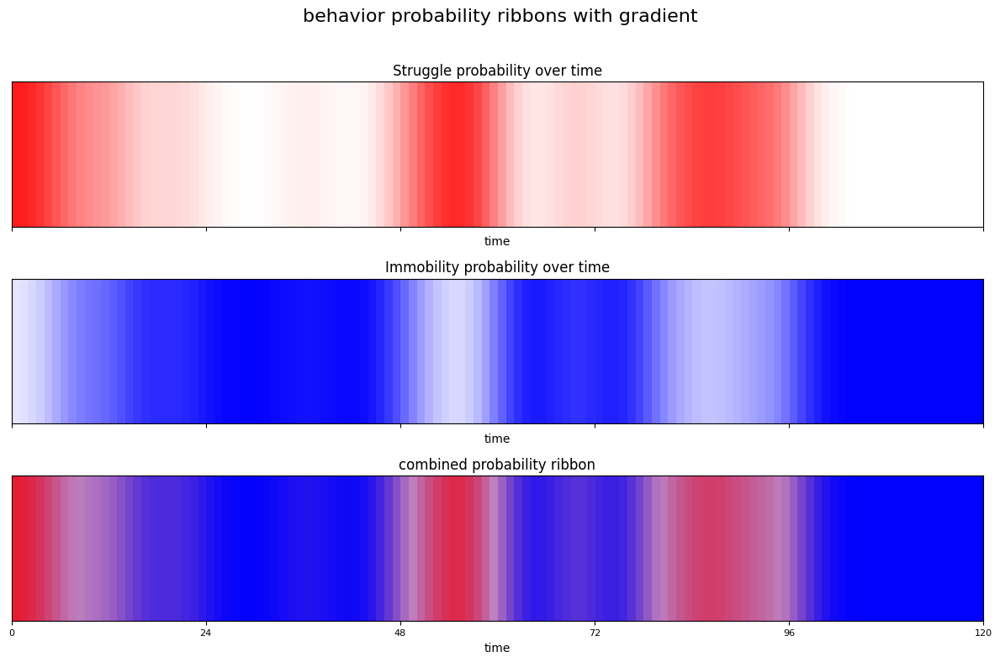

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.ndimage import gaussian_filter1d

# 函数：创建用于可视化的二维数组，其中每一列代表一个时间点，颜色和透明度表示概率
# 添加了平滑渐变效果

def create_color_array_with_gradient(prob_array, color, height=20, gradient_sigma=1.0):
    """
    创建用于可视化的二维数组，其中每一列代表一个时间点，添加平滑渐变效果
    prob_array: 概率数组
    color: 基本颜色 (r, g, b) 元组
    height: 色带的高度（像素）
    gradient_sigma: 高斯平滑的sigma参数，控制渐变程度
    """
    # 使用高斯滤波创建平滑的概率数组
    smoothed_probs = gaussian_filter1d(prob_array, sigma=gradient_sigma)
    
    # 创建一个(height, len(prob_array))的数组
    color_data = np.zeros((height, len(prob_array), 4))  # RGBA
    
    # 设置颜色
    for i in range(3):  # RGB通道
        color_data[:, :, i] = color[i]
    
    # 设置透明度为平滑后的概率值
    for j in range(len(smoothed_probs)):
        color_data[:, j, 3] = smoothed_probs[j]
    
    return color_data

# 函数：绘制单个色带（带渐变效果）

def plot_single_color_ribbon(prob_array, color, title, ax, time_labels=None, gradient_sigma=1.0):
    """
    绘制单个概率色带（带渐变效果）
    prob_array: 概率数组
    color: 基本颜色 (r, g, b) 元组
    title: 图表标题
    ax: matplotlib轴对象
    time_labels: 时间标签数组（可选）
    gradient_sigma: 高斯平滑的sigma参数，控制渐变程度
    """
    color_data = create_color_array_with_gradient(prob_array, color, gradient_sigma=gradient_sigma)
    ax.imshow(color_data, aspect='auto', extent=[0, len(prob_array), 0, 1])
    ax.set_title(title, fontsize=12)
    ax.set_xlabel('time', fontsize=10)
    ax.set_yticks([])  # 隐藏y轴刻度
    
    # 设置x轴刻度
    if time_labels is None:
        # 默认显示时间点
        time_points = np.linspace(0, len(prob_array), 6, dtype=int)
        ax.set_xticks(time_points)
        ax.set_xticklabels(time_points, fontsize=8)
    else:
        ax.set_xticks(np.arange(len(time_labels)))
        ax.set_xticklabels(time_labels, fontsize=8, rotation=45, ha='right')

# 函数：绘制合并的色带（带渐变效果）

def plot_merged_color_ribbon(prob_S, prob_I, ax, time_labels=None, gradient_sigma=1.0):
    """
    绘制合并的色带，其中蓝色表示immobility，红色表示struggle，混合色表示两者的组合
    添加平滑渐变效果
    prob_S: struggle概率数组
    prob_I: immobility概率数组
    ax: matplotlib轴对象
    time_labels: 时间标签数组（可选）
    gradient_sigma: 高斯平滑的sigma参数，控制渐变程度
    """
    height = 20
    # 创建一个(height, len(prob_S))的数组
    merged_data = np.zeros((height, len(prob_S), 4))  # RGBA
    
    # 使用高斯滤波创建平滑的概率数组
    smoothed_probs_S = gaussian_filter1d(prob_S, sigma=gradient_sigma)
    smoothed_probs_I = gaussian_filter1d(prob_I, sigma=gradient_sigma)
    
    # 设置颜色和透明度
    for j in range(len(smoothed_probs_S)):
        # 归一化概率，确保它们的和为1（如果超过1的话）
        sum_prob = smoothed_probs_S[j] + smoothed_probs_I[j]
        if sum_prob > 1:
            s_prob = smoothed_probs_S[j] / sum_prob
            i_prob = smoothed_probs_I[j] / sum_prob
        else:
            s_prob = smoothed_probs_S[j]
            i_prob = smoothed_probs_I[j]
            
        # struggle用红色，immobility用蓝色
        merged_data[:, j, 0] = s_prob  # R通道
        merged_data[:, j, 2] = i_prob  # B通道
        merged_data[:, j, 3] = max(s_prob, i_prob)  # 透明度取最大值
    
    ax.imshow(merged_data, aspect='auto', extent=[0, len(prob_S), 0, 1])
    ax.set_title('combined probability ribbon', fontsize=12)
    ax.set_xlabel('time', fontsize=10)
    ax.set_yticks([])  # 隐藏y轴刻度
    
    # 设置x轴刻度
    if time_labels is None:
        # 默认显示时间点
        time_points = np.linspace(0, len(prob_S), 6, dtype=int)
        ax.set_xticks(time_points)
        ax.set_xticklabels(time_points, fontsize=8)
    else:
        ax.set_xticks(np.arange(len(time_labels)))
        ax.set_xticklabels(time_labels, fontsize=8, rotation=45, ha='right')

# 主程序
if __name__ == "__main__":
    # 创建一个足够大的图形
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 8), sharex=True)
    
    # 设置颜色：struggle用红色，immobility用蓝色
    struggle_color = (1, 0, 0)  # 红色
    immobility_color = (0, 0, 1)  # 蓝色
    
    # 设置渐变参数（可以调整这个值来控制渐变程度）
    gradient_strength = 3  # 增大这个值会使渐变更平滑
    
    # 绘制struggle概率色带
    plot_single_color_ribbon(
        results_P_S, 
        struggle_color, 
        'Struggle probability over time', 
        ax1,
        gradient_sigma=gradient_strength
    )
    
    # 绘制immobility概率色带
    plot_single_color_ribbon(
        results_P_I, 
        immobility_color, 
        'Immobility probability over time', 
        ax2,
        gradient_sigma=gradient_strength
    )
    
    # 绘制合并的概率色带
    plot_merged_color_ribbon(
        results_P_S, 
        results_P_I, 
        ax3,
        gradient_sigma=gradient_strength
    )
    
    # 添加整体标题
    fig.suptitle('behavior probability ribbons with gradient', fontsize=16, y=0.98)
    
    # 调整布局
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # 为suptitle留出空间
    
    # 可以选择保存图像
    # plt.savefig('behavior_probability_ribbons_with_gradient.png', dpi=300, bbox_inches='tight')
    plt.savefig(path_save+r'\behavior_probability_ribbons_with_gradient.png', dpi=300, format='png', bbox_inches='tight')
    plt.savefig(path_save+r'\behavior_probability_ribbons_with_gradient.pdf', dpi=300, format='pdf', bbox_inches='tight')
    
    # 显示图像
    plt.show()